In [49]:
from coco_grape.utils.artificial_graph_constructor import ArtificialGraphDatasetConstructor
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2
import numpy as np
import scipy as sp
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
from IPython.core.display import HTML
HTML('<style>.container { width:95% !important; }</style><style>.output_png {display: table-cell;text-align: center;vertical-align: middle;}</style>')
import pulp
import sys
import pulp
# sys.path.insert(0, '/lustre/home/cs843/miniconda3/envs/diffussion/lib/python3.1/site-packages')
sys.path.insert(0, '/lustre/home/cs843/miniconda3/envs/diffussion/lib/python3.10/site-packages')
import site, importlib.util
print("PY:", sys.executable)
print("site:", site.getsitepackages() if hasattr(site,"getsitepackages") else "n/a")
print("pulp spec:", importlib.util.find_spec("pulp"))


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
PY: /home/links/cs843/miniconda3/bin/python
site: ['/home/links/cs843/miniconda3/lib/python3.12/site-packages']
pulp spec: ModuleSpec(name='pulp', loader=<_frozen_importlib_external.SourceFileLoader object at 0x7f2945781550>, origin='/home/links/cs843/miniconda3/lib/python3.12/site-packages/pulp/__init__.py', submodule_search_locations=['/home/links/cs843/miniconda3/lib/python3.12/site-packages/pulp'])


In [50]:
# ===== Dataset mode =====
# Use "cycle_leg" for the original synthetic cycle experiment.
# Use "qm9" for QM9-style molecular graphs with atom labels and bond labels.
DATASET_MODE = "qm9"

# For QM9, point this to a local gdb9.sdf, .smi/.smiles, or a CSV containing SMILES.
# Examples:
#   QM9_SOURCE_PATH = "/path/to/gdb9.sdf"
#   QM9_SOURCE_PATH = "/path/to/qm9.csv"
QM9_SOURCE_PATH = "data/qm9/qm9.csv"
QM9_SMILES_COLUMN = "smiles"
QM9_TARGET_COLUMN = None
QM9_MAX_GRAPHS = 50000
QM9_TEST_SIZE = 600
QM9_RANDOM_STATE = 42
QM9_KEEP_H = False

print("DATASET_MODE:", DATASET_MODE)


DATASET_MODE: qm9


In [51]:
dataset_name = "my_dataset"


In [52]:
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA version built with PyTorch: {torch.version.cuda}")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    print(f"Current GPU name: {torch.cuda.get_device_name(torch.cuda.current_device())}")
else:
    print("PyTorch was not built with CUDA support or CUDA is not configured correctly.")
import warnings
warnings.filterwarnings("ignore", message=".*PossibleUserWarning.*")
warnings.filterwarnings("ignore", message=".*does not have many workers.*")
warnings.filterwarnings("ignore", message=".*to enable TensorBoard support.*")

import os, sys
sys.stderr = open(os.devnull, 'w')

PyTorch version: 2.4.0+cu118
CUDA available: True
CUDA version built with PyTorch: 11.8
Number of GPUs: 1
Current GPU name: NVIDIA A2


In [53]:

# DATASET_TYPE = None


In [54]:
def offset_neg_graphs(graphs, targets, offset=10):
    out_graphs = []
    for graph, target in zip(graphs, targets):
        if target == 0:
            for u in graph.nodes():
                graph.nodes[u]['display_label'] = graph.nodes[u].get('label', 0)
                graph.nodes[u]['label'] += offset
        for u in graph.nodes():
            if 'display_label' not in graph.nodes[u]:
                graph.nodes[u]['display_label'] = graph.nodes[u].get('label', 0)
        out_graphs.append(graph.copy())
    return out_graphs, targets
def select_pos_neg(sampled_graphs, sampled_targets, n_lines=3, n_graphs_per_line=12):
    import random
    k = n_graphs_per_line * n_lines
    pos_candidates = [g for g, t in zip(sampled_graphs, sampled_targets) if t == 1]
    neg_candidates = [g for g, t in zip(sampled_graphs, sampled_targets) if t != 1]
    pos_graphs = random.sample(pos_candidates, k=min(k, len(pos_candidates)))
    neg_graphs = random.sample(neg_candidates, k=min(k, len(neg_candidates)))
    return pos_graphs, neg_graphs

In [55]:
import hashlib
import math
import matplotlib.pyplot as plt
import networkx as nx





def split_pos_neg_graphs(graphs, graph_label_attr="label", positive_value=1, negative_value=0):
    """
    Split graphs by graph-level G.graph['label'].
    Positive: label == positive_value
    Negative: label == negative_value
    """
    pos_graphs = []
    neg_graphs = []

    for G in graphs:
        y = G.graph.get(graph_label_attr, None)
        if y == positive_value:
            pos_graphs.append(G)
        elif y == negative_value:
            neg_graphs.append(G)

    return pos_graphs, neg_graphs


In [56]:
import hashlib
import math
import colorsys
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, Rectangle, Patch
import networkx as nx


DEFAULT_MOTIF_LABEL_COLORS = {
    # Three node classes: target / connector / context.
    0: "#d62828",
    1: "#1f77b4",
    2: "#16a34a",
    # Backward-compatible shaded palette for older 9-label runs.
    3: "#d7ecff",
    4: "#7db7f0",
    5: "#1f77b4",
    6: "#dcfce7",
    7: "#86efac",
    8: "#16a34a",
}

DEFAULT_MOTIF_EDGE_COLORS = {
    # Edge alphabet of size 3: target / connector / context.
    0: "#d62828",
    1: "#1f77b4",
    2: "#16a34a",
    # Optional shaded edge alphabet of size 9.
    3: "#d7ecff",
    4: "#7db7f0",
    5: "#1f77b4",
    6: "#dcfce7",
    7: "#86efac",
    8: "#16a34a",
}


def motif_color_for_label(value):
    if value is None:
        return None
    try:
        numeric = float(value)
    except (TypeError, ValueError):
        return None
    if not numeric.is_integer():
        return None
    label = int(numeric)
    active_map = globals().get("LABEL_TO_COLOR", {})
    if label in active_map:
        return active_map[label]
    return DEFAULT_MOTIF_LABEL_COLORS.get(label)


def motif_color_for_node(data, label_attr="label", color_attr="plot_color"):
    stored_color = data.get(color_attr)
    if stored_color:
        return stored_color

    role = data.get("motif_role", data.get("motif"))
    active_roles = globals().get("INCLUDE_MOTIFS", {})
    motif_labels = globals().get("MOTIF_LABELS", {})
    motif_colors = globals().get("MOTIF_COLORS", {})
    label = data.get(label_attr, data.get("label", data.get("plot_label")))

    if role is not None and active_roles.get(role, True) and role in motif_labels:
        if label in motif_labels[role]:
            return motif_colors[role][motif_labels[role].index(label)]

    return motif_color_for_label(label) or stable_node_color(label)


def motif_edge_color_for_label(value):
    if value is None:
        return None
    try:
        numeric = float(value)
    except (TypeError, ValueError):
        return None
    if not numeric.is_integer():
        return None
    label = int(numeric)
    active_map = globals().get("EDGE_LABEL_TO_COLOR", {})
    if label in active_map:
        return active_map[label]
    return DEFAULT_MOTIF_EDGE_COLORS.get(label)


def stable_node_color(value, saturation=0.46, lightness=0.72):
    label = "__MISSING__" if value is None else str(value)
    digest = hashlib.sha256(label.encode("utf-8")).digest()

    h = int.from_bytes(digest[:8], "big")
    raw_hue = h / 2**64

    cool_bands = [
        (0.50, 0.62),  # cyan/blue
        (0.42, 0.50),  # teal
        (0.30, 0.42),  # green
        (0.62, 0.74),  # blue/violet
        (0.74, 0.80),  # violet
    ]
    band = cool_bands[digest[8] % len(cool_bands)]
    hue = band[0] + raw_hue * (band[1] - band[0])

    sat_jitter = (digest[9] / 255.0 - 0.5) * 0.08
    lit_jitter = (digest[10] / 255.0 - 0.5) * 0.08

    s = max(0.32, min(0.62, saturation + sat_jitter))
    l = max(0.62, min(0.82, lightness + lit_jitter))

    return colorsys.hls_to_rgb(hue, l, s)


def stable_edge_color(value=None, default_gray="#c9c9c9"):
    return default_gray


def plot_networkx_graphs(
    graphs,
    n_cols=4,
    figsize_per_graph=(3.2, 2.8),
    node_label_attr="label",
    edge_label_attr="label",
    graph_title_attr="label",
    with_node_text=True,
    with_edge_text=False,
    seed=42,
    node_size=230,
    edge_width=2.6,
    font_size=8,
    layout="kamada_kawai",
    node_color_attr="plot_color",
    edge_color_attr="plot_color",
    show_graph_border=True,
    show_label_legend=True,
    graph_border_color="#9a9a9a",
    graph_border_linewidth=0.9,
    graph_border_alpha=0.45,
):
    graphs = list(graphs)
    if len(graphs) == 0:
        print("No graphs to plot.")
        return

    n_cols = max(1, min(n_cols, len(graphs)))
    n_rows = math.ceil(len(graphs) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(figsize_per_graph[0] * n_cols, figsize_per_graph[1] * n_rows),
        squeeze=False,
    )
    axes = axes.ravel()
    used_axes = []

    def _draw_graph_panel_border(ax):
        if not show_graph_border:
            return
        # NetworkX can hide axes/ticks while drawing, so restore a visible frame last.
        ax.set_axis_on()
        ax.set_xticks([])
        ax.set_yticks([])
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
        ax.set_facecolor("white")
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color(graph_border_color)
            spine.set_alpha(graph_border_alpha)
            spine.set_linewidth(graph_border_linewidth)
            spine.set_zorder(1000)
        ax.patch.set_edgecolor(graph_border_color)
        ax.patch.set_linewidth(graph_border_linewidth)
        ax.patch.set_alpha(1.0)

    def _label_legend_handles():
        label_to_color = globals().get("LABEL_TO_COLOR", {}) or {}
        motif_labels = globals().get("MOTIF_LABELS", {}) or {}
        if not label_to_color:
            return []

        role_name_by_label = {}
        for role, labels in motif_labels.items():
            display_role = {
                "target": "cycle",
                "connector": "leg",
                "context": "context",
            }.get(role, str(role))
            for label in labels:
                role_name_by_label[label] = display_role

        handles = []
        for label in sorted(label_to_color, key=lambda value: (str(type(value)), value)):
            role_name = role_name_by_label.get(label, "label")
            handles.append(
                Patch(
                    facecolor=label_to_color[label],
                    edgecolor="#333333",
                    label=f"{label}: {role_name}",
                )
            )
        return handles

    for ax, G in zip(axes, graphs):
        used_axes.append(ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(True)
        ax.set_facecolor("white")

        if G.number_of_nodes() == 0:
            ax.set_title("empty graph", fontsize=10)
            _draw_graph_panel_border(ax)
            continue

        if layout == "kamada_kawai":
            pos = nx.kamada_kawai_layout(G)
        elif layout == "spring":
            pos = nx.spring_layout(G, seed=seed, k=0.8, iterations=80)
        elif layout == "circular":
            pos = nx.circular_layout(G)
        else:
            raise ValueError("layout must be 'kamada_kawai', 'spring', or 'circular'")

        node_labels = {
            n: G.nodes[n].get(node_label_attr, None)
            for n in G.nodes()
        }
        node_colors = [
            motif_color_for_node(
                G.nodes[n],
                label_attr=node_label_attr,
                color_attr=node_color_attr,
            )
            for n in G.nodes()
        ]

        edge_labels = {
            (u, v): data.get(edge_label_attr, None)
            for u, v, data in G.edges(data=True)
        }
        edge_colors = [
            G.edges[u, v].get(edge_color_attr)
            or motif_edge_color_for_label(edge_labels[(u, v)])
            or motif_edge_color_for_label(G.edges[u, v].get("label", None))
            or motif_edge_color_for_label(G.edges[u, v].get("plot_label", None))
            or stable_edge_color(edge_labels[(u, v)])
            for u, v in G.edges()
        ]

        nx.draw_networkx_edges(
            G,
            pos,
            ax=ax,
            edge_color=edge_colors,
            width=edge_width,
            alpha=0.9,
        )

        nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_color=node_colors,
            node_size=node_size,
            linewidths=0.8,
            edgecolors="#333333",
        )

        if with_node_text:
            nx.draw_networkx_labels(
                G,
                pos,
                labels={n: str(node_labels[n]) for n in G.nodes()},
                ax=ax,
                font_size=font_size,
                font_color="black",
            )

        if with_edge_text:
            nx.draw_networkx_edge_labels(
                G,
                pos,
                edge_labels={e: str(lbl) for e, lbl in edge_labels.items()},
                ax=ax,
                font_size=max(6, font_size - 1),
            )

        title = G.graph.get(graph_title_attr, "")
        ax.set_title(str(title), fontsize=10)
        _draw_graph_panel_border(ax)

    for ax in axes[len(graphs):]:
        ax.axis("off")

    legend_handles = _label_legend_handles() if show_label_legend else []
    if legend_handles and len(legend_handles) <= 20:
        fig.legend(
            handles=legend_handles,
            title="Node labels",
            loc="center left",
            bbox_to_anchor=(1.005, 0.5),
            frameon=False,
            fontsize=8,
            title_fontsize=9,
        )
        plt.tight_layout(rect=[0.0, 0.0, 0.93, 1.0], pad=0.9, w_pad=0.75, h_pad=0.9)
    else:
        plt.tight_layout(pad=0.9, w_pad=0.75, h_pad=0.9)
    fig.canvas.draw()
    if show_graph_border:
        for ax in used_axes:
            bbox = ax.get_position()
            fig.add_artist(
                Rectangle(
                    (bbox.x0, bbox.y0),
                    bbox.width,
                    bbox.height,
                    transform=fig.transFigure,
                    fill=False,
                    edgecolor=graph_border_color,
                    linewidth=graph_border_linewidth,
                    alpha=graph_border_alpha,
                    zorder=10000,
                    clip_on=False,
                )
            )
    plt.show()


In [57]:

# ===== QM9 RDKit + NetworkX plotting helpers =====
def qm9_clean_label(value, *, missing=None):
    """Return a stable string label, or missing for None/NaN/empty values."""
    if value is None:
        return missing
    try:
        import numpy as _np
        if isinstance(value, float) and _np.isnan(value):
            return missing
    except Exception:
        pass
    text = str(value).strip()
    if text == "" or text.lower() in {"none", "nan", "null"}:
        return missing
    return text


def qm9_graph_to_rdkit_safe(G):
    """Convert a NetworkX QM9-style molecule to RDKit without crashing on bad labels."""
    from rdkit import Chem

    if G is None:
        return None, "missing graph"
    if G.number_of_nodes() == 0:
        return None, "empty molecule graph"

    mol = Chem.RWMol()
    node_to_atom = {}
    for node, data in G.nodes(data=True):
        symbol = qm9_clean_label(
            data.get("label", data.get("atom", data.get("element"))),
            missing=None,
        )
        if symbol is None:
            return None, f"missing atom label at node {node!r}"
        try:
            node_to_atom[node] = mol.AddAtom(Chem.Atom(symbol))
        except Exception:
            return None, f"bad atom label {symbol!r} at node {node!r}"

    bond_type_by_label = {
        "1": Chem.BondType.SINGLE,
        "1.0": Chem.BondType.SINGLE,
        "SINGLE": Chem.BondType.SINGLE,
        "2": Chem.BondType.DOUBLE,
        "2.0": Chem.BondType.DOUBLE,
        "DOUBLE": Chem.BondType.DOUBLE,
        "3": Chem.BondType.TRIPLE,
        "3.0": Chem.BondType.TRIPLE,
        "TRIPLE": Chem.BondType.TRIPLE,
        "1.5": Chem.BondType.AROMATIC,
        "AROMATIC": Chem.BondType.AROMATIC,
    }

    for u, v, data in G.edges(data=True):
        # Missing bond labels are treated as single bonds so plotting/metrics do not crash.
        raw = qm9_clean_label(
            data.get("label", data.get("bond", data.get("edge_attr"))),
            missing="1",
        )
        key = str(raw).strip().upper()
        bond_type = bond_type_by_label.get(key)
        if bond_type is None:
            return None, f"bad bond label {raw!r} on edge {(u, v)!r}"
        try:
            mol.AddBond(node_to_atom[u], node_to_atom[v], bond_type)
        except Exception as exc:
            return None, str(exc)

    out = mol.GetMol()
    try:
        Chem.SanitizeMol(out)
    except Exception as exc:
        return out, str(exc)
    return out, None


def qm9_canonical_smiles_from_graph(G):
    from rdkit import Chem

    mol, error = qm9_graph_to_rdkit_safe(G)
    if error is not None or mol is None:
        return None, error
    return Chem.MolToSmiles(mol, canonical=True), None


def plot_qm9_nx_then_rdkit(
    graphs,
    *,
    n_cols=6,
    title="QM9 molecules",
    graph_title_attr="plot_title",
    figsize_per_graph=(2.4, 2.1),
    node_size=130,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
    rdkit_sub_img_size=(220, 200),
    show_networkx=True,
    show_rdkit=True,
):
    """Plot the same QM9 molecules as NetworkX first and RDKit directly below."""
    from collections import Counter
    from IPython.display import display
    from rdkit import Chem
    from rdkit.Chem import AllChem, Draw

    graphs = list(graphs or [])
    if not graphs:
        print(f"{title}: no graphs to plot.")
        return {"n": 0, "valid": 0, "errors": Counter()}

    n_cols = max(1, min(int(n_cols), len(graphs)))

    if show_networkx:
        print(f"NetworkX view: {title}")
        try:
            plot_networkx_graphs(
                graphs,
                n_cols=n_cols,
                graph_title_attr=graph_title_attr,
                figsize_per_graph=figsize_per_graph,
                node_label_attr="label",
                edge_label_attr="label",
                node_size=node_size,
                edge_width=edge_width,
                font_size=font_size,
                layout=layout,
            )
        except Exception as exc:
            print("NetworkX plot failed:", exc)

    mols = []
    legends = []
    errors = []
    for idx, graph in enumerate(graphs):
        mol, error = qm9_graph_to_rdkit_safe(graph)
        label = graph.graph.get(graph_title_attr, str(idx)) if graph is not None else str(idx)
        if error is None and mol is not None:
            try:
                AllChem.Compute2DCoords(mol)
            except Exception:
                pass
            mols.append(mol)
            legends.append(f"{label} valid")
        else:
            mols.append(Chem.MolFromSmiles(""))
            legends.append(f"{label} invalid")
            errors.append(error or "unknown RDKit conversion error")

    if show_rdkit:
        print(f"RDKit view: {title}")
        display(Draw.MolsToGridImage(
            mols,
            molsPerRow=n_cols,
            subImgSize=rdkit_sub_img_size,
            legends=legends,
        ))
        print(f"RDKit-valid in plotted subset: {len(graphs) - len(errors)} / {len(graphs)}")
        if errors:
            print("Most common RDKit conversion/sanitization errors:")
            for error, count in Counter(errors).most_common(8):
                print(f"  {count}x {error}")

    return {"n": len(graphs), "valid": len(graphs) - len(errors), "errors": Counter(errors)}


In [58]:
DATASET_TYPE = 'ARTIFICIAL'


# SET


In [59]:
%%time
if DATASET_MODE == "cycle_leg":
    import math
    import random
    from collections import Counter

    import matplotlib.pyplot as plt
    import networkx as nx
    import numpy as np

    # ============================================================
    # Controlled supervisor experiment: cycle size with one leg
    # ============================================================
    # Four balanced categories:
    #   cycle_3, cycle_4, cycle_5, cycle_6
    # Each graph has one attached path containing 4 or 5 additional nodes.
    # Per category: 750 training graphs + 100 test graphs.

    CYCLE_SIZES = (3, 4, 5, 6,7,8)
    LEG_SIZES = (4, 5)
    TRAIN_GRAPHS_PER_CATEGORY = 3000
    TEST_GRAPHS_PER_CATEGORY = 100
    DATASET_SEED = 42
    TARGET_ALPHABET_SIZE = 4
    LEG_ALPHABET_SIZE = 3
    MAX_UNIQUE_ATTEMPTS_PER_GRAPH = 20000

    test_size = TEST_GRAPHS_PER_CATEGORY * len(CYCLE_SIZES)
    dataset_size = (
        TRAIN_GRAPHS_PER_CATEGORY + TEST_GRAPHS_PER_CATEGORY
    ) * len(CYCLE_SIZES)
    n_graphs_per_line = 8
    ARTIFICIAL_VARIABLE_SIZE = True

    GRAPH_TYPES = ["cycle_with_leg"]
    INCLUDE_MOTIFS = {
        "target": True,
        "connector": True,
        "context": False,
    }
    UNIQUE_GRAPHS = True
    RANDOMIZE_NODE_LABELS = True

    MOTIF_CONFIG = {
        "target_type": "cycle",
        "connector_type": "path",
        "context_type": None,
        "target_size": CYCLE_SIZES,
        "connector_size": LEG_SIZES,
        "context_size": 0,
        "total_nodes": None,
    }

    ROLE_CONFIG = {
        "target": {
            "node_labels": list(range(TARGET_ALPHABET_SIZE)),
            "node_colors": ["#d62828", "#ef476f", "#f77f00", "#fcbf49"],
            "edge_labels": [0],
            "edge_colors": ["#d62828"],
        },
        "connector": {
            "node_labels": list(range(
                TARGET_ALPHABET_SIZE,
                TARGET_ALPHABET_SIZE + LEG_ALPHABET_SIZE,
            )),
            "node_colors": ["#1f77b4", "#4ea8de", "#90e0ef"],
            "edge_labels": [0],
            "edge_colors": ["#1f77b4"],
        },
        "context": {
            "node_labels": [],
            "node_colors": [],
            "edge_labels": [0],
            "edge_colors": ["#555555"],
        },
    }

    EDGE_CONFIG = {
        "set_edge_labels": False,
        "edge_alphabet": [0],
        "default_edge_label": 0,
        "edge_color_mode": "none",
    }

    MOTIF_LABELS = {
        role: list(spec["node_labels"])
        for role, spec in ROLE_CONFIG.items()
    }
    def _repeat_palette(colors, size):
        colors = list(colors) or ["#cccccc"]
        return [colors[index % len(colors)] for index in range(int(size))]


    MOTIF_COLORS = {
        role: _repeat_palette(spec["node_colors"], len(spec["node_labels"]))
        for role, spec in ROLE_CONFIG.items()
    }
    NODE_ALPHABET = sorted(
        label
        for role in ("target", "connector")
        for label in MOTIF_LABELS[role]
    )
    alphabet_size = len(NODE_ALPHABET)
    LABEL_TO_COLOR = {
        label: MOTIF_COLORS[role][index]
        for role in ("target", "connector")
        for index, label in enumerate(MOTIF_LABELS[role])
    }
    EDGE_LABEL_TO_COLOR = {0: "#555555"}


    def make_cycle_leg_graph(cycle_size, leg_size, seed, graph_id, split):
        """Create one labeled cycle with one attached path leg."""
        cycle_size = int(cycle_size)
        leg_size = int(leg_size)
        if cycle_size < 3:
            raise ValueError("cycle_size must be at least 3")
        if leg_size < 1:
            raise ValueError("leg_size must be positive")

        rng = random.Random(int(seed))
        graph = nx.Graph()

        cycle_nodes = list(range(cycle_size))
        leg_nodes = list(range(cycle_size, cycle_size + leg_size))

        for index, node in enumerate(cycle_nodes):
            label = rng.choice(MOTIF_LABELS["target"])
            graph.add_node(
                node,
                label=label,
                attr=label,
                plot_label=label,
                display_label=label,
                plot_color=LABEL_TO_COLOR[label],
                motif="target",
                motif_role="target",
                motif_type="cycle",
                node_role="cycle",
                cycle_position=index,
            )

        for index, node in enumerate(leg_nodes):
            label = rng.choice(MOTIF_LABELS["connector"])
            graph.add_node(
                node,
                label=label,
                attr=label,
                plot_label=label,
                display_label=label,
                plot_color=LABEL_TO_COLOR[label],
                motif="connector",
                motif_role="connector",
                motif_type="path",
                node_role="leg",
                leg_position=index,
            )

        for index, node in enumerate(cycle_nodes):
            graph.add_edge(
                node,
                cycle_nodes[(index + 1) % cycle_size],
                label=0,
                edge_attr=0,
                plot_label=0,
                plot_color="#555555",
                motif="target",
                motif_role="target",
                motif_type="cycle",
            )

        # Random attachment position prevents node index from identifying the category.
        attachment_node = rng.choice(cycle_nodes)
        graph.add_edge(
            attachment_node,
            leg_nodes[0],
            label=0,
            edge_attr=0,
            plot_label=0,
            plot_color="#555555",
            motif="connector",
            motif_role="connector",
            motif_type="path",
        )
        for left, right in zip(leg_nodes[:-1], leg_nodes[1:]):
            graph.add_edge(
                left,
                right,
                label=0,
                edge_attr=0,
                plot_label=0,
                plot_color="#555555",
                motif="connector",
                motif_role="connector",
                motif_type="path",
            )

        graph.graph.update(
            {
                "graph_id": int(graph_id),
                "split": str(split),
                "category": f"cycle_{cycle_size}",
                "motif_family": "cycle_with_leg",
                "target_type": "cycle",
                "connector_type": "path",
                "context_type": None,
                "target_size": cycle_size,
                "cycle_size": cycle_size,
                "connector_size": leg_size,
                "leg_size": leg_size,
                "context_size": 0,
                "branch_count": 1,
                "branch_lengths": (leg_size,),
                "total_nodes": cycle_size + leg_size,
                "attachment_node": attachment_node,
            }
        )
        return graph


    def labeled_cycle_leg_signature(graph):
        """Canonical label signature, invariant to reflecting the rooted cycle."""
        cycle_size = int(graph.graph["cycle_size"])
        leg_size = int(graph.graph["leg_size"])
        attachment = int(graph.graph["attachment_node"])

        forward_cycle = tuple(
            int(graph.nodes[(attachment + offset) % cycle_size]["label"])
            for offset in range(cycle_size)
        )
        reverse_cycle = tuple(
            int(graph.nodes[(attachment - offset) % cycle_size]["label"])
            for offset in range(cycle_size)
        )
        canonical_cycle = min(forward_cycle, reverse_cycle)
        leg_labels = tuple(
            int(graph.nodes[cycle_size + offset]["label"])
            for offset in range(leg_size)
        )
        return cycle_size, leg_size, canonical_cycle, leg_labels


    def build_balanced_cycle_leg_split(
        per_category,
        split,
        seed,
        used_signatures=None,
    ):
        """Build a balanced split with no repeated labeled motif signatures."""
        graphs = []
        targets = []
        rng = random.Random(int(seed))
        graph_id = 0
        used_signatures = set() if used_signatures is None else used_signatures
        split_signatures = set()

        for cycle_size in CYCLE_SIZES:
            leg_schedule = [
                LEG_SIZES[index % len(LEG_SIZES)]
                for index in range(int(per_category))
            ]
            rng.shuffle(leg_schedule)

            category_graphs = []
            for leg_size in leg_schedule:
                graph = None
                signature = None
                for _ in range(MAX_UNIQUE_ATTEMPTS_PER_GRAPH):
                    graph_seed = rng.randint(0, 2**31 - 1)
                    candidate = make_cycle_leg_graph(
                        cycle_size=cycle_size,
                        leg_size=leg_size,
                        seed=graph_seed,
                        graph_id=graph_id,
                        split=split,
                    )
                    candidate_signature = labeled_cycle_leg_signature(candidate)
                    if candidate_signature not in used_signatures:
                        graph = candidate
                        signature = candidate_signature
                        break
                if graph is None:
                    raise RuntimeError(
                        "Could not create enough unique labeled graphs for "
                        f"cycle={cycle_size}, leg={leg_size}. Increase the target/leg "
                        "alphabet sizes or reduce the requested graph count."
                    )
                used_signatures.add(signature)
                split_signatures.add(signature)
                graph.graph["labeled_signature"] = signature
                category_graphs.append((graph, f"cycle_{cycle_size}"))
                graph_id += 1

            rng.shuffle(category_graphs)
            graphs.extend(graph for graph, _ in category_graphs)
            targets.extend(target for _, target in category_graphs)

        paired = list(zip(graphs, targets))
        rng.shuffle(paired)
        return (
            [graph for graph, _ in paired],
            [target for _, target in paired],
            split_signatures,
        )


    def ensure_plot_attrs(graphs):
        for graph in graphs:
            for _, data in graph.nodes(data=True):
                label = int(data.get("label", 0))
                data["label"] = label
                data["attr"] = label
                data["plot_label"] = label
                data["display_label"] = label
                data["plot_color"] = LABEL_TO_COLOR.get(label, "#cccccc")
            for _, _, data in graph.edges(data=True):
                data["label"] = 0
                data["edge_attr"] = 0
                data["plot_label"] = 0
                data["plot_color"] = "#555555"


    def plot_motif_graphs(graphs, n_cols=8, node_size=210, edge_width=2.2):
        if not graphs:
            return
        n_rows = math.ceil(len(graphs) / n_cols)
        figure, axes = plt.subplots(
            n_rows,
            n_cols,
            figsize=(2.45 * n_cols, 2.25 * n_rows),
            dpi=150,
        )
        axes = np.asarray(axes).reshape(-1)

        for axis, graph in zip(axes, graphs):
            try:
                positions = nx.kamada_kawai_layout(graph)
            except Exception:
                positions = nx.spring_layout(graph, seed=42)
            nx.draw_networkx_edges(
                graph,
                positions,
                ax=axis,
                edge_color=[
                    graph.edges[u, v].get("plot_color", "#555555")
                    for u, v in graph.edges()
                ],
                width=edge_width,
            )
            nx.draw_networkx_nodes(
                graph,
                positions,
                ax=axis,
                node_color=[
                    graph.nodes[node].get("plot_color", "#cccccc")
                    for node in graph.nodes()
                ],
                edgecolors="black",
                linewidths=0.8,
                node_size=node_size,
            )
            nx.draw_networkx_labels(
                graph,
                positions,
                ax=axis,
                labels={
                    node: graph.nodes[node].get("plot_label", "")
                    for node in graph.nodes()
                },
                font_size=7,
                font_weight="bold",
            )
            axis.set_title(
                f"{graph.graph['category']}, leg={graph.graph['leg_size']}",
                fontsize=8,
            )
            axis.axis("off")

        for axis in axes[len(graphs):]:
            axis.axis("off")
        plt.tight_layout()
        plt.show()


    all_labeled_signatures = set()
    train_graphs, train_targets, train_labeled_signatures = build_balanced_cycle_leg_split(
        per_category=TRAIN_GRAPHS_PER_CATEGORY,
        split="train",
        seed=DATASET_SEED,
        used_signatures=all_labeled_signatures,
    )
    test_graphs, test_targets, test_labeled_signatures = build_balanced_cycle_leg_split(
        per_category=TEST_GRAPHS_PER_CATEGORY,
        split="test",
        seed=DATASET_SEED + 1,
        used_signatures=all_labeled_signatures,
    )
    ensure_plot_attrs(train_graphs)
    ensure_plot_attrs(test_graphs)

    # Compatibility variables expected by later notebook cells.
    graphs = list(train_graphs) + list(test_graphs)
    targets = list(train_targets) + list(test_targets)
    original_graphs = np.asarray(graphs, dtype=object)
    original_targets = np.asarray(targets, dtype=object)

    print("controlled artificial cycle-with-leg dataset")
    print("cycle sizes:", CYCLE_SIZES)
    print("leg sizes (additional path nodes):", LEG_SIZES)
    print("target/leg alphabet sizes:", TARGET_ALPHABET_SIZE, LEG_ALPHABET_SIZE)
    print("label-aware uniqueness enabled:", UNIQUE_GRAPHS)
    print("train/test:", len(train_graphs), len(test_graphs))
    print("train category counts:", Counter(train_targets))
    print("test category counts :", Counter(test_targets))
    print(
        "train cycle/leg counts:",
        Counter(
            (graph.graph["cycle_size"], graph.graph["leg_size"])
            for graph in train_graphs
        ),
    )
    print(
        "test cycle/leg counts :",
        Counter(
            (graph.graph["cycle_size"], graph.graph["leg_size"])
            for graph in test_graphs
        ),
    )
    print(
        "total-node counts:",
        Counter(graph.number_of_nodes() for graph in graphs),
    )
    print("unique train labeled signatures:", len(train_labeled_signatures))
    print("unique test labeled signatures :", len(test_labeled_signatures))
    print(
        "train/test labeled-signature overlap:",
        len(train_labeled_signatures & test_labeled_signatures),
    )

    expected_train_counts = {
        f"cycle_{cycle_size}": TRAIN_GRAPHS_PER_CATEGORY
        for cycle_size in CYCLE_SIZES
    }
    expected_test_counts = {
        f"cycle_{cycle_size}": TEST_GRAPHS_PER_CATEGORY
        for cycle_size in CYCLE_SIZES
    }
    expected_train_leg_count = TRAIN_GRAPHS_PER_CATEGORY // len(LEG_SIZES)
    expected_test_leg_count = TEST_GRAPHS_PER_CATEGORY // len(LEG_SIZES)

    if Counter(train_targets) != Counter(expected_train_counts):
        raise RuntimeError("Training categories are not balanced as configured.")
    if Counter(test_targets) != Counter(expected_test_counts):
        raise RuntimeError("Test categories are not balanced as configured.")
    for cycle_size in CYCLE_SIZES:
        for leg_size in LEG_SIZES:
            train_count = sum(
                graph.graph["cycle_size"] == cycle_size
                and graph.graph["leg_size"] == leg_size
                for graph in train_graphs
            )
            test_count = sum(
                graph.graph["cycle_size"] == cycle_size
                and graph.graph["leg_size"] == leg_size
                for graph in test_graphs
            )
            if train_count != expected_train_leg_count:
                raise RuntimeError(
                    f"Unexpected training count for cycle={cycle_size}, leg={leg_size}: "
                    f"{train_count}."
                )
            if test_count != expected_test_leg_count:
                raise RuntimeError(
                    f"Unexpected test count for cycle={cycle_size}, leg={leg_size}: "
                    f"{test_count}."
                )
    if len(train_labeled_signatures) != len(train_graphs):
        raise RuntimeError("Duplicate labeled graph signatures found in training.")
    if len(test_labeled_signatures) != len(test_graphs):
        raise RuntimeError("Duplicate labeled graph signatures found in test.")
    if train_labeled_signatures & test_labeled_signatures:
        raise RuntimeError("Training and test labeled graph signatures overlap.")

    print("Dataset validation passed: balanced, unique, and train/test-disjoint.")

    for cycle_size in CYCLE_SIZES:
        examples = [
            graph
            for graph in test_graphs
            if graph.graph["cycle_size"] == cycle_size
        ][:2]
        plot_motif_graphs(examples, n_cols=2)
else:
    print("Skipping synthetic cycle dataset construction because DATASET_MODE =", DATASET_MODE)


Skipping synthetic cycle dataset construction because DATASET_MODE = qm9
CPU times: user 84 μs, sys: 15 μs, total: 99 μs
Wall time: 106 μs


Loaded QM9-style molecules: 50000
train/test: 49400 600
atom labels: {'C': 297053, 'N': 56556, 'O': 63462, 'F': 550}
bond labels: {'1.5': 73215, '1': 327573, '2': 35526, '3': 14521}
node-count range: 2 to 9


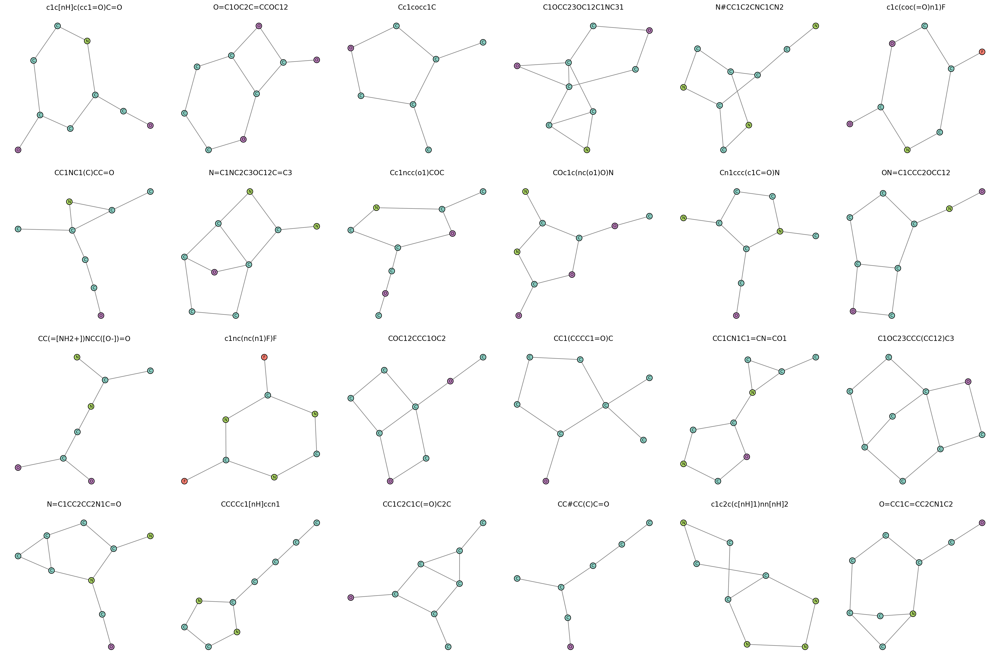

CPU times: user 19.4 s, sys: 1.08 s, total: 20.4 s
Wall time: 20.1 s


In [60]:
%%time
# ===== QM9 / molecule dataset construction =====
if DATASET_MODE == "qm9":
    from pathlib import Path
    from collections import Counter

    import networkx as nx
    import numpy as np
    import pandas as pd
    from rdkit import Chem
    from sklearn.model_selection import train_test_split

    def _bond_to_label(bond):
        value = bond.GetBondTypeAsDouble()
        if abs(value - 1.5) < 1e-8:
            return "1.5"
        if float(value).is_integer():
            return str(int(value))
        return str(value)

    def _mol_to_nx_molecule(mol, *, keep_h=False, graph_id=None, target=None):
        if mol is None:
            return None
        mol = Chem.Mol(mol)
        if not keep_h:
            mol = Chem.RemoveHs(mol)
        if mol.GetNumAtoms() == 0 or mol.GetNumBonds() == 0:
            return None

        G = nx.Graph()
        for atom in mol.GetAtoms():
            idx = atom.GetIdx()
            symbol = atom.GetSymbol()
            G.add_node(
                idx,
                label=symbol,
                display_label=symbol,
                true_label=symbol,
                atomic_num=int(atom.GetAtomicNum()),
            )
        for bond in mol.GetBonds():
            label = _bond_to_label(bond)
            G.add_edge(
                bond.GetBeginAtomIdx(),
                bond.GetEndAtomIdx(),
                label=label,
                true_label=label,
                edge_attr=label,
            )

        try:
            G.graph["smiles"] = Chem.MolToSmiles(mol)
        except Exception:
            pass
        if graph_id is not None:
            G.graph["id"] = graph_id
        if target is not None:
            G.graph["target"] = target
        return G

    def _load_molecules_from_path(path, *, max_graphs=None, smiles_column="smiles", target_column=None, keep_h=False):
        path = Path(path).expanduser()
        if not path.exists():
            raise FileNotFoundError(path)

        graphs = []
        targets = []
        suffix = path.suffix.lower()

        if suffix == ".sdf":
            supplier = Chem.SDMolSupplier(str(path), removeHs=not keep_h)
            iterator = enumerate(supplier)
            for idx, mol in iterator:
                G = _mol_to_nx_molecule(mol, keep_h=keep_h, graph_id=f"qm9_{idx}")
                if G is None:
                    continue
                graphs.append(G)
                targets.append(None)
                if max_graphs is not None and len(graphs) >= int(max_graphs):
                    break
        elif suffix in {".smi", ".smiles", ".txt"}:
            with path.open() as handle:
                for idx, line in enumerate(handle):
                    text = line.strip()
                    if not text:
                        continue
                    smiles = text.split()[0]
                    mol = Chem.MolFromSmiles(smiles)
                    G = _mol_to_nx_molecule(mol, keep_h=keep_h, graph_id=f"qm9_{idx}")
                    if G is None:
                        continue
                    G.graph["smiles"] = smiles
                    graphs.append(G)
                    targets.append(None)
                    if max_graphs is not None and len(graphs) >= int(max_graphs):
                        break
        elif suffix == ".csv":
            df = pd.read_csv(path)
            if smiles_column not in df.columns:
                raise ValueError(f"SMILES column {smiles_column!r} not found. Columns: {list(df.columns)}")
            for idx, row in df.iterrows():
                smiles = row[smiles_column]
                mol = Chem.MolFromSmiles(str(smiles))
                target = row[target_column] if target_column in df.columns else None
                G = _mol_to_nx_molecule(mol, keep_h=keep_h, graph_id=f"qm9_{idx}", target=target)
                if G is None:
                    continue
                G.graph["smiles"] = str(smiles)
                graphs.append(G)
                targets.append(target)
                if max_graphs is not None and len(graphs) >= int(max_graphs):
                    break
        else:
            raise ValueError("QM9_SOURCE_PATH must be .sdf, .smi/.smiles/.txt, or .csv")

        return graphs, targets

    if QM9_SOURCE_PATH is None:
        raise RuntimeError(
            "Set QM9_SOURCE_PATH to a local QM9 file first, e.g. '/path/to/gdb9.sdf' "
            "or a CSV with a SMILES column. No QM9 file is bundled in this repo."
        )

    all_graphs, all_targets = _load_molecules_from_path(
        QM9_SOURCE_PATH,
        max_graphs=QM9_MAX_GRAPHS,
        smiles_column=QM9_SMILES_COLUMN,
        target_column=QM9_TARGET_COLUMN,
        keep_h=QM9_KEEP_H,
    )
    if len(all_graphs) <= QM9_TEST_SIZE:
        raise RuntimeError(f"Need more than QM9_TEST_SIZE={QM9_TEST_SIZE} molecules; loaded {len(all_graphs)}.")

    train_graphs, test_graphs, train_targets, test_targets = train_test_split(
        all_graphs,
        all_targets,
        test_size=int(QM9_TEST_SIZE),
        random_state=int(QM9_RANDOM_STATE),
        shuffle=True,
    )

    dataset_name = "qm9_molecules"
    sampled_graphs = train_graphs
    sampled_targets = train_targets
    GRAPH_TYPES = ["qm9_molecule"]

    atom_counts = Counter(data["label"] for G in train_graphs for _, data in G.nodes(data=True))
    bond_counts = Counter(data["label"] for G in train_graphs for _, _, data in G.edges(data=True))
    node_counts = Counter(G.number_of_nodes() for G in train_graphs)

    print("Loaded QM9-style molecules:", len(all_graphs))
    print("train/test:", len(train_graphs), len(test_graphs))
    print("atom labels:", dict(atom_counts))
    print("bond labels:", dict(bond_counts))
    print("node-count range:", min(node_counts), "to", max(node_counts))

    try:
        from coco_grape.visualizer.mol_display import draw_molecules
        draw_molecules(train_graphs[:24], titles=[G.graph.get("smiles", str(i)) for i, G in enumerate(train_graphs[:24])], n_graphs_per_line=6, size=4)
    except Exception as exc:
        print("RDKit molecule preview failed; falling back to NetworkX later:", exc)
elif DATASET_MODE != "cycle_leg":
    raise ValueError(f"Unknown DATASET_MODE: {DATASET_MODE!r}")


In [61]:
from collections import Counter
import networkx as nx
import matplotlib.pyplot as plt

def plot_label_comparative_histogram(
    probe_train_graphs,
    decoded_graphs,
    conditioning_decoded_graphs,
    labels=('Probe Train Graphs', 'Decoded Graphs', 'Conditioning Decoded Graphs'),
    title='Comparative Histogram of Node Labels Across Graph Sets',
    figsize=(12, 6),
    bar_edgecolor='black',
    annotate=True,
    annotate_offset=3  # points above the bar
):
    """
    Plots a grouped bar chart comparing node 'label' attribute frequencies
    across three lists of networkx graphs.
    """

    def _norm_label(x):
        # Make everything a stable, comparable string key
        try:
            hash(x)            # ensure hashable; if not, fall back to repr
        except TypeError:
            x = repr(x)
        return str(x)

    def _get_label_counts(graph_list):
        counts = Counter()
        for G in graph_list:
            for v in nx.get_node_attributes(G, 'label').values():
                counts[_norm_label(v)] += 1
        return counts

    # Compute normalized label counts
    counts_list = [
        _get_label_counts(probe_train_graphs),
        _get_label_counts(decoded_graphs),
        _get_label_counts(conditioning_decoded_graphs)
    ]

    # Union of all stringified labels, sorted lexicographically
    all_labels = sorted(set().union(*[c.keys() for c in counts_list]))
    x = range(len(all_labels))
    width = 0.25

    # Align counts to all_labels order
    vals = [[c.get(lbl, 0) for lbl in all_labels] for c in counts_list]

    # Plot
    fig, ax = plt.subplots(figsize=figsize)
    bars1 = ax.bar([i - width for i in x], vals[0], width=width,
                   label=labels[0], edgecolor=bar_edgecolor)
    bars2 = ax.bar(x,               vals[1], width=width,
                   label=labels[1], edgecolor=bar_edgecolor)
    bars3 = ax.bar([i + width for i in x], vals[2], width=width,
                   label=labels[2], edgecolor=bar_edgecolor)

    # Annotate counts
    if annotate:
        for bar in list(bars1) + list(bars2) + list(bars3):
            height = bar.get_height()
            ax.annotate(
                f'{int(height)}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, annotate_offset),
                textcoords="offset points",
                ha='center',
                va='bottom'
            )

    ax.set_xticks(list(x))
    ax.set_xticklabels(all_labels, rotation=0, ha='right')
    ax.set_xlabel('Node Label')
    ax.set_ylabel('Frequency')
    ax.set_title(title)
    ax.legend()
    fig.tight_layout()
    plt.show()

# === WL & NSPDK MMD from NetworkX graphs (one cell) ==========================
import numpy as np, networkx as nx

def _to_simple_undirected(G):
    H = nx.Graph(G) if isinstance(G, (nx.DiGraph, nx.MultiDiGraph)) else G.copy()
    H.remove_edges_from(nx.selfloop_edges(H))
    return H

def _nonempty(graphs):
    return [G for G in graphs if _to_simple_undirected(G).number_of_nodes() > 0]

# ---------------- GraKeL conversion: build Graph objects ---------------------
def nx_to_grakel_wl(graphs, node_label_key="label"):
    """For WL+VertexHistogram: Graph(adjacency, node_labels, None)."""
    from grakel import Graph
    glist = []
    for G in _nonempty(graphs):
        H = _to_simple_undirected(G)
        nodes = list(H.nodes())
        n = len(nodes)
        idx = {u: i for i, u in enumerate(nodes)}
        A = np.zeros((n, n), dtype=int)
        for u, v in H.edges():
            i, j = idx[u], idx[v]
            A[i, j] = 1; A[j, i] = 1
        # node labels: use provided key if present, else a constant label "0"
        if all(node_label_key in H.nodes[u] for u in nodes):
            vlab = {idx[u]: str(H.nodes[u][node_label_key]) for u in nodes}
        else:
            vlab = {i: "0" for i in range(n)}
        glist.append(Graph(A, vlab, None))  # <-- removed directed kwarg
    return glist

def nx_to_grakel_nspdk(graphs, node_label_key="label"):
    """For NSPDK: Graph(adjacency, node_labels, edge_labels). Edge labels set to '1'."""
    from grakel import Graph
    glist = []
    for G in _nonempty(graphs):
        H = _to_simple_undirected(G)
        nodes = list(H.nodes())
        n = len(nodes)
        idx = {u: i for i, u in enumerate(nodes)}
        A = np.zeros((n, n), dtype=int)
        for u, v in H.edges():
            i, j = idx[u], idx[v]
            A[i, j] = 1; A[j, i] = 1
        # node labels: provided if present, else "0"
        if all(node_label_key in H.nodes[u] for u in nodes):
            vlab = {idx[u]: str(H.nodes[u][node_label_key]) for u in nodes}
        else:
            vlab = {i: "0" for i in range(n)}
        # edge labels: constant '1' on existing edges (both directions)
        elab = {}
        for u, v in H.edges():
            i, j = idx[u], idx[v]
            elab[(i, j)] = '1'
            elab[(j, i)] = '1'
        glist.append(Graph(A, vlab, elab))  # <-- removed directed kwarg
    return glist

# ---------------- MMD utilities ----------------------------------------------
def _mmd2_unbiased(Kxx, Kyy, Kxy):
    m, n = Kxx.shape[0], Kyy.shape[0]
    if m < 2 or n < 2: return np.nan, np.nan
    Kxx = Kxx.copy(); Kyy = Kyy.copy()
    np.fill_diagonal(Kxx, 0.0); np.fill_diagonal(Kyy, 0.0)
    term_x = Kxx.sum()/(m*(m-1))
    term_y = Kyy.sum()/(n*(n-1))
    term_xy = 2.0*Kxy.sum()/(m*n)
    mmd2 = term_x + term_y - term_xy
    return float(mmd2), float(np.sqrt(max(mmd2, 0.0)))

# ---------------- WL (VertexHistogram) MMD -----------------------------------
def wl_mmd(true_graphs, gen_graphs, node_label_key="label", n_iter=5, normalize=True):
    try:
        from grakel.kernels import WeisfeilerLehman, VertexHistogram
    except Exception as e:
        raise RuntimeError("GraKeL not installed. pip install grakel") from e
    Gx = nx_to_grakel_wl(true_graphs, node_label_key)
    Gy = nx_to_grakel_wl(gen_graphs,  node_label_key)
    if len(Gx) == 0 or len(Gy) == 0:
        return {"wl_mmd": np.nan, "wl_mmd2": np.nan, "note": "empty after parsing"}
    base_spec = (VertexHistogram, {"normalize": normalize})
    wl_x = WeisfeilerLehman(n_iter=n_iter, base_graph_kernel=base_spec, normalize=normalize)
    Kxx = wl_x.fit_transform(Gx)
    Kxy = wl_x.transform(Gy)
    wl_y = WeisfeilerLehman(n_iter=n_iter, base_graph_kernel=base_spec, normalize=normalize)
    Kyy = wl_y.fit_transform(Gy)
    mmd2, mmd = _mmd2_unbiased(Kxx, Kyy, Kxy)
    return {"wl_mmd": mmd, "wl_mmd2": mmd2, "wl_n_iter": n_iter}

# ---------------- NSPDK MMD ---------------------------------------------------
def nspdk_mmd(true_graphs, gen_graphs, node_label_key="label", r=1, d=6, normalize=True, n_jobs=-1):
    try:
        from grakel.kernels import NeighborhoodSubgraphPairwiseDistance as NSPDK
    except Exception as e:
        raise RuntimeError("GraKeL not installed. pip install grakel") from e
    Gx = nx_to_grakel_nspdk(true_graphs, node_label_key)
    Gy = nx_to_grakel_nspdk(gen_graphs,  node_label_key)
    if len(Gx) == 0 or len(Gy) == 0:
        return {"nspdk_mmd": np.nan, "nspdk_mmd2": np.nan, "note": "empty after parsing"}
    K = NSPDK(r=r, d=d, normalize=normalize, n_jobs=n_jobs)
    Kxx = K.fit_transform(Gx)
    Kxy = K.transform(Gy)
    Ky = NSPDK(r=r, d=d, normalize=normalize, n_jobs=n_jobs)
    Kyy = Ky.fit_transform(Gy)
    mmd2, mmd = _mmd2_unbiased(Kxx, Kyy, Kxy)
    return {"nspdk_mmd": mmd, "nspdk_mmd2": mmd2, "nspdk_r": r, "nspdk_d": d}

# # ---------------- Example run on your three sets ------------------------------
# # Assumes you already have: probe_train_graphs, decoded_graphs, conditioning_decoded_graphs
# wl_true_vs_nodes = wl_mmd(probe_train_graphs, decoded_graphs, n_iter=5, normalize=True)
# wl_true_vs_cond  = wl_mmd(probe_train_graphs, conditioning_decoded_graphs, n_iter=5, normalize=True)
# ns_true_vs_nodes = nspdk_mmd(probe_train_graphs, decoded_graphs, r=1, d=4, normalize=True)
# ns_true_vs_cond  = nspdk_mmd(probe_train_graphs, conditioning_decoded_graphs, r=1, d=4, normalize=True)

# print("WL  (true vs nodes):", wl_true_vs_nodes)
# print("WL  (true vs cond) :", wl_true_vs_cond)
# print("NSPDK (true vs nodes):", ns_true_vs_nodes)
# print("NSPDK (true vs cond) :", ns_true_vs_cond)


In [62]:
# ===== Optional split train into train1/train2, keep existing test split =====

from collections import Counter
from sklearn.model_selection import train_test_split

DO_TRAIN_SPLIT = True
USE_TRAIN1_FOR_DOWNSTREAM = False

if DO_TRAIN_SPLIT:

    def _canonical_graph_label(value, default_value=0):
        if value is None:
            value = default_value
        if isinstance(value, np.generic):
            value = value.item()
        if globals().get("DATASET_MODE", "cycle_leg") == "cycle_leg":
            try:
                return int(round(float(value)))
            except Exception:
                return int(default_value)
        return str(value)


    def _ensure_nsppk_labels(graphs, default_node_label=0, default_edge_label="1"):
        out = []

        for g in graphs:
            h = g.copy()

            for u in h.nodes():
                attrs = h.nodes[u]
                raw = attrs.get('label', attrs.get('display_label', attrs.get('true_label', default_node_label)))
                lbl = _canonical_graph_label(raw, default_node_label)

                attrs['label'] = lbl
                attrs['display_label'] = attrs.get('display_label', lbl)
                attrs['true_label'] = attrs.get('true_label', lbl)

            for u, v in h.edges():
                eattrs = h.edges[u, v]
                eraw = eattrs.get('label', eattrs.get('true_label', default_edge_label))
                elbl = _canonical_graph_label(eraw, default_edge_label)

                eattrs['label'] = elbl
                eattrs['edge_attr'] = eattrs.get('edge_attr', elbl)
                eattrs['true_label'] = eattrs.get('true_label', elbl)

            out.append(h)

        return out


    train_graphs = _ensure_nsppk_labels(train_graphs)
    test_graphs = _ensure_nsppk_labels(test_graphs)

    train_whole_graphs = [g.copy() for g in train_graphs]
    train_whole_targets = None if train_targets is None else list(train_targets)

    if train_whole_targets is None:
        train1_graphs, train2_graphs = train_test_split(
            train_whole_graphs,
            test_size=0.5,
            random_state=42,
        )
        train1_targets = None
        train2_targets = None
    else:
        counts = Counter(train_whole_targets)
        can_stratify = len(counts) > 1 and min(counts.values()) >= 2
        stratify_arg = train_whole_targets if can_stratify else None

        train1_graphs, train2_graphs, train1_targets, train2_targets = train_test_split(
            train_whole_graphs,
            train_whole_targets,
            test_size=0.5,
            random_state=42,
            stratify=stratify_arg,
        )

    if USE_TRAIN1_FOR_DOWNSTREAM:
        train_graphs = train1_graphs
        train_targets = train1_targets
        print('downstream training source: train1')
    else:
        train_graphs = train_whole_graphs
        train_targets = train_whole_targets
        print('downstream training source: train_whole')

    print('train_whole/train1/train2/test:', len(train_whole_graphs), len(train1_graphs), len(train2_graphs), len(test_graphs))
    if train_whole_targets is None:
        print('train_whole class counts: unlabeled')
        print('train1 class counts     : unlabeled')
        print('train2 class counts     : unlabeled')
        print('test class counts       : unlabeled')
    else:
        print('train_whole class counts:', Counter(train_whole_targets))
        print('train1 class counts     :', Counter(train1_targets))
        print('train2 class counts     :', Counter(train2_targets))
        print('test class counts       :', Counter(test_targets))


    # ===== Debug classifier: NSPPK on train1/train2/train1+train2 =====

    import numpy as np
    from sklearn.ensemble import ExtraTreesClassifier
    from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score
    from coco_grape.graph_vectorizer.nsppk import NSPPK


    def _safe_f1(y_true, y_pred):
        labels = sorted(set(y_true) | set(y_pred))
        if len(labels) <= 2:
            return float(f1_score(y_true, y_pred, zero_division=0))
        return float(f1_score(y_true, y_pred, average='macro', zero_division=0))


    def _evaluate_split_repeated(graphs, targets, label, n_repeats=10, base_seed=42):
        if not graphs:
            print(f'{label}: no graphs to evaluate')
            return

        targets = list(targets)
        counts = Counter(targets)
        if len(graphs) < 5 or len(counts) < 2 or min(counts.values()) < 2:
            print(f'{label}: skipped repeated eval, too few examples/classes: {counts}')
            return

        f1_vals = []
        bal_vals = []
        acc_vals = []

        for rep in range(int(n_repeats)):
            seed = int(base_seed) + rep
            idx = np.arange(len(graphs))

            tr_idx, va_idx = train_test_split(
                idx,
                test_size=0.2,
                random_state=seed,
                stratify=targets,
            )

            g_tr = [graphs[i] for i in tr_idx]
            g_va = [graphs[i] for i in va_idx]
            y_tr = [targets[i] for i in tr_idx]
            y_va = [targets[i] for i in va_idx]

            vec = NSPPK(radius=1, distance=4, connector=0, nbits=12, dense=False, parallel=False)
            X_tr = vec.fit_transform(g_tr, y_tr)
            X_va = vec.transform(g_va)

            clf = ExtraTreesClassifier(n_estimators=300, random_state=seed, n_jobs=-1)
            clf.fit(X_tr, y_tr)
            preds = clf.predict(X_va)

            f1_vals.append(_safe_f1(y_va, preds))
            bal_vals.append(float(balanced_accuracy_score(y_va, preds)))
            acc_vals.append(float(accuracy_score(y_va, preds)))

        print(
            f"{label} summary: "
            f"f1={np.mean(f1_vals):.3f}+-{np.std(f1_vals):.3f} "
            f"bal={np.mean(bal_vals):.3f}+-{np.std(bal_vals):.3f} "
            f"acc={np.mean(acc_vals):.3f}+-{np.std(acc_vals):.3f}"
        )


    N_REPEATS = 1
    BASE_SEED = int(globals().get('SEED', 42))

    if train_whole_targets is None:
        print('NSPPK split classifier skipped: graph targets are unlabeled')
    else:
        _evaluate_split_repeated(train1_graphs, train1_targets, 'train1', n_repeats=N_REPEATS, base_seed=BASE_SEED)
        _evaluate_split_repeated(train2_graphs, train2_targets, 'train2', n_repeats=N_REPEATS, base_seed=BASE_SEED)

        combined_graphs = train1_graphs + train2_graphs
        combined_targets = list(train1_targets) + list(train2_targets)
        _evaluate_split_repeated(combined_graphs, combined_targets, 'train1+train2', n_repeats=N_REPEATS, base_seed=BASE_SEED)


downstream training source: train_whole
train_whole/train1/train2/test: 49400 24700 24700 600
train_whole class counts: Counter({None: 49400})
train1 class counts     : Counter({None: 24700})
train2 class counts     : Counter({None: 24700})
test class counts       : Counter({None: 600})
train1: skipped repeated eval, too few examples/classes: Counter({None: 24700})
train2: skipped repeated eval, too few examples/classes: Counter({None: 24700})
train1+train2: skipped repeated eval, too few examples/classes: Counter({None: 49400})


In [63]:
nbits = 13
verbose = True

In [64]:
import numpy as np
from scipy import sparse
import torch
import pickle
from pathlib import Path
from torch_geometric.loader import DataLoader

from coco_grape.module.quotientgraph.display import (
    display,
    display_mappings,
    display_decomposition_graph,
    decomposition_to_graph,
)
from coco_grape.module.quotientgraph.vectorize import (
    QuotientGraphTransformer,
    QuotientGraphNodeTransformer,
)
from coco_grape.module.quotientgraph.operator import *

from coco_grape.data_processor.generative.nn_embedding_vectorizer import (
    NnGraphVectorizer,
    NnVectorizerConfig,
    get_pyg_graphs_from_nx,
)

from coco_grape.graph_vectorizer.nsppk import NSPPK, NodeNSPPK


# ============================================================
# Choose vectorizers here
# ============================================================
NODE_VECTORIZER_MODE = globals().get(
    "NODE_VECTORIZER_MODE",
    "nsppk" if globals().get("DATASET_MODE", "cycle_leg") == "qm9" else "quotient",
)
GRAPH_VECTORIZER_MODE = globals().get(
    "GRAPH_VECTORIZER_MODE",
    "frozen_nsppk_svd" if globals().get("DATASET_MODE", "cycle_leg") == "qm9" else "nsppk",
)

NN_EMBED_MODE = "train"
NN_HIDDEN_DIM = 128
NN_NUM_LAYERS = 5
NN_EPOCHS = 1000
NN_BATCH_SIZE = 64
NN_LR = 1e-3
NN_DEVICE = "cpu"

nbits = 14  # NSPPK hash bits for graph-level condition: output dimension is 2**14 = 16384

NSPPK_PARAMS = dict(
    radius=1,
    distance=4,
    connector=1,
    nbits=nbits,
    dense=True,
    parallel=True,
    use_edges_as_features=True,
)


# ============================================================
# Shared helpers
# ============================================================
def _canonical_vectorizer_label(raw, default_value=0):
    if raw is None:
        raw = default_value
    if isinstance(raw, np.generic):
        raw = raw.item()
    if globals().get("DATASET_MODE", "cycle_leg") == "cycle_leg":
        try:
            return int(round(float(raw)))
        except Exception:
            return int(default_value)
    return str(raw)


def make_safe_graph_labels(graphs, default_node_label=0, default_edge_label="1"):
    out = []

    for G in graphs:
        H = G.copy()

        for u, data in H.nodes(data=True):
            raw = data.get("label", data.get("plot_label", data.get("display_label", default_node_label)))
            label = _canonical_vectorizer_label(raw, default_node_label)

            data["label"] = label
            data["attr"] = data.get("attr", label)
            data["display_label"] = data.get("display_label", label)

        for u, v, data in H.edges(data=True):
            raw = data.get("label", data.get("plot_label", default_edge_label))
            label = _canonical_vectorizer_label(raw, default_edge_label)

            data["label"] = label
            data["edge_attr"] = data.get("edge_attr", label)

        out.append(H)

    return out


def make_quotient_df():
    df0_list = [
        compose(combination(distance=(d, d)), node(), prepend_label(label=d))
        for d in range(2, 10)
    ]
    df0 = add(*df0_list)

    df1 = add(
        df0,
        cycle(),
        tree(),
        path(number_of_edges=(1, 3)),
        neighborhood(radius=(0, 2)),
    )

    df2 = compose(df1, unlabel())
    return add(df1, df2)


def draw(graph, df, nbits):
    display_decomposition_graph(decomposition_to_graph(df))
    qg = QuotientGraph(graph=graph).create_default_image_node().update()
    qg = df(qg)
    qg.update()
    display(qg)
    display_mappings(qg)


# ============================================================
# Learned graph-level C vectorizer
# ============================================================
class DenseNnGraphVectorizer:
    def __init__(
        self,
        feature_extractor="graphcl",
        dataset_name="my_dataset",
        mode="train",
        fit_targets=None,
        hidden_dim=128,
        num_layers=4,
        epochs=300,
        batch_size=64,
        lr=1e-3,
        device="cpu",
    ):
        self.feature_extractor = feature_extractor
        self.dataset_name = dataset_name
        self.mode = mode
        self.fit_targets = fit_targets
        self.is_fitted_ = False

        self.config = NnVectorizerConfig(
            hidden_dim=hidden_dim,
            num_layers=num_layers,
            epochs=epochs,
            batch_size=batch_size,
            lr=lr,
            device=device,
            allow_random_fallback=True,
        )

        self.vec = NnGraphVectorizer(
            feature_extractor=feature_extractor,
            dataset_name=dataset_name,
            mode=mode,
            config=self.config,
        )

    def fit(self, graphs, y=None):
        if self.is_fitted_ and y is None:
            return self

        targets = y
        if targets is None and self.fit_targets is not None and len(self.fit_targets) == len(graphs):
            targets = self.fit_targets

        graphs = make_safe_graph_labels(graphs)
        self.vec.fit(graphs, targets=targets)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)

        graphs = make_safe_graph_labels(graphs)
        X = self.vec.transform(graphs)

        if isinstance(X, tuple):
            X = X[0]

        if sparse.issparse(X):
            X = X.toarray()

        return np.asarray(X, dtype=float)

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


# ============================================================
# Learned node-level X vectorizer
# ============================================================
class LearnedGNNNodeVectorizer:
    def __init__(self, graph_vectorizer_ref, batch_size=64, device="cpu"):
        self.graph_vectorizer_ref = graph_vectorizer_ref
        self.batch_size = batch_size
        self.device = torch.device(device)
        self.is_fitted_ = False

    def fit(self, graphs, y=None):
        if not getattr(self.graph_vectorizer_ref, "is_fitted_", False):
            self.graph_vectorizer_ref.fit(graphs, y)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)

        safe_graphs = make_safe_graph_labels(graphs)
        pyg_graphs = get_pyg_graphs_from_nx(safe_graphs)

        model = self.graph_vectorizer_ref.vec.model
        model = model.to(self.device)
        model.eval()

        loader = DataLoader(pyg_graphs, batch_size=self.batch_size, shuffle=False)
        out = []
        offset = 0

        with torch.no_grad():
            for batch in loader:
                batch = batch.to(self.device)

                node_z, _ = model(
                    batch.x.float(),
                    batch.edge_index,
                    batch.batch,
                    batch.edge_attr.float(),
                )

                node_z = node_z.cpu().numpy()
                batch_ids = batch.batch.cpu().numpy()
                n_graphs_in_batch = int(batch_ids.max()) + 1 if batch_ids.size else 0

                for local_b in range(n_graphs_in_batch):
                    Z = node_z[batch_ids == local_b]
                    G = safe_graphs[offset + local_b]
                    nodes = list(G.nodes())

                    existence = np.ones((len(nodes), 1), dtype=float)
                    degrees = np.array([G.degree[u] for u in nodes], dtype=float).reshape(-1, 1)

                    # Preserve existence + degree. Labels will be inserted later by DED.encode().
                    X = np.hstack([existence, degrees, Z])
                    out.append(X)

                offset += n_graphs_in_batch

        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


# ============================================================
# NSPPK node-level X vectorizer
# ============================================================
# ============================================================
# Frozen QM9 NSPPK-SVD graph-level C vectorizer
# ============================================================
class FrozenQM9NSPPKSVDGraphVectorizer:
    """
    Graph-level condition vectorizer that exactly reuses the frozen DiGress
    NSPPK-14 -> TruncatedSVD-128 projector.

    This is the path to use when comparing Denoise and Conditional DiGress:
    both models receive the same 128-dimensional condition_y vectors.
    """
    def __init__(
        self,
        bundle_path=None,
        fit_targets=None,
    ):
        parent_artifact = Path(
            "/home/links/cs843/Denoise-generator/data/qm9_condition_artifacts/qm9_nsppk14_svd128_condition_projector.pkl"
        )
        digress_artifact = Path(
            "/home/links/cs843/Denoise-generator/DiGress/qm9_condition_artifacts/qm9_nsppk14_svd128_condition_projector.pkl"
        )
        self.bundle_path = Path(bundle_path) if bundle_path is not None else (
            parent_artifact if parent_artifact.exists() else digress_artifact
        )
        self.fit_targets = fit_targets
        self.bundle = None
        self.base = None
        self.is_fitted_ = False

    def _load_bundle(self):
        if self.bundle is None:
            if not self.bundle_path.exists():
                raise RuntimeError(
                    f"Missing frozen NSPPK-SVD projector: {self.bundle_path}. "
                    "Run the QM9 NSPPK-SVD export cell in "
                    "DiGress/qm9_condition_digress_experiment.ipynb first."
                )
            with open(self.bundle_path, "rb") as f:
                self.bundle = pickle.load(f)
        return self.bundle

    def fit(self, graphs, y=None):
        bundle = self._load_bundle()
        self.base = NSPPK(**bundle["nsppk_params"])
        targets = y
        if targets is None and self.fit_targets is not None and len(self.fit_targets) == len(graphs):
            targets = self.fit_targets
        self.base.fit(make_safe_graph_labels(graphs), targets)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)
        bundle = self._load_bundle()
        raw = self.base.transform(make_safe_graph_labels(graphs))
        projected = bundle["projector"].transform(raw).astype(np.float32)
        condition_y = (projected - bundle["condition_mean"]) / bundle["condition_std"]
        return np.asarray(condition_y, dtype=np.float32)

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


class NSPPKNodeVectorizer:
    """
    Wraps NodeNSPPK so it follows the same contract as quotient/GraphCL node modes.

    Output BEFORE DecompositionalEncoderDecoder.encode():
      col 0 = existence = 1
      col 1 = NetworkX degree
      col 2... = NSPPK node features

    Then DED.encode() inserts node labels at col 2:
      col 0 = existence
      col 1 = degree
      col 2 = injected node label
      col 3... = NSPPK node features
    """
    def __init__(self, nsppk_params=None):
        self.nsppk_params = dict(nsppk_params or {})
        self.base = NodeNSPPK(**self.nsppk_params)
        self.is_fitted_ = False

    def fit(self, graphs, y=None):
        graphs = make_safe_graph_labels(graphs)
        self.base.fit(graphs, y)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)

        safe_graphs = make_safe_graph_labels(graphs)
        base_X = self.base.transform(safe_graphs)

        out = []
        for G, X in zip(safe_graphs, base_X):
            if sparse.issparse(X):
                X = X.toarray()

            X = np.asarray(X, dtype=float)
            nodes = list(G.nodes())

            if X.shape[0] != len(nodes):
                raise ValueError(
                    f"NodeNSPPK returned {X.shape[0]} rows, but graph has {len(nodes)} nodes."
                )

            existence = np.ones((len(nodes), 1), dtype=float)
            degrees = np.array([G.degree[u] for u in nodes], dtype=float).reshape(-1, 1)

            X = np.hstack([existence, degrees, X])
            out.append(X)

        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


# ============================================================
# Build selected vectorizers
# ============================================================
df = make_quotient_df()

if GRAPH_VECTORIZER_MODE == "quotient":
    graph_vectorizer = QuotientGraphTransformer(
        decomposition_function=df,
        nbits=nbits,
    )

elif GRAPH_VECTORIZER_MODE == "nsppk":
    graph_vectorizer = NSPPK(**NSPPK_PARAMS)

elif GRAPH_VECTORIZER_MODE == "frozen_nsppk_svd":
    if globals().get("DATASET_MODE", "cycle_leg") != "qm9":
        raise ValueError("GRAPH_VECTORIZER_MODE='frozen_nsppk_svd' is only for DATASET_MODE='qm9'.")
    graph_vectorizer = FrozenQM9NSPPKSVDGraphVectorizer(fit_targets=train_targets)

elif GRAPH_VECTORIZER_MODE in {"graphcl", "infograph", "gin-random"}:
    graph_vectorizer = DenseNnGraphVectorizer(
        feature_extractor=GRAPH_VECTORIZER_MODE,
        dataset_name=f"{dataset_name}_{GRAPH_VECTORIZER_MODE}_h{NN_HIDDEN_DIM}_l{NN_NUM_LAYERS}",
        mode=NN_EMBED_MODE,
        fit_targets=train_targets,
        hidden_dim=NN_HIDDEN_DIM,
        num_layers=NN_NUM_LAYERS,
        epochs=NN_EPOCHS,
        batch_size=NN_BATCH_SIZE,
        lr=NN_LR,
        device=NN_DEVICE,
    )

else:
    raise ValueError(
        "GRAPH_VECTORIZER_MODE must be 'quotient', 'nsppk', 'frozen_nsppk_svd', 'graphcl', 'infograph', or 'gin-random'"
    )


LEARNED_MODES = {"graphcl", "infograph", "gin-random"}

if NODE_VECTORIZER_MODE == "quotient":
    node_graph_vectorizer = QuotientGraphNodeTransformer(
        decomposition_function=df,
        nbits=nbits,
    )

elif NODE_VECTORIZER_MODE == "nsppk":
    node_graph_vectorizer = NSPPKNodeVectorizer(NSPPK_PARAMS)

elif NODE_VECTORIZER_MODE in LEARNED_MODES:
    if GRAPH_VECTORIZER_MODE != NODE_VECTORIZER_MODE:
        raise ValueError(
            "For learned node embeddings, set GRAPH_VECTORIZER_MODE equal to "
            "NODE_VECTORIZER_MODE so both use the same fitted backbone."
        )

    node_graph_vectorizer = LearnedGNNNodeVectorizer(
        graph_vectorizer_ref=graph_vectorizer,
        batch_size=NN_BATCH_SIZE,
        device=NN_DEVICE,
    )

else:
    raise ValueError(
        "NODE_VECTORIZER_MODE must be 'quotient', 'nsppk', 'graphcl', 'infograph', or 'gin-random'"
    )


# Fit once here for checks. DED.fit() will not retrain DenseNnGraphVectorizer when already fitted.
graph_vectorizer.fit(train_graphs, train_targets)
node_graph_vectorizer.fit(train_graphs, train_targets)

_tmp_X = node_graph_vectorizer.transform(train_graphs[:3])
_tmp_C = graph_vectorizer.transform(train_graphs[:3])

print("NODE_VECTORIZER_MODE:", NODE_VECTORIZER_MODE)
print("GRAPH_VECTORIZER_MODE:", GRAPH_VECTORIZER_MODE)
print("node X shapes before label insertion:", [x.shape for x in _tmp_X])
print("graph C shape:", _tmp_C.shape)
if GRAPH_VECTORIZER_MODE == "frozen_nsppk_svd":
    print("Using frozen NSPPK-SVD bundle:", graph_vectorizer.bundle_path)
    print("Frozen condition kind:", graph_vectorizer.bundle.get("condition_kind"))

print()
node_label_width = len({str(data.get("label")) for G in train_graphs for _, data in G.nodes(data=True)})
print("After DecompositionalEncoderDecoder.encode(), one-hot labels start at col 2.")
print("Node label one-hot width:", node_label_width)
print("Expected final node X dim:", _tmp_X[0].shape[1] + node_label_width)


NODE_VECTORIZER_MODE: nsppk
GRAPH_VECTORIZER_MODE: frozen_nsppk_svd
node X shapes before label insertion: [(9, 16386), (9, 16386), (7, 16386)]
graph C shape: (3, 128)
Using frozen NSPPK-SVD bundle: /home/links/cs843/Denoise-generator/data/qm9_condition_artifacts/qm9_nsppk14_svd128_condition_projector.pkl
Frozen condition kind: nsppk_truncated_svd

After DecompositionalEncoderDecoder.encode(), one-hot labels start at col 2.
Node label one-hot width: 4
Expected final node X dim: 16390


In [65]:
import numpy as np
import networkx as nx
from collections import Counter

class GraphSummaryConditionVectorizer:
    def __init__(
        self,
        node_label_attr="label",
        edge_label_attr="label",
        max_degree=8,
        include_motif_metadata=True,
    ):
        self.node_label_attr = node_label_attr
        self.edge_label_attr = edge_label_attr
        self.max_degree = max_degree
        self.include_motif_metadata = include_motif_metadata
        self.node_labels_ = None
        self.edge_labels_ = None

    def fit(self, graphs, y=None):
        node_labels = set()
        edge_labels = set()

        for g in graphs:
            for _, data in g.nodes(data=True):
                node_labels.add(data.get(self.node_label_attr, None))
            for _, _, data in g.edges(data=True):
                edge_labels.add(data.get(self.edge_label_attr, None))

        self.node_labels_ = sorted(node_labels, key=repr)
        self.edge_labels_ = sorted(edge_labels, key=repr)
        return self

    def transform(self, graphs):
        if self.node_labels_ is None:
            raise RuntimeError("Call fit() before transform().")

        return np.stack([self._vectorize_one(g) for g in graphs])

    def fit_transform(self, graphs, y=None):
        return self.fit(graphs, y).transform(graphs)

    def _vectorize_one(self, g):
        n = g.number_of_nodes()
        m = g.number_of_edges()

        degrees = [d for _, d in g.degree()]
        deg_counts = [sum(d == k for d in degrees) for k in range(self.max_degree + 1)]
        deg_over = sum(d > self.max_degree for d in degrees)

        node_counter = Counter(
            data.get(self.node_label_attr, None)
            for _, data in g.nodes(data=True)
        )
        edge_counter = Counter(
            data.get(self.edge_label_attr, None)
            for _, _, data in g.edges(data=True)
        )

        node_label_counts = [node_counter.get(lbl, 0) for lbl in self.node_labels_]
        edge_label_counts = [edge_counter.get(lbl, 0) for lbl in self.edge_labels_]

        if n > 0:
            avg_degree = float(np.mean(degrees))
            max_degree = float(np.max(degrees))
        else:
            avg_degree = 0.0
            max_degree = 0.0

        cycle_basis = nx.cycle_basis(g) if not g.is_directed() else []
        num_cycles = len(cycle_basis)
        max_cycle = max((len(c) for c in cycle_basis), default=0)

        try:
            components = list(nx.connected_components(g.to_undirected()))
            num_components = len(components)
            largest_component = max((len(c) for c in components), default=0)
        except Exception:
            num_components = 0
            largest_component = 0

        vec = [
            n,
            m,
            avg_degree,
            max_degree,
            num_components,
            largest_component,
            num_cycles,
            max_cycle,
            *deg_counts,
            deg_over,
            *node_label_counts,
            *edge_label_counts,
        ]

        if self.include_motif_metadata:
            vec.extend([
                g.graph.get("target_size", 0),
                g.graph.get("connector_size", 0),
                g.graph.get("context_size", 0),
                g.graph.get("branch_count", 0),
            ])

        return np.asarray(vec, dtype=float)
    

class DegreeOnlyNodeVectorizer:
    def fit(self, graphs, y=None):
        return self

    def transform(self, graphs, y=None):
        out = []
        for G in graphs:
            nodes = list(G.nodes())
            existence = np.ones((len(nodes), 1), dtype=float)
            degrees = np.array([G.degree[u] for u in nodes], dtype=float).reshape(-1, 1)

            # DED.encode() will insert node label at col 2 later.
            # So before label insertion: col 0 existence, col 1 degree.
            out.append(np.hstack([existence, degrees]))
        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)

# graph_vectorizer = QuotientGraphTransformer(
#     decomposition_function=df,
#     nbits=nbits,
# )
# graph_vectorizer = GraphSummaryConditionVectorizer(
#     node_label_attr="label",
#     edge_label_attr="label",
#     max_degree=8,
#     include_motif_metadata=True,
# )
# node_graph_vectorizer = DegreeOnlyNodeVectorizer()

# train_conds = graph_vectorizer.fit_transform(train_graphs)
# test_conds = graph_vectorizer.transform(test_graphs)

In [66]:
class MotifScaffoldNodeVectorizer:
    def fit(self, graphs, y=None):
        roles = set()
        types = set()
        node_roles = set()

        for G in graphs:
            for _, data in G.nodes(data=True):
                roles.add(data.get("motif_role", data.get("motif", "none")))
                types.add(data.get("motif_type", "none"))
                node_roles.add(data.get("node_role", "none"))

        self.roles_ = sorted(roles, key=repr)
        self.types_ = sorted(types, key=repr)
        self.node_roles_ = sorted(node_roles, key=repr)
        return self

    def transform(self, graphs, y=None):
        out = []
        for G in graphs:
            nodes = list(G.nodes())
            rows = []

            for u in nodes:
                data = G.nodes[u]
                existence = 1.0
                degree = float(G.degree[u])

                role = data.get("motif_role", data.get("motif", "none"))
                motif_type = data.get("motif_type", "none")
                node_role = data.get("node_role", "none")

                role_oh = [float(role == r) for r in self.roles_]
                type_oh = [float(motif_type == t) for t in self.types_]
                node_role_oh = [float(node_role == r) for r in self.node_roles_]

                is_leaf = float(G.degree[u] == 1)
                is_branch = float(G.degree[u] >= 3)

                rows.append([
                    existence,
                    degree,
                    is_leaf,
                    is_branch,
                    *role_oh,
                    *type_oh,
                    *node_role_oh,
                ])

            out.append(np.asarray(rows, dtype=float))

        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)

# node_graph_vectorizer = MotifScaffoldNodeVectorizer()
# graph_vectorizer = GraphSummaryConditionVectorizer(...)


# Train

In [67]:
from sklearn.ensemble import RandomForestClassifier  # keep for later
from coco_grape.data_processor.supervised.low_rank_mlp import LowRankMLP
from coco_grape.data_processor.generative.conditional_denoising_node_generator import (
    ConditionalNodeGenerator as DenoiseNodeGen,
)
from coco_grape.data_processor.generative.decompositional_encoder_decoder import (
    ConditionalNodeGeneratorModel,
    DecompositionalNodeEncoderDecoder,
    DecompositionalEncoderDecoder,
)

from coco_grape.data_processor.generative.conditional_edge_diffusion_generator import (
    ConditionalEdgeDiffusionGenerator,
)


# ----------------------------
# Global run config
# ----------------------------
verbose = True

# Training/inference defaults
batch_size = 32
max_epochs_cls = 500
cls_lr_patience = 100

# Checkpointing policy for LowRankMLP classifiers
CHECKPOINT_POLICY = "best"  # "best" | "last" | "all" | "off"

ckpt_common = dict(
    dataset_name=dataset_name,
    checkpoint_dir="lightning_ckpts",
    checkpoint_name=None,            # auto-name
    checkpoint_policy=CHECKPOINT_POLICY,
    save_weights_only=True,
)

# ----------------------------
# Conditional denoising generator config
# ----------------------------
latent_embedding_dimension = 128
number_of_transformer_layers = 4
transformer_attention_head_count = 8
transformer_dropout = 0.05

learning_rate = 3e-4
maximum_epochs = 5000
batch_size_gen = 32
early_stop_patience = 100

total_steps = 50



degree_temperature = None  # None uses raw argmax/probs. Lower values sharpen degree sampling if supported; usually keep None.
max_distance_class = 3  # Distance classes for optional distance supervision: 0..3 means distances 1,2,3,4+. Only matters if distance supervision is on.

lambda_recon_importance = 0  # Weight for continuous reconstruction/epsilon loss on non-discrete tail features. Try 5, 10, 20.

lambda_degree_importance = 60 # Weight for degree CE loss. Higher improves degree accuracy; try 20, 30, 50.
balance_degree_loss = True  # True reweights rare degrees. False may overpredict common degree 2.
degree_class_weight_cap = 2  # Max degree class reweighting. 2 is mild; 5 is stronger but noisier.

lambda_node_exist_importance = 5  # Weight for existence head. Higher enforces real vs padded rows. 1-5 is usually fine.

lambda_edge_importance = 5  # Weight for edge existence head. Higher trains edge probs more; too high can dominate node learning.
lambda_clean_edge_importance = 0  # Extra edge loss on clean X0. 0 disables; try 1-5 only if edge head on clean X is weak.
balance_edge_loss = True  # True balances edge/non-edge classes. Useful because non-edges are much more common.




lambda_label_importance = 140  # Weight for node-label CE. High because labels are your current weak point. Try 50, 100, 150.
balance_label_loss = True
label_class_weight_cap = 2


lambda_edge_label_importance = (120 if globals().get("DATASET_MODE") == "qm9" else 0)  # Molecules need bond-label CE; cycles can leave this off.
lambda_consistency = 0.3  # Penalizes nonzero tail features on padded/nonexistent rows. 0 disables; try 0.1-0.3 for variable-size graphs.

lambda_x0_importance = 10  # Weight for direct clean-table reconstruction. Helps anchor denoising/bridge to X0. Try 1, 5, 10.

lambda_condition_x0_importance = 0  # Weight for direct C->X prior head. 0 disables; >0 can help but may become a shortcut.
condition_x0_sampling_blend = 0  # Amount of C->X prior used at sampling. 0 = no prior; 1 = mostly direct prior, less honest diffusion.

lambda_distance_importance = 1  # Weight for pairwise distance supervision. 0 disables.
use_distance_supervision = True  # False disables distance head/data. True can help structure if distance targets are prepared.
use_molecular_valency_projection = globals().get("DATASET_MODE", "cycle_leg") == "qm9"
molecular_valency_downgrade_bonds = True
distance_edge_blend = 0  # Blend distance-derived edge signal into edge generation. 0 disables.





noise_degree_factor = 10  # Reduces Gaussian noise on degree column by this factor. Higher preserves degree more.
noise_label_factor = 10  # Reduces Gaussian noise on label column by this factor. Higher preserves labels more.

use_dim_reduction = True  # Reduces quotient/hash tail while preserving the discrete node prefix.
dim_reduction_method = "svd"  # "svd" works well for sparse/hash-like quotient features. "pca" is alternative for dense features.
dim_reduction_components = 128  # Tail dimension kept after reduction. For your current experiments I recommend 256, not 2048.
dim_reduction_keep_prefix = "auto"  # Learns 2 + number_of_unique_node_labels from the dataset.
pca_whiten = False  # Whitening can destabilize scaling/training. Keep False unless you know PCA needs it.

use_condition_dim_reduction = False
condition_dim_reduction_method = "svd"
condition_dim_reduction_components = 128
condition_dim_reduction_keep_prefix = 0

sigma_min = 0.01  # Lowest noise level. Smaller like 0.001/0.01 teaches near-clean repair; larger like 0.05 skips very-clean states.
sigma_max = 0.1  # Highest noise/bridge level. 0.3 is easier/local; 1.0 is harder/global; >1.0 may become unstable.
sampling_final_sigma = 0.0  # Final sample noise. 0.0 gives clean output; >0 keeps residual noise/diversity but usually hurts decoding.

denoise_discrete_channels = False  # False: degree/label use CE heads. True: also denoise degree/label as continuous values; usually worse for classes.
discrete_diffusion_mode = "absorbing"  # "none": no discrete corruption. "random_replace": replace with random class. "absorbing": replace with mask/unknown class.

row_embedding_scale = 0.0# 0.0 disables row positions. 0.05 small row-order hint. 0.1 stronger but can overfit to canonical order.

discrete_projection_sigma_threshold = 0  # 1.0 snaps labels early. 0.25 snaps late. 0.0 only final projection, least lock-in.
random_row_permutation=True
use_matched_row_loss = True

project_existence_during_sampling = True
project_degree_during_sampling = True
project_label_during_sampling = True

# Dataset-adaptive graph size control. Fixed-size datasets use their single
# observed count; variable-size datasets learn condition -> valid node count.
use_condition_node_count = True

# Dataset-adaptive degree-pattern control. This predicts the number of nodes
# in each degree class, then assigns those classes using row-level logits.
use_condition_degree_histogram = True

# Dataset-adaptive label-composition control. This predicts the number
# of nodes in each label class, then assigns those labels using row logits.
use_condition_label_histogram = True


"""
Too many generated edges: raise threshold to 0.45, then 0.50.
Too few edges: lower threshold to 0.35.
Degree/label collapse: reduce message-passing steps. Prefer 1; test 2 afterward.
Sampling changes too slowly: lower momentum toward 0.5.
Sampling unstable between steps: raise momentum toward 0.8.
Model cannot remove incorrect edges: raise delete probability to 0.25.
Model misses potential edges: raise add probability to 0.07.
"""


use_joint_edge_denoising = True
joint_edge_message_passing_steps = 3
joint_edge_delete_prob = 0.10
joint_edge_add_prob = 0.02
joint_edge_update_momentum = 0.7
joint_edge_threshold = 0.40



conditional_node_generator_model = DenoiseNodeGen(
    latent_embedding_dimension=latent_embedding_dimension,
    number_of_transformer_layers=number_of_transformer_layers,
    transformer_attention_head_count=transformer_attention_head_count,
    transformer_dropout=transformer_dropout,
    learning_rate=learning_rate,
    maximum_epochs=maximum_epochs,
    batch_size=batch_size_gen,
    total_steps=total_steps,
    verbose=verbose,

    degree_temperature=degree_temperature,
    balance_degree_loss=balance_degree_loss,
    degree_class_weight_cap=degree_class_weight_cap,
    lambda_edge_importance=lambda_edge_importance,
    lambda_clean_edge_importance =lambda_clean_edge_importance,

    balance_edge_loss=balance_edge_loss,
    lambda_label_importance=lambda_label_importance,
    lambda_edge_label_importance=lambda_edge_label_importance,
    lambda_degree_importance=lambda_degree_importance,
    lambda_node_exist_importance=lambda_node_exist_importance,
    lambda_consistency=lambda_consistency,
    lambda_distance_importance=lambda_distance_importance,
    lambda_recon_importance=lambda_recon_importance,
    lambda_x0_importance=lambda_x0_importance,
    lambda_condition_x0_importance=lambda_condition_x0_importance,
    condition_x0_sampling_blend=condition_x0_sampling_blend,

    max_distance_class=max_distance_class,
    label_feature_index=2,  # start of the one-hot node-label block
    noise_label_factor=noise_label_factor,
    noise_degree_factor=noise_degree_factor,
    sigma_min=sigma_min,
    sigma_max=sigma_max,
    sampling_final_sigma=sampling_final_sigma,



    use_guidance=False,

    early_stopping=True,
    early_stop_metric="val_total",
    early_stop_mode="min",
    early_stop_patience=early_stop_patience,
    early_stop_min_delta=1e-5,
    restore_best_weights=True,
    checkpoint_dir=f"lightning_ckpts/{dataset_name}",
    checkpoint_policy=CHECKPOINT_POLICY,

    use_dim_reduction=use_dim_reduction,
    dim_reduction_method=dim_reduction_method,
    dim_reduction_components=dim_reduction_components,
    dim_reduction_keep_prefix=dim_reduction_keep_prefix,
    pca_whiten=pca_whiten,

    use_condition_dim_reduction=use_condition_dim_reduction,
    condition_dim_reduction_method=condition_dim_reduction_method,
    condition_dim_reduction_components=condition_dim_reduction_components,
    condition_dim_reduction_keep_prefix=condition_dim_reduction_keep_prefix,



    denoise_discrete_channels=denoise_discrete_channels,
    discrete_diffusion_mode=discrete_diffusion_mode,   

    row_embedding_scale=row_embedding_scale,
    discrete_projection_sigma_threshold=discrete_projection_sigma_threshold,

    use_joint_edge_denoising=use_joint_edge_denoising,
    joint_edge_message_passing_steps=joint_edge_message_passing_steps,
    joint_edge_delete_prob=joint_edge_delete_prob,
    joint_edge_add_prob=joint_edge_add_prob,
    joint_edge_update_momentum=joint_edge_update_momentum,
    joint_edge_threshold=joint_edge_threshold,


    random_row_permutation=random_row_permutation,
    use_matched_row_loss=use_matched_row_loss,


    project_existence_during_sampling=project_existence_during_sampling,
    project_degree_during_sampling=project_degree_during_sampling,
    project_label_during_sampling=project_label_during_sampling,
    use_condition_node_count=use_condition_node_count,
    use_condition_degree_histogram=use_condition_degree_histogram,
    use_condition_label_histogram=use_condition_label_histogram,

    
    balance_label_loss=balance_label_loss,
   label_class_weight_cap=label_class_weight_cap,









)

conditioning_to_node_embeddings_generator = ConditionalNodeGeneratorModel(
    conditional_node_generator=conditional_node_generator_model,
    verbose=verbose,
)

# ----------------------------
# Graph reconstruction classifiers
# ----------------------------
# Train a separate node-label placement classifier. The decoder now prefers this
# classifier over the generated label-id column, so labels are corrected from
# node state/topology features instead of only trusting C -> label IDs.
node_label_classifier = None
# edge_label_classifier = LowRankMLP(
#     hidden_layers=2,
#     hidden_dim=16,
#     thin_size=16 // 4,
#     dropout=0.5,
#     negative_slope=0.01,
#     lr=1e-4,
#     max_epochs=max_epochs_cls,
#     batch_size=batch_size,
#     lr_patience=cls_lr_patience,
#     task="classification",
#     verbose=verbose,
#     component_name="edge",
#     **ckpt_common,
# )
edge_label_classifier = None

# adjacency_matrix_classifier = LowRankMLP(
#     hidden_layers=2,
#     hidden_dim=128,
#     thin_size=int(128 / 1.75),
#     dropout=0.2,
#     negative_slope=0.01,
#     lr=5e-4,
#     max_epochs=max_epochs_cls,
#     batch_size=batch_size,
#     lr_patience=cls_lr_patience,
#     task="classification",
#     verbose=verbose,
#     component_name="adj",
#     **ckpt_common,
# )
adjacency_matrix_classifier=None
node_embeddings_to_graph_generator = DecompositionalNodeEncoderDecoder(
    adjacency_matrix_classifier=adjacency_matrix_classifier,
    node_label_classifier=node_label_classifier,
    edge_label_classifier=edge_label_classifier,
    verbose=verbose,
    non_edges_factor=4,
    num_augmentation_iterations=0,
    augmentation_noise=0,
    enforce_connectivity=True,
    warm_start_mst=True,
    use_molecular_valency_projection=use_molecular_valency_projection,
    molecular_valency_downgrade_bonds=molecular_valency_downgrade_bonds,
    existence_threshold=0.5,
        degree_slack_penalty=20


)

# ----------------------------
# Full encoder-decoder pipelines

# ----------------------------
decompositional_encoder_decoder = DecompositionalEncoderDecoder(
    graph_vectorizer=graph_vectorizer,
    node_graph_vectorizer=node_graph_vectorizer,
    conditioning_to_node_embeddings_generator=conditioning_to_node_embeddings_generator,
    node_embeddings_to_graph_generator=node_embeddings_to_graph_generator,

    # Node generator edge head is no longer the main adjacency source.
    use_edge_supervision=True,
    use_edge_fraction=0.3,

    use_distance_supervision=use_distance_supervision,
    distance_edge_blend=0,

    edge_generation_mode="direct",
    edge_diffusion_generator=None,

    verbose=verbose,

           use_direct_svd_encodings=False,
    direct_node_svd_components=64,
    direct_graph_svd_components=64,
    direct_node_svd_keep_prefix=3,
    direct_graph_svd_keep_prefix=2,
    direct_svd_random_state=42,
)


In [ ]:
%%time
from condition_latent_comparison import graph_dataset_fingerprint

decompositional_encoder_decoder.fit(train_graphs, train_conditioning_to_node_embeddings_generator=True, train_node_embeddings_to_graph_generator=True)
decompositional_encoder_decoder._condition_training_fingerprint = graph_dataset_fingerprint(train_graphs)
print("Stored baseline training fingerprint:", decompositional_encoder_decoder._condition_training_fingerprint[:12])
# decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.plot_metrics(window=100)

Fitting model on 49400 graphs
Node encoding 49400 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 96.68 seconds (1.61 minutes, 0.03 hours).
Encoding 49400 graphs


In [ ]:
# ===== Condition -> node-count diagnostic =====
from collections import Counter

import numpy as np
import pandas as pd
from IPython.display import display

count_generator = (
    decompositional_encoder_decoder
    .conditioning_to_node_embeddings_generator
    .conditional_node_generator
)
valid_counts = list(getattr(count_generator, "valid_node_counts", []))
print("Valid training node counts:", valid_counts)


def _predict_condition_counts(graphs):
    conditions = np.asarray(
        decompositional_encoder_decoder.graph_encode(graphs),
        dtype=np.float32,
    )
    scaled_conditions = count_generator._transform_condition_data(conditions)
    true_counts = np.asarray(
        [graph.number_of_nodes() for graph in graphs],
        dtype=np.int64,
    )
    if count_generator.fixed_node_count is not None:
        predicted_counts = np.full(
            len(graphs),
            int(count_generator.fixed_node_count),
            dtype=np.int64,
        )
    elif count_generator.node_count_model is not None:
        predicted_counts = count_generator.node_count_model.predict(
            scaled_conditions
        ).astype(np.int64)
    else:
        raise RuntimeError("The condition-to-node-count model was not fitted.")
    return true_counts, predicted_counts


for split_name, split_graphs in (
    ("train", train_graphs),
    ("test", test_graphs),
):
    true_counts, predicted_counts = _predict_condition_counts(split_graphs)
    accuracy = float(np.mean(predicted_counts == true_counts))
    print(f"{split_name} node-count accuracy: {accuracy:.3f}")
    print("True counts     :", dict(Counter(true_counts)))
    print("Predicted counts:", dict(Counter(predicted_counts)))
    confusion = pd.crosstab(
        pd.Series(true_counts, name="true_count"),
        pd.Series(predicted_counts, name="predicted_count"),
    )
    display(confusion)

print(
    "Degree-histogram control:",
    "enabled" if count_generator.use_condition_degree_histogram else "disabled",
)
if count_generator.fixed_degree_histogram is not None:
    print(
        "Fixed degree histogram:",
        count_generator.fixed_degree_histogram.astype(int).tolist(),
    )
elif count_generator.degree_histogram_model is not None:
    print("Degree histogram is predicted from each condition.")

print(
    "Label-histogram control:",
    "enabled" if getattr(count_generator, "use_condition_label_histogram", False) else "disabled",
)
if getattr(count_generator, "fixed_label_histogram", None) is not None:
    print(
        "Fixed label histogram:",
        count_generator.fixed_label_histogram.astype(int).tolist(),
    )
elif getattr(count_generator, "label_histogram_model", None) is not None:
    print("Label histogram is predicted from each condition.")


Valid training node counts: [2, 3, 4, 5, 6, 7, 8, 9]
Encoding 49400 graphs


Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 501.65 seconds (8.36 minutes, 0.14 hours).
train node-count accuracy: 1.000
True counts     : {9: 27385, 7: 3160, 8: 18072, 2: 5, 6: 609, 5: 129, 3: 9, 4: 31}
Predicted counts: {9: 27384, 7: 3160, 8: 18073, 2: 5, 6: 609, 5: 129, 3: 9, 4: 31}


predicted_count,2,3,4,5,6,7,8,9
true_count,,,,,,,,
2,5,0,0,0,0,0,0,0
3,0,9,0,0,0,0,0,0
4,0,0,31,0,0,0,0,0
5,0,0,0,129,0,0,0,0
6,0,0,0,0,609,0,0,0
7,0,0,0,0,0,3160,0,0
8,0,0,0,0,0,0,18072,0
9,0,0,0,0,0,0,1,27384


Encoding 600 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 468.24 seconds (7.80 minutes, 0.13 hours).
test node-count accuracy: 0.993
True counts     : {9: 330, 8: 223, 6: 9, 7: 37, 5: 1}
Predicted counts: {9: 330, 8: 223, 6: 7, 7: 39, 5: 1}


predicted_count,5,6,7,8,9
true_count,,,,,
5,0,1,0,0,0
6,1,6,2,0,0
7,0,0,37,0,0
8,0,0,0,223,0
9,0,0,0,0,330


Degree-histogram control: enabled
Degree histogram is predicted from each condition.
Label-histogram control: enabled
Label histogram is predicted from each condition.


In [ ]:
%%time
if False:
    decompositional_encoder_decoder.fit_classifier(train_graphs, train_targets, epochs=50, lr=1e-4)

CPU times: user 517 μs, sys: 128 μs, total: 645 μs
Wall time: 22.4 μs


In [ ]:
import random
import numpy as np
import networkx as nx
from collections import Counter
from scipy.optimize import linear_sum_assignment
from networkx.algorithms import isomorphism as iso

DEBUG_N = min(30, len(train_graphs))
random.seed(123)
probe_graphs = random.sample(train_graphs, DEBUG_N)

node_encs, conds = decompositional_encoder_decoder.encode(probe_graphs)
cond_to_node = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator
node_to_graph = decompositional_encoder_decoder.node_embeddings_to_graph_generator

pred_node_encs = cond_to_node.predict(conds)

decoded_true_x = node_to_graph.decode(node_encs, conditional_graph_encodings=conds)
decoded_pred_x = decompositional_encoder_decoder._decode_with_generated_edge_labels(
    conds, pred_node_encs
)

def coerce_label(x):
    try:
        f = float(x)
        if np.isfinite(f) and abs(f - round(f)) < 1e-9:
            return int(round(f))
    except Exception:
        pass
    return x

def graph_summary(graphs, name):
    nodes = [g.number_of_nodes() for g in graphs]
    edges = [g.number_of_edges() for g in graphs]
    degrees = [d for g in graphs for _, d in g.degree()]
    labels = [coerce_label(d.get("label")) for g in graphs for _, d in g.nodes(data=True)]

    print(f"\n=== {name} ===")
    print("node count:", Counter(nodes))
    print("edge count:", Counter(edges))
    print("degree hist:", Counter(degrees))
    print("node label hist:", Counter(labels))

def iso_summary(true_graphs, pred_graphs, name):
    node_match = iso.categorical_node_match("label", None)

    labeled = 0
    unlabeled = 0
    same_counts = 0
    same_degrees = 0
    same_labels = 0

    for G, H in zip(true_graphs, pred_graphs):
        G = G.copy()
        H = H.copy()

        for _, d in G.nodes(data=True):
            d["label"] = coerce_label(d.get("label"))
        for _, d in H.nodes(data=True):
            d["label"] = coerce_label(d.get("label"))

        labeled += nx.is_isomorphic(G, H, node_match=node_match)
        unlabeled += nx.is_isomorphic(G, H)
        same_counts += (
            G.number_of_nodes() == H.number_of_nodes()
            and G.number_of_edges() == H.number_of_edges()
        )
        same_degrees += Counter(dict(G.degree()).values()) == Counter(dict(H.degree()).values())
        same_labels += (
            Counter(d.get("label") for _, d in G.nodes(data=True))
            == Counter(d.get("label") for _, d in H.nodes(data=True))
        )

    print(f"\n=== {name} ===")
    print(f"labeled iso: {labeled} / {len(true_graphs)}")
    print(f"unlabeled iso: {unlabeled} / {len(true_graphs)}")
    print(f"same node/edge counts: {same_counts} / {len(true_graphs)}")
    print(f"same degree hist: {same_degrees} / {len(true_graphs)}")
    print(f"same label hist: {same_labels} / {len(true_graphs)}")

def matched_cx_summary(true_Xs, pred_Xs, label_col=2):
    idx_to_label = getattr(
        decompositional_encoder_decoder,
        "_idx_to_label",
        {},
    )
    print("internal label mapping:", idx_to_label)

    degree_hits = label_hits = total = 0
    true_deg, pred_deg, true_lab, pred_lab = [], [], [], []

    for X, Y in zip(true_Xs, pred_Xs):
        X, Y = np.asarray(X), np.asarray(Y)
        d = min(X.shape[1], Y.shape[1])
        X, Y = X[:, :d], Y[:, :d]

        T = X[X[:, 0] > 0.5]
        P = Y[Y[:, 0] > 0.5]
        n = min(len(T), len(P))
        if n == 0:
            continue

        T, P = T[:n], P[:n]

        # Match using structural features only.
        start, stop = 3, min(d, 64)
        if stop > start:
            cost = ((P[:, None, start:stop] -
                     T[None, :, start:stop]) ** 2).mean(-1)
        else:
            cost = ((P[:, None, 1:2] -
                     T[None, :, 1:2]) ** 2).mean(-1)

        pred_i, true_i = linear_sum_assignment(cost)
        P, T = P[pred_i], T[true_i]

        td = np.rint(T[:, 1]).astype(int)
        pd = np.rint(P[:, 1]).astype(int)
        tl = np.rint(T[:, label_col]).astype(int)
        pl = np.rint(P[:, label_col]).astype(int)

        degree_hits += np.sum(td == pd)
        label_hits += np.sum(tl == pl)
        total += n

        true_deg.extend(td)
        pred_deg.extend(pd)

        # Convert internal indices back to dataset labels.
        true_lab.extend(coerce_label(idx_to_label.get(int(v), v)) for v in tl)
        pred_lab.extend(coerce_label(idx_to_label.get(int(v), v)) for v in pl)

    print("\n=== matched C -> X ===")
    print("matched degree acc:", degree_hits / max(total, 1))
    print("matched label acc:", label_hits / max(total, 1))
    print("true degree hist:", Counter(true_deg))
    print("pred degree hist:", Counter(pred_deg))
    print("true label hist:", Counter(true_lab))
    print("pred label hist:", Counter(pred_lab))
graph_summary(probe_graphs, "real graphs")
graph_summary(decoded_true_x, "decoded from true X0")
graph_summary(decoded_pred_x, "decoded from generated C -> X")

iso_summary(probe_graphs, decoded_true_x, "true X0 decoder check")
iso_summary(probe_graphs, decoded_pred_x, "generated C -> X graph check")

matched_cx_summary(node_encs, pred_node_encs)

Node encoding 30 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.34 seconds (0.01 minutes, 0.00 hours).
Encoding 30 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.30 seconds (0.00 minutes, 0.00 hours).
Predicting node matrices for 30 graphs...
Predicting node matrices for 30 graphs...
Condition-predicted node counts: {8: 10, 9: 20}
Condition-predicted degree histograms: {(0, 0, 4, 4, 1): 2, (0, 0, 5, 2, 1): 1, (0, 0, 5, 2, 2): 2, (0, 0, 6, 2, 0): 1, (0, 0, 6, 2, 1): 1, (0, 0, 7, 2, 0): 2, (0, 1, 2, 5, 0): 1, (0, 1, 3, 3, 1): 1, (0, 1, 3, 5, 0): 1, (0, 1, 4, 3, 0): 1, (0, 1, 4, 3, 1): 1, (0, 1, 7, 1, 0): 2, (0, 2, 2, 4, 0): 1, (0, 2, 4, 2, 0): 1, (0, 2, 5, 2, 0): 4, (0, 3, 2, 3, 0): 1, (0, 3, 2, 3, 1): 1, (0, 3, 3, 1, 1): 2, (0, 3, 3, 3, 0): 2, (0, 3, 5, 1, 0): 1, (0, 4, 1, 4, 0): 1}
Condition-predicted label histograms: {(4, 4, 1, 0): 1, (5, 0, 3, 0): 2, (5, 1, 3, 0): 1, (5, 2, 2, 0): 3, (5, 3, 1, 0): 1, (6, 0, 2, 

Node encoding 30 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.29 seconds (0.00 minutes, 0.00 hours).
Encoding 30 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.28 seconds (0.00 minutes, 0.00 hours).
Predicting edge probabilities for 30 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.45 seconds (0.01 minutes, 0.00 hours).
Predicting edge labels for 30 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.16 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 1.01 seconds (0.02 minutes, 0.00 hours).
QM9 true-X0 decode-back summary


,n,decoded_valid_rdkit,valid_rate,same_node_count,same_edge_count,same_atom_hist,same_bond_hist,unlabeled_iso,atom_labeled_iso,atom_and_bond_labeled_iso
0,30,25,0.833333,30,30,30,30,30,30,30


,pair,decoded_valid_rdkit,same_node_count,same_edge_count,same_atom_hist,same_bond_hist,unlabeled_iso,atom_labeled_iso,atom_and_bond_labeled_iso,true_smiles,decoded_smiles,decoded_error
0,0,True,True,True,True,True,True,True,True,O=C1C=CCC2(CO2)C1,O=C1C=CCC2(CO2)C1,None
1,1,True,True,True,True,True,True,True,True,Cc1cccn1C(N)=O,Cc1cccn1C(N)=O,None
2,2,True,True,True,True,True,True,True,True,N#CCN1CC2CC2C1,N#CCN1CC2CC2C1,None
3,3,True,True,True,True,True,True,True,True,C1CC2OCC12,C1CC2OCC12,None
4,4,True,True,True,True,True,True,True,True,C1OC2CC2O1,C1OC2CC2O1,None
5,5,True,True,True,True,True,True,True,True,O=c1occ2n1CCO2,O=c1occ2n1CCO2,None
6,6,True,True,True,True,True,True,True,True,ON=C1CN2CCCC12,ON=C1CN2CCCC12,None
7,7,True,True,True,True,True,True,True,True,C#CC1OCC1(C)C,C#CC1OCC1(C)C,None
8,8,False,True,True,True,True,True,True,True,None,None,Can't kekulize mol. Unkekulized atoms: 1 2 3 4 5
9,9,True,True,True,True,True,True,True,True,OCCC1C2CCC12,OCCC1C2CCC12,None


NetworkX view: first 10 true-X0/decode-back pairs


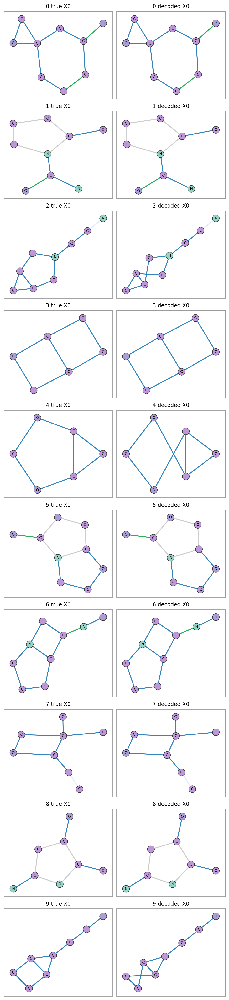

RDKit view: first 10 true-X0/decode-back pairs


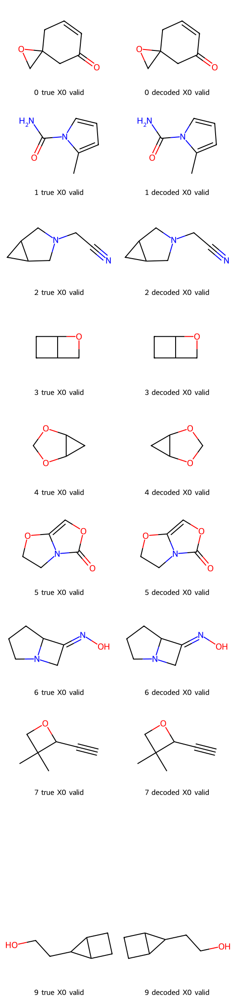

RDKit-valid in plotted subset: 18 / 20
Most common RDKit conversion/sanitization errors:
  2x Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5


In [ ]:
# ===== QM9 true-X0 decode-back diagnostic =====
# Checks the frozen decoder separately from condition generation:
# real molecule -> node encoding X0 -> generated molecule.
if globals().get("DATASET_MODE") == "qm9":
    import random
    from collections import Counter

    import networkx as nx
    import numpy as np
    import pandas as pd
    from IPython.display import display
    from networkx.algorithms import isomorphism as iso
    from rdkit import Chem
    from rdkit.Chem import AllChem, Draw

    QM9_X0_CHECK_N = 30
    QM9_X0_DISPLAY_N = 10
    QM9_X0_CHECK_SEED = 321

    def _nx_molecule_to_rdkit_safe_x0(G):
        return qm9_graph_to_rdkit_safe(G)

    def _atom_hist(G):
        return Counter(str(data.get("label")) for _, data in G.nodes(data=True))

    def _bond_hist(G):
        return Counter(str(data.get("label", "1")) for _, _, data in G.edges(data=True))

    def _standardize_edge_labels(G):
        H = G.copy()
        for _, data in H.nodes(data=True):
            data["label"] = str(data.get("label"))
        for _, _, data in H.edges(data=True):
            data["label"] = str(data.get("label", "1"))
        return H

    rng = random.Random(QM9_X0_CHECK_SEED)
    probe_graphs = rng.sample(list(test_graphs), k=min(QM9_X0_CHECK_N, len(test_graphs)))

    node_encs, conds = decompositional_encoder_decoder.encode(probe_graphs)
    decoded_x0_graphs = (
        decompositional_encoder_decoder
        .node_embeddings_to_graph_generator
        .decode(node_encs, conditional_graph_encodings=conds)
    )

    node_match = iso.categorical_node_match("label", None)
    edge_match = iso.categorical_edge_match("label", None)

    rows = []
    grid_mols = []
    legends = []
    nx_pair_graphs = []

    for idx, (true_g, decoded_g) in enumerate(zip(probe_graphs, decoded_x0_graphs)):
        true_std = _standardize_edge_labels(true_g)
        decoded_std = _standardize_edge_labels(decoded_g)

        true_mol, true_error = _nx_molecule_to_rdkit_safe_x0(true_std)
        decoded_mol, decoded_error = _nx_molecule_to_rdkit_safe_x0(decoded_std)
        true_smiles = Chem.MolToSmiles(true_mol) if true_error is None and true_mol is not None else None
        decoded_smiles = Chem.MolToSmiles(decoded_mol) if decoded_error is None and decoded_mol is not None else None

        try:
            unlabeled_iso = nx.is_isomorphic(true_std, decoded_std)
            atom_iso = nx.is_isomorphic(true_std, decoded_std, node_match=node_match)
            atom_bond_iso = nx.is_isomorphic(
                true_std,
                decoded_std,
                node_match=node_match,
                edge_match=edge_match,
            )
        except Exception:
            unlabeled_iso = atom_iso = atom_bond_iso = False

        rows.append({
            "pair": idx,
            "decoded_valid_rdkit": decoded_error is None,
            "same_node_count": true_std.number_of_nodes() == decoded_std.number_of_nodes(),
            "same_edge_count": true_std.number_of_edges() == decoded_std.number_of_edges(),
            "same_atom_hist": _atom_hist(true_std) == _atom_hist(decoded_std),
            "same_bond_hist": _bond_hist(true_std) == _bond_hist(decoded_std),
            "unlabeled_iso": bool(unlabeled_iso),
            "atom_labeled_iso": bool(atom_iso),
            "atom_and_bond_labeled_iso": bool(atom_bond_iso),
            "true_smiles": true_smiles,
            "decoded_smiles": decoded_smiles,
            "decoded_error": decoded_error,
        })

        if idx < QM9_X0_DISPLAY_N:
            true_plot = true_std.copy()
            decoded_plot = decoded_std.copy()
            true_plot.graph["plot_title"] = f"{idx} true X0"
            decoded_plot.graph["plot_title"] = f"{idx} decoded X0"
            nx_pair_graphs.extend([true_plot, decoded_plot])

            if true_mol is not None and true_error is None:
                AllChem.Compute2DCoords(true_mol)
                grid_mols.append(true_mol)
                legends.append(f"{idx} true X0")
            else:
                grid_mols.append(Chem.MolFromSmiles(""))
                legends.append(f"{idx} true invalid")

            if decoded_mol is not None and decoded_error is None:
                AllChem.Compute2DCoords(decoded_mol)
                grid_mols.append(decoded_mol)
                legends.append(f"{idx} decoded X0")
            else:
                grid_mols.append(Chem.MolFromSmiles(""))
                legends.append(f"{idx} decoded invalid")

    qm9_x0_decode_back_results = pd.DataFrame(rows)
    summary = pd.DataFrame([{
        "n": len(qm9_x0_decode_back_results),
        "decoded_valid_rdkit": int(qm9_x0_decode_back_results["decoded_valid_rdkit"].sum()),
        "valid_rate": float(qm9_x0_decode_back_results["decoded_valid_rdkit"].mean()) if len(qm9_x0_decode_back_results) else 0.0,
        "same_node_count": int(qm9_x0_decode_back_results["same_node_count"].sum()),
        "same_edge_count": int(qm9_x0_decode_back_results["same_edge_count"].sum()),
        "same_atom_hist": int(qm9_x0_decode_back_results["same_atom_hist"].sum()),
        "same_bond_hist": int(qm9_x0_decode_back_results["same_bond_hist"].sum()),
        "unlabeled_iso": int(qm9_x0_decode_back_results["unlabeled_iso"].sum()),
        "atom_labeled_iso": int(qm9_x0_decode_back_results["atom_labeled_iso"].sum()),
        "atom_and_bond_labeled_iso": int(qm9_x0_decode_back_results["atom_and_bond_labeled_iso"].sum()),
    }])

    print("QM9 true-X0 decode-back summary")
    display(summary)
    display(qm9_x0_decode_back_results)

    if nx_pair_graphs:
        plot_qm9_nx_then_rdkit(
            nx_pair_graphs,
            n_cols=2,
            title=f"first {min(QM9_X0_DISPLAY_N, len(probe_graphs))} true-X0/decode-back pairs",
            graph_title_attr="plot_title",
            figsize_per_graph=(3.0, 2.6),
            node_size=170,
            edge_width=1.8,
            font_size=7,
            rdkit_sub_img_size=(260, 220),
        )
else:
    print("Skipping QM9 true-X0 decode-back diagnostic because DATASET_MODE != 'qm9'.")


In [ ]:
# import dill as pickle
# from pathlib import Path

# SAVE_FULL_GENERATOR = True
# FULL_GENERATOR_PATH = Path(f"{dataset_name}_decompositional_encoder_decoder.pkl")

# if SAVE_FULL_GENERATOR:
#     with FULL_GENERATOR_PATH.open("wb") as f:
#         pickle.dump(decompositional_encoder_decoder, f)

#     print(f"saved full generator to: {FULL_GENERATOR_PATH.resolve()}")
# else:
#     import dill as pickle

# with open(f"{dataset_name}_decompositional_encoder_decoder.pkl", "rb") as f:
#     loaded_decoder = pickle.load(f)

# sampled_graphs = loaded_decoder.sample(n_samples=10)
# print("SAVE_FULL_GENERATOR is False; skipped.")
# plot_networkx_graphs(
#     sampled_graphs,
#     n_cols=10,
#     node_label_attr="label",
#     edge_label_attr="label",
#     node_size=210,
#     edge_width=2.2,
#     layout="kamada_kawai",
# )

In [ ]:
def plot_graphs_auto(
    graphs,
    targets=None,
    *,
    size=2,
    label_to_idx=None,
    unlabeled="__UNLABELED__",
    title=None,
    binary_positive_class=1,
    node_label_source="generated",
    n_graphs_per_line=None,
    node_label_attr="label",
    edge_label_attr="label",
):
    """
    Compatible with the new plot_networkx_graphs().

    Uses stable hash colors from node/edge labels.
    No POS_PALETTE / NEG_PALETTE / display_graphs dependency.
    """
    graphs = list(graphs)

    if len(graphs) == 0:
        print("no graphs to display")
        return graphs, label_to_idx

    if title is not None:
        print(title)

    info = infer_display_case(graphs, targets, unlabeled=unlabeled)
    normalized_targets = info["targets"]
    unique_targets = info["classes"]

    n_cols = n_graphs_per_line if n_graphs_per_line is not None else len(graphs)
    node_size = int(105 * size)
    edge_width = max(1.4, 1.1 * size)

    if info["graph_case"] == "binary" and normalized_targets is not None:
        pos_class = binary_positive_class if binary_positive_class in unique_targets else unique_targets[0]
        neg_class = [cls for cls in unique_targets if cls != pos_class][0]

        pos_graphs = [g for g, t in zip(graphs, normalized_targets) if t == pos_class]
        neg_graphs = [g for g, t in zip(graphs, normalized_targets) if t == neg_class]

        print(f"graph classes: pos={pos_class}, neg={neg_class} | node labels: {node_label_source}")

        if pos_graphs:
            print("positive graphs")
            plot_networkx_graphs(
                pos_graphs,
                n_cols=n_cols,
                node_label_attr=node_label_attr,
                edge_label_attr=edge_label_attr,
                node_size=node_size,
                edge_width=edge_width,
                layout="kamada_kawai",
            )

        if neg_graphs:
            print("negative graphs")
            plot_networkx_graphs(
                neg_graphs,
                n_cols=n_cols,
                node_label_attr=node_label_attr,
                edge_label_attr=edge_label_attr,
                node_size=node_size,
                edge_width=edge_width,
                layout="kamada_kawai",
            )

        return graphs, label_to_idx

    ordered_graphs = graphs

    if normalized_targets is not None and len(unique_targets) > 0:
        ordered_graphs = []
        for cls in unique_targets:
            ordered_graphs.extend([g for g, t in zip(graphs, normalized_targets) if t == cls])
        ordered_graphs.extend([g for g, t in zip(graphs, normalized_targets) if t is None])

        class_summary = ", ".join(str(cls) for cls in unique_targets)
        if any(t is None for t in normalized_targets):
            class_summary += ", unlabeled"
        print(f"graph classes: {class_summary} | node labels: {node_label_source}")
    else:
        print(f"graph classes: unlabeled | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=n_cols,
        node_label_attr=node_label_attr,
        edge_label_attr=edge_label_attr,
        node_size=node_size,
        edge_width=edge_width,
        layout="kamada_kawai",
    )

    return graphs, label_to_idx


In [ ]:
def _coerce_value(value, missing=None):
    if value is None:
        return missing
    if isinstance(value, str) and value.strip() == "":
        return missing
    try:
        f = float(value)
        if np.isnan(f):
            return missing
        if np.isfinite(f) and abs(f - round(f)) < 1e-9:
            return int(round(f))
    except Exception:
        pass
    return str(value)


def normalize_display_labels(
    graphs,
    label_to_idx=None,
    unlabeled="__UNLABELED__",
    source_attrs=("label", "plot_label", "display_label"),
    output_attr="display_label",
):
    """
    Converts node labels into stable integer display labels.

    Reads first available attr from:
      label -> plot_label -> display_label

    Writes:
      node[output_attr]

    Returns:
      graphs, label_to_idx
    """
    graphs = list(graphs)

    if label_to_idx is None:
        raw_labels = []

        for g in graphs:
            for _, data in g.nodes(data=True):
                raw = unlabeled
                for attr in source_attrs:
                    if attr in data:
                        raw = data[attr]
                        break
                raw_labels.append(_coerce_value(raw, missing=unlabeled))

        uniq = list(dict.fromkeys(raw_labels)) or [unlabeled]

        if unlabeled not in uniq:
            uniq.append(unlabeled)

        label_to_idx = {lab: i for i, lab in enumerate(uniq)}

    default_id = label_to_idx.get(unlabeled, 0)

    for g in graphs:
        for _, data in g.nodes(data=True):
            raw = unlabeled
            for attr in source_attrs:
                if attr in data:
                    raw = data[attr]
                    break

            label = _coerce_value(raw, missing=unlabeled)
            data[output_attr] = int(label_to_idx.get(label, default_id))

    return graphs, label_to_idx
def _normalize_targets(targets):
    if targets is None:
        return None
    return [_coerce_value(t, missing=None) for t in targets]


def _unique_present(values):
    out = []
    for value in values:
        if value is None:
            continue
        if value not in out:
            out.append(value)
    return out


def infer_display_case(graphs=None, targets=None, unlabeled="__UNLABELED__"):
    normalized_targets = _normalize_targets(targets)
    unique_targets = _unique_present(normalized_targets or [])

    have_node_labels = False
    if graphs is not None:
        for g in graphs:
            for _, data in g.nodes(data=True):
                raw = data.get("display_label", data.get("plot_label", data.get("label", unlabeled)))
                if _coerce_value(raw, missing=unlabeled) != unlabeled:
                    have_node_labels = True
                    break
            if have_node_labels:
                break

    if normalized_targets is None or len(unique_targets) == 0:
        graph_case = "unlabeled"
    elif len(unique_targets) == 2 and all(t is not None for t in normalized_targets):
        graph_case = "binary"
    else:
        graph_case = "multiclass"

    return {
        "graph_case": graph_case,
        "node_case": "labeled" if have_node_labels else "unlabeled",
        "targets": normalized_targets,
        "classes": unique_targets,
    }


def sample_graphs_for_display(
    graphs,
    targets=None,
    *,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=10,
):
    graphs = list(graphs)

    if targets is None or len(targets) != len(graphs):
        sampled_graphs = random.sample(graphs, min(unlabeled_n, len(graphs)))
        info = infer_display_case(sampled_graphs, None)
        return sampled_graphs, None, info

    normalized_targets = _normalize_targets(targets)
    unique_targets = _unique_present(normalized_targets)

    if len(unique_targets) == 0:
        sampled_graphs = random.sample(graphs, min(unlabeled_n, len(graphs)))
        info = infer_display_case(sampled_graphs, None)
        return sampled_graphs, None, info

    per_class = binary_n_per_class if len(unique_targets) == 2 else multiclass_n_per_class
    sampled_pairs = []

    for cls in unique_targets:
        pool = [(g, t) for g, t in zip(graphs, normalized_targets) if t == cls]
        sampled_pairs.extend(random.sample(pool, min(per_class, len(pool))))

    random.shuffle(sampled_pairs)
    sampled_graphs = [g for g, _ in sampled_pairs]
    sampled_targets = [t for _, t in sampled_pairs]
    info = infer_display_case(sampled_graphs, sampled_targets)
    return sampled_graphs, sampled_targets, info


available train classes: {None: 49400}
decode class counts: {None: 10}
Node encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.10 seconds (0.00 minutes, 0.00 hours).
Encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.09 seconds (0.00 minutes, 0.00 hours).
Decoding 10 conditioning vectors
Predicting node matrices for 10 graphs...
Predicting node matrices for 10 graphs...
Condition-predicted node counts: {8: 5, 9: 5}
Condition-predicted degree histograms: {(0, 0, 5, 4, 0): 1, (0, 1, 6, 1, 0): 1, (0, 2, 3, 2, 1): 1, (0, 2, 4, 2, 0): 1, (0, 2, 5, 2, 0): 2, (0, 3, 3, 1, 1): 1, (0, 3, 3, 3, 0): 2, (0, 3, 4, 1, 0): 1}
Condition-predicted label histograms: {(4, 2, 2, 0): 1, (5, 3, 1, 0): 2, (7, 0, 1, 0): 2, (7, 1, 1, 0): 2, (7, 2, 0, 0): 1, (8, 0, 0, 0): 2}
Applied head-based projection for existence, degree channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 1.02 seconds (0.02 

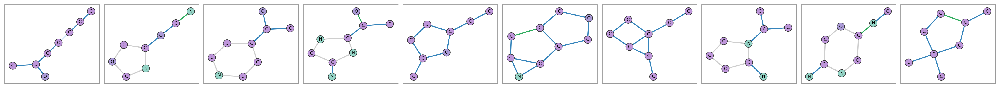

decoded/generated from selected class conditioning


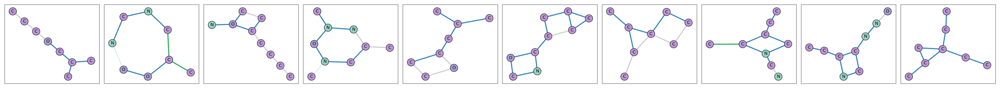

In [ ]:
# ===== Decode generated graphs from only one graph class =====
# Example: decode 10 graphs from one class and 0 from the other.
# This uses class-specific training graphs as conditioning seeds.
import random
from collections import Counter

DECODE_CLASS_COUNTS = None
DECODE_ONLY_CLASS = 1       # if present; otherwise the first available class is used
DECODE_ONLY_N = 10
DECODE_CLASS_SEED = int(globals().get("SEED", 42))
DECODE_CLASS_TOTAL_STEPS = 100
DECODE_CLASS_N_COLS = 10

class_decoded_graphs = []
seed_graphs = []
seed_targets = []

if "train_targets" not in globals() or train_targets is None:
    print("class-specific decoding skipped: train_targets is unlabeled/missing")
else:
    _targets = list(train_targets)
    _classes = sorted(set(_targets), key=lambda x: repr(x))
    if not _classes:
        print("class-specific decoding skipped: no graph classes found in train_targets")
    else:
        if DECODE_CLASS_COUNTS is None:
            chosen_class = DECODE_ONLY_CLASS if DECODE_ONLY_CLASS in set(_classes) else _classes[0]
            DECODE_CLASS_COUNTS = {cls: (int(DECODE_ONLY_N) if cls == chosen_class else 0) for cls in _classes}

        print("available train classes:", dict(Counter(_targets)))
        print("decode class counts:", DECODE_CLASS_COUNTS)

        _rng = random.Random(DECODE_CLASS_SEED)

        for cls in _classes:
            n_cls = int(DECODE_CLASS_COUNTS.get(cls, 0))
            if n_cls <= 0:
                continue
            cls_graphs = [g for g, y in zip(train_graphs, _targets) if y == cls]
            if not cls_graphs:
                print(f"[warn] no training graphs for class={cls!r}")
                continue
            seeds = _rng.choices(cls_graphs, k=n_cls)
            seed_graphs.extend(seeds)
            seed_targets.extend([cls] * len(seeds))

        if not seed_graphs:
            print("class-specific decoding skipped: no seed graphs selected")
        else:
            _gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
            _old_steps = getattr(_gen, "total_steps", None)
            _gen.total_steps = int(DECODE_CLASS_TOTAL_STEPS)

            _, class_conditioning_encs = decompositional_encoder_decoder.encode(seed_graphs)
            class_decoded_graphs = decompositional_encoder_decoder.decode(class_conditioning_encs)

            if _old_steps is not None:
                _gen.total_steps = _old_steps

            # Normalize display labels if those helpers were already defined.
            if "normalize_display_labels" in globals():
                all_graphs = list(seed_graphs) + list(class_decoded_graphs)
                _, _label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)
                seed_graphs, _ = normalize_display_labels(seed_graphs, label_to_idx=_label_to_idx)
                class_decoded_graphs, _ = normalize_display_labels(class_decoded_graphs, label_to_idx=_label_to_idx)
                _node_label_attr = "label"
                _edge_label_attr = "label"
            else:
                _node_label_attr = "label"
                _edge_label_attr = "label"

            print("decoded class counts:", dict(Counter(seed_targets)))

            if "plot_networkx_graphs" in globals():
                _n_cols = min(int(DECODE_CLASS_N_COLS), len(class_decoded_graphs))

                print("true conditioning seed graphs")
                plot_networkx_graphs(
                    seed_graphs,
                    n_cols=_n_cols,
                    figsize_per_graph=(2.2, 2.0),
                    node_label_attr=_node_label_attr,
                    edge_label_attr=_edge_label_attr,
                    node_size=140,
                    edge_width=1.7,
                    font_size=7,
                    layout="kamada_kawai",
                )

                print("decoded/generated from selected class conditioning")
                plot_networkx_graphs(
                    class_decoded_graphs,
                    n_cols=_n_cols,
                    figsize_per_graph=(2.2, 2.0),
                    node_label_attr=_node_label_attr,
                    edge_label_attr=_edge_label_attr,
                    node_size=140,
                    edge_width=1.7,
                    font_size=7,
                    layout="kamada_kawai",
                )
            else:
                print("true conditioning seed graphs:", seed_graphs)
                print("decoded/generated graphs:", class_decoded_graphs)


true graphs
display case: unlabeled | node labels: labeled
Node encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.10 seconds (0.00 minutes, 0.00 hours).
Encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.10 seconds (0.00 minutes, 0.00 hours).
Predicting edge probabilities for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.17 seconds (0.00 minutes, 0.00 hours).
Predicting edge labels for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.07 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.38 seconds (0.01 minutes, 0.00 hours).
Decoding 10 conditioning vectors
Predicting node matrices for 10 graphs...
Predicting node matrices for 10 graphs...
Condition-predicted node counts: {7: 1, 8: 3, 9: 6}
Condition-predicted degree h

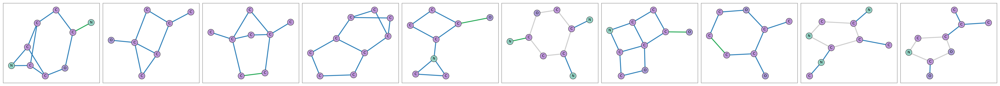

decoded from node encs | graph classes: unlabeled | node labels: decoded


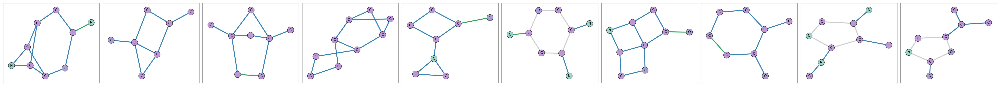

generated from graph encs, steps=75 | graph classes: unlabeled | node labels: generated, steps=75


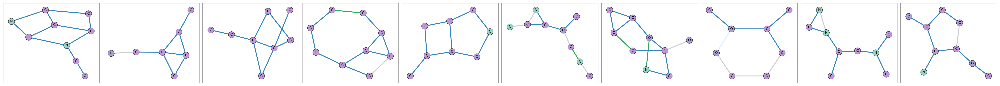

generated from graph encs, steps=100 | graph classes: unlabeled | node labels: generated, steps=100


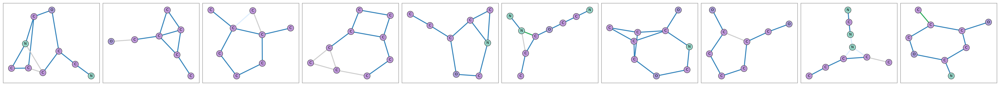

generated from graph encs, steps=300 | graph classes: unlabeled | node labels: generated, steps=300


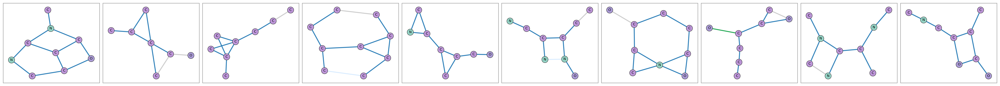

generated from graph encs, steps=500 | graph classes: unlabeled | node labels: generated, steps=500


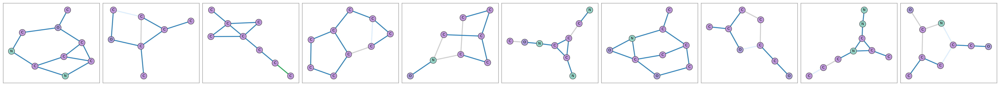

In [ ]:
# =============== MAIN ===============
print("true graphs")
import random
import numpy as np

steps_to_show = [75,100,300,500]   # keep one generated row; add more if you want
n_graphs_per_line = 10

probe_train_graphs, probe_train_targets, probe_info = sample_graphs_for_display(
    train_graphs,
    train_targets if "train_targets" in globals() else None,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=10,
)

print(f"display case: {probe_info['graph_case']} | node labels: {probe_info['node_case']}")

node_encs_list, conditioning_encs = decompositional_encoder_decoder.encode(probe_train_graphs)

decoded_graphs = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
    node_encs_list
)

conditioning_decoded_by_steps = {}
_original_total_steps = conditional_node_generator_model.total_steps

for steps in steps_to_show:
    conditional_node_generator_model.total_steps = steps
    conditioning_decoded_by_steps[steps] = decompositional_encoder_decoder.decode(conditioning_encs)

conditional_node_generator_model.total_steps = _original_total_steps

# Shared label map across all rows.
all_graphs = []
all_graphs.extend(probe_train_graphs)
all_graphs.extend(decoded_graphs)
for steps in steps_to_show:
    all_graphs.extend(conditioning_decoded_by_steps[steps])

_, label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)

probe_train_graphs, _ = normalize_display_labels(probe_train_graphs, label_to_idx=label_to_idx)
decoded_graphs, _ = normalize_display_labels(decoded_graphs, label_to_idx=label_to_idx)

for steps in steps_to_show:
    conditioning_decoded_by_steps[steps], _ = normalize_display_labels(
        conditioning_decoded_by_steps[steps],
        label_to_idx=label_to_idx,
    )


def _order_graphs_one_line(graphs, targets):
    """
    Binary: keeps classes grouped on one line, e.g. 5 pos then 5 neg.
    Multiclass: groups each class in order.
    Unlabeled: original order.
    """
    info = infer_display_case(graphs, targets)
    normalized_targets = info["targets"]
    classes = info["classes"]

    if normalized_targets is None or len(classes) == 0:
        return list(graphs), info

    ordered = []
    for cls in classes:
        ordered.extend([
            g for g, t in zip(graphs, normalized_targets)
            if t == cls
        ])

    return ordered, info


def _plot_stage_one_line(graphs, targets, title, node_label_source):
    ordered_graphs, info = _order_graphs_one_line(graphs, targets)
    classes = info["classes"]

    if len(classes) == 0:
        print(f"{title} | graph classes: unlabeled | node labels: {node_label_source}")
    else:
        counts = {
            cls: sum(t == cls for t in info["targets"])
            for cls in classes
        }
        print(f"{title} | graph classes: {counts} | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=len(ordered_graphs),
        node_label_attr="label",
        edge_label_attr="label",
        node_size=210,
        edge_width=2.2,
        layout="kamada_kawai",
    )


_plot_stage_one_line(
    probe_train_graphs,
    probe_train_targets,
    "true graphs",
    "true",
)

_plot_stage_one_line(
    decoded_graphs,
    probe_train_targets,
    "decoded from node encs",
    "decoded",
)

for steps in steps_to_show:
    _plot_stage_one_line(
        conditioning_decoded_by_steps[steps],
        probe_train_targets,
        f"generated from graph encs, steps={steps}",
        f"generated, steps={steps}",
    )


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Optional

def compare_degree_histograms(
        true_encodings_list,
        pred_encodings_list,
        title: str = "Degree distribution (true vs. predicted)",
        ax: Optional[plt.Axes] = None,
        true_label: str = "True",
        pred_label: str = "Predicted",
        true_color: str = "tab:blue",
        pred_color: str = "tab:orange",
        alpha: float = 0.6,
        exist_threshold: float = 0.5,
    ):
    """
    Plot overlaid histograms of node degrees (column 1) for true and predicted encodings,
    *excluding* rows where existence flag (column 0) < `exist_threshold`.

    Parameters
    ----------
    true_encodings_list, pred_encodings_list : list[np.ndarray]
        Lists of (N_i, D) arrays in raw (un-scaled) space.
    exist_threshold : float
        Rows with existence flag below this value are ignored.
    """

    def extract_valid_degrees(enc_list):
        degs = []
        for m in enc_list:
            mask = m[:, 0] >= exist_threshold    # keep only existent nodes
            if mask.any():
                degs.append(m[mask, 1])
        if not degs:
            return np.array([], dtype=int)
        return np.concatenate(degs)

    # 1. gather degrees
    true_deg = extract_valid_degrees(true_encodings_list).round().astype(int)
    pred_deg = extract_valid_degrees(pred_encodings_list).round().astype(int)

    if true_deg.size == 0 and pred_deg.size == 0:
        raise ValueError("No nodes passed the existence threshold in either list.")

    # 2. integer-aligned bin edges
    max_k = int(max(true_deg.max(initial=0), pred_deg.max(initial=0)))
    bins  = np.arange(-0.5, max_k + 1.5, 1)     # one bin per integer

    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 4))

    # 3. plot histograms
    if true_deg.size:
        ax.hist(true_deg, bins=bins, alpha=alpha,
                color=true_color, label=true_label, edgecolor="k")
    if pred_deg.size:
        ax.hist(pred_deg, bins=bins, alpha=alpha,
                color=pred_color, label=pred_label, edgecolor="k")

    # 4. cosmetics
    ax.set_xticks(np.arange(0, max_k + 1))
    ax.set_xlabel("Degree")
    ax.set_ylabel("Count")
    ax.set_title(title)
    ax.legend()
    ax.grid(axis="y", linestyle="--", alpha=0.3)

    return ax


Node encoding 40 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.38 seconds (0.01 minutes, 0.00 hours).
Encoding 40 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.36 seconds (0.01 minutes, 0.00 hours).
Predicting node matrices for 40 graphs...
Predicting node matrices for 40 graphs...
Condition-predicted node counts: {6: 1, 7: 4, 8: 16, 9: 19}
Condition-predicted degree histograms: {(0, 0, 4, 4, 1): 1, (0, 0, 6, 2, 1): 1, (0, 0, 7, 2, 0): 2, (0, 1, 2, 3, 0): 1, (0, 1, 2, 5, 1): 1, (0, 1, 3, 5, 0): 1, (0, 1, 4, 1, 2): 1, (0, 1, 4, 3, 0): 1, (0, 1, 4, 3, 1): 2, (0, 1, 5, 1, 0): 1, (0, 1, 5, 1, 1): 2, (0, 1, 6, 1, 1): 2, (0, 1, 7, 1, 0): 1, (0, 2, 3, 2, 0): 1, (0, 2, 3, 4, 0): 1, (0, 2, 4, 0, 1): 2, (0, 2, 4, 2, 0): 5, (0, 2, 5, 2, 0): 4, (0, 2, 6, 0, 0): 1, (0, 3, 2, 3, 0): 2, (0, 3, 3, 1, 1): 2, (0, 3, 3, 3, 0): 2, (0, 4, 0, 4, 0): 1, (0, 4, 2, 2, 0): 1, (0, 4, 3, 2, 0): 1}
Condition-predicted label histograms: {(3,

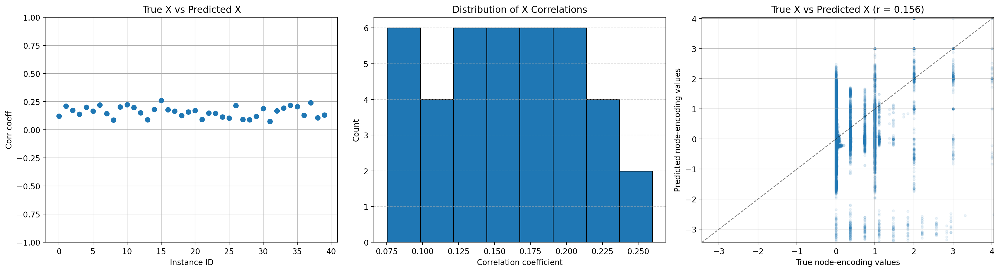

=== node-encoding reconstruction stats ===
n graphs used: 40
median r: 0.162 | mean r: 0.158 | overall r: 0.156

=== node-count stats ===
true node count: mean=8.32, min=6, max=9
pred node count: mean=8.32, min=6, max=9
node count abs error: mean=0.00

=== degree stats ===
true degree hist: {2: 162, 4: 15, 3: 85, 1: 71}
pred degree hist: {2: 162, 3: 85, 4: 15, 1: 71}


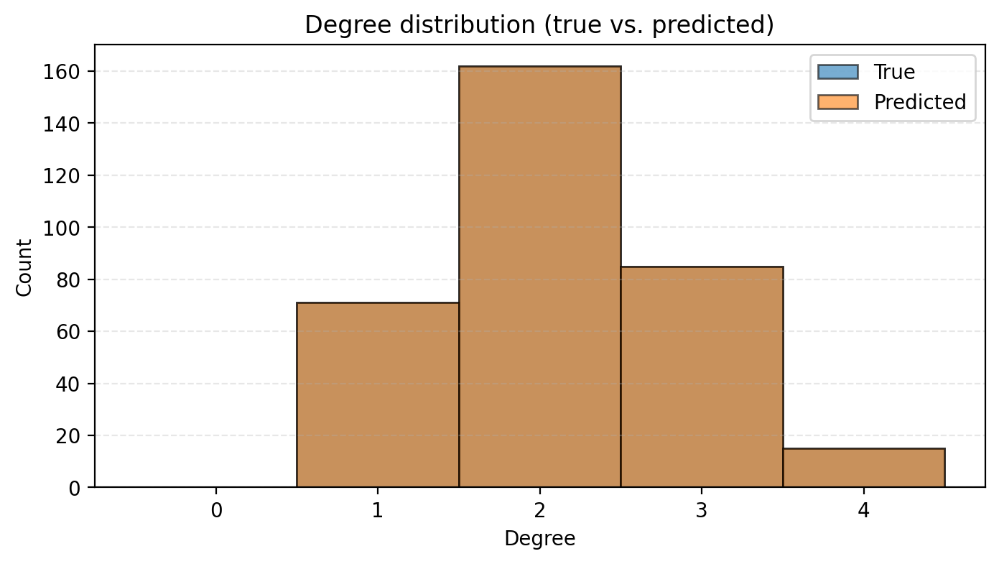

Predicting edge probabilities for 40 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.02 seconds (0.00 minutes, 0.00 hours).
Predicting edge labels for 40 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.22 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.85 seconds (0.01 minutes, 0.00 hours).

=== graph motif stats: true probe graphs ===
nodes    : {9: 19, 8: 16, 7: 4, 6: 1}
edges    : {11: 4, 8: 11, 7: 7, 9: 10, 10: 6, 12: 2}
degrees  : {2: 162, 4: 15, 3: 85, 1: 71}
triangles: {1: 18, 0: 20, 2: 2}
cycles   : {3: 5, 1: 21, 2: 9, 4: 2, 0: 3}

=== graph motif stats: decoded predicted X graphs ===
nodes    : {9: 19, 8: 16, 7: 4, 6: 1}
edges    : {11: 4, 8: 11, 7: 7, 9: 10, 10: 6, 12: 2}
degrees  : {2: 162, 3: 85, 4: 15, 1: 71}
triangles: {2: 4, 1: 14, 0: 22}
cycles   : {3: 5, 1: 21, 2: 9, 4: 2, 0: 3}

=== paired exa

1.0

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

random.seed(0)

n = min(40, len(train_graphs))
probe_train_graphs = random.sample(train_graphs, n)

node_encs, conditioning_encodings = decompositional_encoder_decoder.encode(probe_train_graphs)

predicted_node_encodings_list = (
    decompositional_encoder_decoder
    .conditioning_to_node_embeddings_generator
    .predict(conditioning_encodings)
)


def safe_corr(x, y):
    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()

    m = min(x.size, y.size)
    x = x[:m]
    y = y[:m]

    if m == 0:
        return np.nan
    if np.std(x) == 0 or np.std(y) == 0:
        return np.nan

    return float(np.corrcoef(x, y)[0, 1])


def align_node_matrices(true_enc, pred_enc):
    A = np.asarray(true_enc, dtype=float)
    B = np.asarray(pred_enc, dtype=float)

    n_rows = min(A.shape[0], B.shape[0])
    n_cols = min(A.shape[1], B.shape[1])

    return A[:n_rows, :n_cols], B[:n_rows, :n_cols]


def degree_vector(enc, existence_threshold=0.5):
    enc = np.asarray(enc, dtype=float)
    if enc.ndim != 2 or enc.shape[1] < 2:
        return np.array([], dtype=int)

    mask = enc[:, 0] > existence_threshold
    return np.rint(enc[mask, 1]).astype(int)


def presence_count(enc, existence_threshold=0.5):
    enc = np.asarray(enc, dtype=float)
    if enc.ndim != 2 or enc.shape[1] < 1:
        return 0

    return int((enc[:, 0] > existence_threshold).sum())


# ---------------- Correlations: true X vs predicted X ----------------
ccs = []
true_flat_all = []
pred_flat_all = []

for true_nodes, pred_nodes in zip(node_encs, predicted_node_encodings_list):
    A, B = align_node_matrices(true_nodes, pred_nodes)

    ccs.append(safe_corr(A, B))
    true_flat_all.append(A.ravel())
    pred_flat_all.append(B.ravel())

data_real = np.concatenate(true_flat_all) if true_flat_all else np.array([])
data_pred = np.concatenate(pred_flat_all) if pred_flat_all else np.array([])
overall_corr = safe_corr(data_real, data_pred)

finite_ccs = [c for c in ccs if np.isfinite(c)]

print("=== shape debug ===")
print("conditioning C dim:", np.asarray(conditioning_encodings[0]).shape)
print("true node X shape:", np.asarray(node_encs[0]).shape)
print("pred node X shape:", np.asarray(predicted_node_encodings_list[0]).shape)
print("finite node-X correlations:", len(finite_ccs), "/", len(ccs))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

ax1.plot(ccs, "o")
ax1.set_ylim(-1, 1)
ax1.set_xlabel("Instance ID")
ax1.set_ylabel("Corr coeff")
ax1.set_title("True X vs Predicted X")
ax1.grid(True)

if finite_ccs:
    ax2.hist(finite_ccs, bins=8, edgecolor="black")
else:
    ax2.text(0.5, 0.5, "No finite values", ha="center", va="center")

ax2.set_xlabel("Correlation coefficient")
ax2.set_ylabel("Count")
ax2.set_title("Distribution of X Correlations")
ax2.grid(axis="y", linestyle="--", alpha=0.5)

if data_pred.size and data_real.size:
    min_val = float(min(data_real.min(), data_pred.min()))
    max_val = float(max(data_real.max(), data_pred.max()))
    if min_val == max_val:
        min_val -= 1
        max_val += 1

    lims = [min_val, max_val]
    ax3.scatter(data_real, data_pred, alpha=0.08, s=8)
    ax3.plot(lims, lims, "k--", linewidth=1, alpha=0.5)
    ax3.set_xlim(lims)
    ax3.set_ylim(lims)
else:
    ax3.text(0.5, 0.5, "No values", ha="center", va="center")

ax3.set_xlabel("True node-encoding values")
ax3.set_ylabel("Predicted node-encoding values")
ax3.set_title(f"True X vs Predicted X (r = {overall_corr:.3f})")
ax3.grid(True)

plt.tight_layout()
plt.show()


# ---------------- Summary stats ----------------
median_r = np.nanmedian(ccs) if finite_ccs else np.nan
mean_r = np.nanmean(ccs) if finite_ccs else np.nan

true_node_counts = [presence_count(enc) for enc in node_encs]
pred_node_counts = [presence_count(enc) for enc in predicted_node_encodings_list]

true_degrees = [degree_vector(enc) for enc in node_encs]
pred_degrees = [degree_vector(enc) for enc in predicted_node_encodings_list]

true_degree_flat = np.concatenate(true_degrees) if true_degrees else np.array([], dtype=int)
pred_degree_flat = np.concatenate(pred_degrees) if pred_degrees else np.array([], dtype=int)

print("=== node-encoding reconstruction stats ===")
print(f"n graphs used: {n}")
print(f"median r: {median_r:.3f} | mean r: {mean_r:.3f} | overall r: {overall_corr:.3f}")

print()
print("=== node-count stats ===")
print(f"true node count: mean={np.mean(true_node_counts):.2f}, min={np.min(true_node_counts)}, max={np.max(true_node_counts)}")
print(f"pred node count: mean={np.mean(pred_node_counts):.2f}, min={np.min(pred_node_counts)}, max={np.max(pred_node_counts)}")
print(f"node count abs error: mean={np.mean(np.abs(np.array(true_node_counts) - np.array(pred_node_counts))):.2f}")

print()
print("=== degree stats ===")
print("true degree hist:", dict(Counter(true_degree_flat.tolist())))
print("pred degree hist:", dict(Counter(pred_degree_flat.tolist())))

if "compare_degree_histograms" in globals():
    compare_degree_histograms(node_encs, predicted_node_encodings_list)
    plt.show()
# ---------------- Graph/motif stats ----------------
import networkx as nx
from collections import Counter

def graph_motif_stats(graphs, name):
    node_counts = Counter(g.number_of_nodes() for g in graphs)
    edge_counts = Counter(g.number_of_edges() for g in graphs)
    degree_counts = Counter(d for g in graphs for _, d in g.degree())
    triangle_counts = Counter(sum(nx.triangles(g).values()) // 3 for g in graphs)
    cycle_counts = Counter(len(nx.cycle_basis(g)) for g in graphs)

    print()
    print(f"=== graph motif stats: {name} ===")
    print("nodes    :", dict(node_counts))
    print("edges    :", dict(edge_counts))
    print("degrees  :", dict(degree_counts))
    print("triangles:", dict(triangle_counts))
    print("cycles   :", dict(cycle_counts))

    return {
        "nodes": node_counts,
        "edges": edge_counts,
        "degrees": degree_counts,
        "triangles": triangle_counts,
        "cycles": cycle_counts,
    }


def exact_match_rate(true_graphs, pred_graphs, stat_fn, name):
    vals_true = [stat_fn(g) for g in true_graphs]
    vals_pred = [stat_fn(g) for g in pred_graphs]
    n_pair = min(len(vals_true), len(vals_pred))

    if n_pair == 0:
        print(f"{name}: no paired graphs")
        return np.nan

    rate = np.mean([
        vals_true[i] == vals_pred[i]
        for i in range(n_pair)
    ])

    print(f"{name}: {rate:.3f} ({int(rate * n_pair)}/{n_pair})")
    return rate


# Decode predicted node encodings into graphs.
decoded_pred_graphs = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
    predicted_node_encodings_list,
    conditional_graph_encodings=conditioning_encodings,
)

true_graph_stats = graph_motif_stats(probe_train_graphs, "true probe graphs")
pred_graph_stats = graph_motif_stats(decoded_pred_graphs, "decoded predicted X graphs")

print()
print("=== paired exact graph-stat match rates ===")
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: g.number_of_nodes(),
    "node count",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: g.number_of_edges(),
    "edge count",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: tuple(sorted(dict(g.degree()).values())),
    "sorted degree sequence",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: sum(nx.triangles(g).values()) // 3,
    "triangle count",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: len(nx.cycle_basis(g)),
    "cycle count",
)


In [ ]:
import pickle
from pathlib import Path

SAVE_GENERATED_GRAPHS = False

# Options:
#   "manual"      -> use MANUAL_N_GENERATED
#   "train1"      -> len(train1_graphs)
#   "train_whole" -> len(train_whole_graphs)
#   "train"       -> len(train_graphs)
N_GENERATED_MODE = "manual"

MANUAL_N_GENERATED = 100

GENERATED_GRAPH_PATH = Path("generated_graphs.pkl")

if SAVE_GENERATED_GRAPHS:
    if N_GENERATED_MODE == "manual":
        n_generated = int(MANUAL_N_GENERATED)
    elif N_GENERATED_MODE == "train1":
        n_generated = len(train1_graphs)
    elif N_GENERATED_MODE == "train_whole":
        n_generated = len(train_whole_graphs)
    elif N_GENERATED_MODE == "train":
        n_generated = len(train_graphs)
    else:
        raise ValueError("N_GENERATED_MODE must be 'manual', 'train1', 'train_whole', or 'train'")

    print(f"generating {n_generated} graphs...")

    generated_graphs = decompositional_encoder_decoder.sample(n_samples=n_generated)

    payload = {
        "generated_graphs": generated_graphs,
        "n_generated": n_generated,
        "mode": N_GENERATED_MODE,
        "dataset_name": globals().get("dataset_name", None),
        "total_steps": getattr(conditional_node_generator_model, "total_steps", None),
        "use_label_offset": globals().get("use_label_offset", None),
    }

    with GENERATED_GRAPH_PATH.open("wb") as f:
        pickle.dump(payload, f)

    print(f"saved generated graphs to: {GENERATED_GRAPH_PATH.resolve()}")
else:
    print("SAVE_GENERATED_GRAPHS is False; skipped saving.")


SAVE_GENERATED_GRAPHS is False; skipped saving.


In [ ]:
# ===== NSPPK train/generated diagnostics on a sampled subset =====
# Uses up to NSPPK_DIAG_N_REAL training graphs and NSPPK_DIAG_N_GENERATED generated graphs.
# If graph targets are available with >=2 classes, reports supervised F1/accuracy too.
from IPython.display import display as ipy_display
from collections import Counter
import random
import numpy as np
import pandas as pd
import scipy.sparse as sp
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import f1_score, accuracy_score, balanced_accuracy_score
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from coco_grape.graph_vectorizer.nsppk import NSPPK

NSPPK_DIAG_N_REAL = 100       # int count, or float in (0, 1] as fraction of train set
NSPPK_DIAG_N_GENERATED = 100  # int count, or float in (0, 1] as fraction of generated set
NSPPK_DIAG_BALANCED_REAL = True
NSPPK_DIAG_BALANCED_GENERATED = True
NSPPK_DIAG_SEED = int(globals().get("SEED", 42))
NSPPK_DIAG_ESTIMATORS = 300

# None = auto. Use one of: "conditioned_class_counts", "conditioning_decoded_graphs",
# "sampled_graphs", "generated_graphs".
# Auto prefers generated sets with graph-class targets, so supervised generated/transfer metrics can run.
NSPPK_DIAG_GENERATED_SOURCE = None
NSPPK_DIAG_PREFER_LABELLED_GENERATED = True

# If set, this cell will choose real conditioning graphs by class, decode from their
# graph-level C vectors, and use those inherited conditioning labels for generated metrics.
# Example: {0: 15, 1: 25}
NSPPK_DIAG_CONDITION_CLASS_COUNTS = None
NSPPK_DIAG_CONDITION_TOTAL_STEPS = None  # None keeps the current generator total_steps


def _canonical_label_value(raw, default_value=0):
    if raw is None:
        return default_value
    if isinstance(raw, np.generic):
        return raw.item()
    if isinstance(raw, (str, int, float, bool)):
        return raw
    try:
        return float(raw)
    except Exception:
        return default_value


def _safe_graph_labels_for_nsppk(graphs, default_node_label=0, default_edge_label=0):
    out = []
    for g in graphs:
        h = g.copy()
        for _, data in h.nodes(data=True):
            raw = data.get("label", data.get("attr", data.get("display_label", data.get("true_label", data.get("plot_label", default_node_label)))))
            label = _canonical_label_value(raw, default_node_label)
            data["label"] = label
            data["attr"] = data.get("attr", label)
            data.setdefault("display_label", label)
            data.setdefault("true_label", label)
        for _, _, data in h.edges(data=True):
            raw = data.get("label", data.get("edge_attr", data.get("display_label", data.get("true_label", data.get("plot_label", default_edge_label)))))
            label = _canonical_label_value(raw, default_edge_label)
            data["label"] = label
            data["edge_attr"] = data.get("edge_attr", label)
            data.setdefault("display_label", label)
            data.setdefault("true_label", label)
        out.append(h)
    return out


def _labels_are_available(y):
    if y is None:
        return False
    try:
        y = list(y)
    except Exception:
        return False
    return len(y) > 0 and not any(v is None for v in y)


def _labels_are_supervised(y):
    return _labels_are_available(y) and len(set(list(y))) >= 2


def _f1_average(y_true, y_pred):
    labs = sorted(set(list(y_true) + list(y_pred)), key=lambda x: repr(x))
    return "binary" if len(labs) == 2 else "macro"


def _as_2d_array(X):
    if sp.issparse(X):
        X = X.toarray()
    X = np.asarray(X)
    if X.ndim == 1:
        X = X.reshape(-1, 1)
    return X


def _resolve_count(n_or_fraction, total):
    if total <= 0:
        return 0
    if isinstance(n_or_fraction, float) and 0 < n_or_fraction <= 1:
        return max(1, int(round(total * n_or_fraction)))
    return max(1, min(int(n_or_fraction), total))


def _sample_indices_balanced(targets, n, seed=42):
    targets = list(targets)
    rng = random.Random(seed)
    by_cls = {}
    for i, y in enumerate(targets):
        by_cls.setdefault(y, []).append(i)
    classes = sorted(by_cls, key=lambda x: repr(x))
    if not classes:
        return []

    base = n // len(classes)
    rem = n % len(classes)
    picked = []
    for j, cls in enumerate(classes):
        want = base + (1 if j < rem else 0)
        idxs = list(by_cls[cls])
        rng.shuffle(idxs)
        picked.extend(idxs[:min(want, len(idxs))])

    if len(picked) < n:
        used = set(picked)
        rest = [i for i in range(len(targets)) if i not in used]
        rng.shuffle(rest)
        picked.extend(rest[:n - len(picked)])

    rng.shuffle(picked)
    return picked[:n]


def _sample_graphs_and_targets(graphs, targets, n_or_fraction, *, balanced=True, seed=42):
    graphs = list(graphs)
    n = _resolve_count(n_or_fraction, len(graphs))
    if n == 0:
        return [], None if targets is None else []

    if _labels_are_available(targets):
        targets = list(targets)
        if balanced and len(set(targets)) >= 2:
            idx = _sample_indices_balanced(targets, n, seed=seed)
        else:
            rng = random.Random(seed)
            idx = list(range(len(graphs)))
            rng.shuffle(idx)
            idx = idx[:n]
        return [graphs[i] for i in idx], [targets[i] for i in idx]

    rng = random.Random(seed)
    idx = list(range(len(graphs)))
    rng.shuffle(idx)
    idx = idx[:n]
    return [graphs[i] for i in idx], None


def _safe_cv_scores(X, y, seed=42, n_estimators=300):
    y = np.asarray(y)
    counts = Counter(y.tolist())
    if len(counts) < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="one class")
    min_count = min(counts.values())
    if min_count < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="too few per class")

    n_splits = int(min(5, min_count))
    clf = ExtraTreesClassifier(n_estimators=n_estimators, random_state=seed, n_jobs=-1)
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    pred = cross_val_predict(clf, X, y, cv=cv)
    avg = _f1_average(y, pred)
    return dict(
        f1=float(f1_score(y, pred, average=avg, zero_division=0)),
        bal_acc=float(balanced_accuracy_score(y, pred)),
        acc=float(accuracy_score(y, pred)),
        note=f"{n_splits}-fold cv",
    )


def _fit_test_scores(X_train, y_train, X_test, y_test, seed=42, n_estimators=300):
    y_train = np.asarray(y_train)
    y_test = np.asarray(y_test)
    if len(set(y_train.tolist())) < 2 or len(set(y_test.tolist())) < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="one class")
    clf = ExtraTreesClassifier(n_estimators=n_estimators, random_state=seed, n_jobs=-1)
    clf.fit(X_train, y_train)
    pred = clf.predict(X_test)
    avg = _f1_average(y_test, pred)
    return dict(
        f1=float(f1_score(y_test, pred, average=avg, zero_division=0)),
        bal_acc=float(balanced_accuracy_score(y_test, pred)),
        acc=float(accuracy_score(y_test, pred)),
        note="fit/test",
    )


def _domain_discriminator_scores(X_real, X_generated, seed=42, n_estimators=300):
    if len(X_real) == 0 or len(X_generated) == 0:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="empty")
    X = np.vstack([X_real, X_generated])
    y = np.asarray([0] * len(X_real) + [1] * len(X_generated))
    min_count = min(Counter(y.tolist()).values())
    if min_count < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="too few per domain")
    n_splits = int(min(5, min_count))
    clf = ExtraTreesClassifier(n_estimators=n_estimators, random_state=seed, n_jobs=-1)
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    pred = cross_val_predict(clf, X, y, cv=cv)
    return dict(
        f1=float(f1_score(y, pred, average="binary", zero_division=0)),
        bal_acc=float(balanced_accuracy_score(y, pred)),
        acc=float(accuracy_score(y, pred)),
        note=f"{n_splits}-fold real-vs-generated",
    )


def _make_nsppk_diag_vectorizer():
    params = dict(radius=1, distance=4, connector=0, nbits=12, dense=False, parallel=False)
    if "NSPPK_PARAMS" in globals() and isinstance(NSPPK_PARAMS, dict):
        params.update(NSPPK_PARAMS)
        params["dense"] = False
        params["parallel"] = False
    return NSPPK(**params)


def _select_conditioning_graphs_by_class(graphs, targets, class_counts, seed=42):
    if not _labels_are_available(targets):
        raise ValueError("NSPPK_DIAG_CONDITION_CLASS_COUNTS needs train_targets.")

    graphs = list(graphs)
    targets = list(targets)
    rng = random.Random(int(seed))

    seed_graphs = []
    seed_targets = []
    for cls, count in class_counts.items():
        count = int(count)
        if count <= 0:
            continue
        pool = [(g, y) for g, y in zip(graphs, targets) if y == cls]
        if not pool:
            print(f"[warn] no training graphs for class={cls!r}")
            continue

        rng.shuffle(pool)
        if count <= len(pool):
            chosen = pool[:count]
        else:
            chosen = pool + [rng.choice(pool) for _ in range(count - len(pool))]

        seed_graphs.extend([g for g, _ in chosen])
        seed_targets.extend([cls] * len(chosen))

    if not seed_graphs:
        raise ValueError("No conditioning graphs selected. Check NSPPK_DIAG_CONDITION_CLASS_COUNTS.")

    return seed_graphs, seed_targets


def _make_conditioned_generated_for_diag(class_counts):
    seed_graphs, seed_targets = _select_conditioning_graphs_by_class(
        globals().get("train_graphs", []),
        globals().get("train_targets", None),
        class_counts,
        seed=NSPPK_DIAG_SEED,
    )

    _gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
    _old_steps = getattr(_gen, "total_steps", None)
    if NSPPK_DIAG_CONDITION_TOTAL_STEPS is not None:
        _gen.total_steps = int(NSPPK_DIAG_CONDITION_TOTAL_STEPS)

    _, conditioning_encs = decompositional_encoder_decoder.encode(seed_graphs)
    generated_graphs = decompositional_encoder_decoder.decode(conditioning_encs)

    if NSPPK_DIAG_CONDITION_TOTAL_STEPS is not None and _old_steps is not None:
        _gen.total_steps = _old_steps

    return seed_graphs, seed_targets, generated_graphs, list(seed_targets)


def _targets_match_graphs(graphs, targets):
    return _labels_are_available(targets) and len(list(targets)) == len(list(graphs))


def _generated_diag_candidates():
    candidates = []

    if NSPPK_DIAG_CONDITION_CLASS_COUNTS is not None:
        seed_graphs, seed_targets, generated_graphs, generated_targets = _make_conditioned_generated_for_diag(
            NSPPK_DIAG_CONDITION_CLASS_COUNTS
        )
        candidates.append((
            "conditioned_class_counts",
            list(generated_graphs),
            list(generated_targets),
        ))
        globals()["nsppk_diag_conditioning_graphs"] = seed_graphs
        globals()["nsppk_diag_conditioning_targets"] = seed_targets
        globals()["nsppk_diag_generated_graphs"] = generated_graphs
        globals()["nsppk_diag_generated_targets"] = generated_targets

    if "conditioning_decoded_graphs" in globals() and conditioning_decoded_graphs:
        candidates.append((
            "conditioning_decoded_graphs",
            list(conditioning_decoded_graphs),
            globals().get("probe_train_targets", None),
        ))

    if "class_decoded_graphs" in globals() and class_decoded_graphs:
        candidates.append((
            "class_decoded_graphs",
            list(class_decoded_graphs),
            globals().get("seed_targets", None),
        ))

    if "generated_graphs" in globals() and generated_graphs:
        candidates.append((
            "generated_graphs",
            list(generated_graphs),
            globals().get("generated_targets", None),
        ))

    if "sampled_graphs" in globals() and sampled_graphs:
        candidates.append((
            "sampled_graphs",
            list(sampled_graphs),
            globals().get("sampled_targets", None),
        ))

    if "conditioning_decoded_by_steps" in globals() and conditioning_decoded_by_steps:
        for steps, gs in conditioning_decoded_by_steps.items():
            if gs:
                candidates.append((
                    f"conditioning_decoded_by_steps[{steps}]",
                    list(gs),
                    globals().get("probe_train_targets", None),
                ))

    return candidates


def _resolve_generated_graphs_for_diag():
    candidates = _generated_diag_candidates()
    if not candidates:
        raise ValueError("No generated graphs found. Run a sampling/conditioning decode cell first.")

    forced = NSPPK_DIAG_GENERATED_SOURCE
    if forced is not None:
        forced = str(forced)
        for name, graphs, targets in candidates:
            if name == forced:
                if _labels_are_available(targets) and len(list(targets)) != len(graphs):
                    print(f"[warn] {name} targets length does not match graphs; treating generated targets as unavailable")
                    targets = None
                return graphs, targets, name
        raise ValueError(f"NSPPK_DIAG_GENERATED_SOURCE={forced!r} not found. Available: {[name for name, _, _ in candidates]}")

    if NSPPK_DIAG_PREFER_LABELLED_GENERATED:
        for name, graphs, targets in candidates:
            if _targets_match_graphs(graphs, targets) and _labels_are_supervised(targets):
                return graphs, list(targets), name

    name, graphs, targets = candidates[0]
    if _labels_are_available(targets) and len(list(targets)) != len(graphs):
        print(f"[warn] {name} targets length does not match graphs; treating generated targets as unavailable")
        targets = None
    return graphs, targets, name


gen_graphs_all, gen_targets_all, gen_source_name = _resolve_generated_graphs_for_diag()

if gen_source_name == "conditioned_class_counts":
    real_graphs_all = globals().get("nsppk_diag_conditioning_graphs", [])
    real_targets_all = globals().get("nsppk_diag_conditioning_targets", None)
    NSPPK_DIAG_N_REAL = len(real_graphs_all)
    NSPPK_DIAG_N_GENERATED = len(gen_graphs_all)
else:
    real_graphs_all = globals().get("train_graphs", [])
    real_targets_all = globals().get("train_targets", None)

real_graphs_sub, real_targets_sub = _sample_graphs_and_targets(
    real_graphs_all,
    real_targets_all,
    NSPPK_DIAG_N_REAL,
    balanced=NSPPK_DIAG_BALANCED_REAL,
    seed=NSPPK_DIAG_SEED,
)
gen_graphs_sub, gen_targets_sub = _sample_graphs_and_targets(
    gen_graphs_all,
    gen_targets_all,
    NSPPK_DIAG_N_GENERATED,
    balanced=NSPPK_DIAG_BALANCED_GENERATED,
    seed=NSPPK_DIAG_SEED + 1,
)

all_graphs = _safe_graph_labels_for_nsppk(real_graphs_sub + gen_graphs_sub)
X_all = _as_2d_array(_make_nsppk_diag_vectorizer().fit_transform(all_graphs))
n_real = len(real_graphs_sub)
n_gen = len(gen_graphs_sub)
X_real = X_all[:n_real]
X_gen = X_all[n_real:n_real + n_gen]

real_vs_generated = _domain_discriminator_scores(
    X_real,
    X_gen,
    seed=NSPPK_DIAG_SEED,
    n_estimators=NSPPK_DIAG_ESTIMATORS,
)

row = dict(
    reference="train_graphs",
    generated_source=gen_source_name,
    vectorizer="nsppk",
    n_real=n_real,
    n_generated=n_gen,
    real_class_counts=dict(Counter(real_targets_sub)) if _labels_are_available(real_targets_sub) else None,
    generated_class_counts=dict(Counter(gen_targets_sub)) if _labels_are_available(gen_targets_sub) else None,
    f1_real_vs_generated=real_vs_generated["f1"],
    bal_real_vs_generated=real_vs_generated["bal_acc"],
    acc_real_vs_generated=real_vs_generated["acc"],
    real_vs_generated_note=real_vs_generated["note"],
)

if _labels_are_supervised(real_targets_sub):
    train_perf = _safe_cv_scores(X_real, real_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    row.update(
        f1_train=train_perf["f1"],
        bal_train=train_perf["bal_acc"],
        acc_train=train_perf["acc"],
        train_perf_note=train_perf["note"],
    )
else:
    row["train_perf_note"] = "train labels unavailable or one-class"

if _labels_are_supervised(gen_targets_sub):
    gen_perf = _safe_cv_scores(X_gen, gen_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    row.update(
        f1_generated=gen_perf["f1"],
        bal_generated=gen_perf["bal_acc"],
        acc_generated=gen_perf["acc"],
        generated_perf_note=gen_perf["note"],
    )
else:
    row["generated_perf_note"] = "generated labels unavailable or one-class"

if _labels_are_supervised(real_targets_sub) and _labels_are_supervised(gen_targets_sub):
    train_to_gen = _fit_test_scores(X_real, real_targets_sub, X_gen, gen_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    gen_to_train = _fit_test_scores(X_gen, gen_targets_sub, X_real, real_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    row.update(
        f1_train_to_generated=train_to_gen["f1"],
        bal_train_to_generated=train_to_gen["bal_acc"],
        f1_generated_to_train=gen_to_train["f1"],
        bal_generated_to_train=gen_to_train["bal_acc"],
    )

nsppk_subset_diag_df = pd.DataFrame([row])
preferred_cols = [
    "reference", "generated_source", "vectorizer", "n_real", "n_generated",
    "f1_train", "bal_train", "acc_train", "train_perf_note",
    "f1_generated", "bal_generated", "acc_generated", "generated_perf_note",
    "f1_train_to_generated", "bal_train_to_generated",
    "f1_generated_to_train", "bal_generated_to_train",
    "f1_real_vs_generated", "bal_real_vs_generated", "acc_real_vs_generated", "real_vs_generated_note",
    "real_class_counts", "generated_class_counts",
]
cols = [c for c in preferred_cols if c in nsppk_subset_diag_df.columns]
nsppk_subset_diag_df = nsppk_subset_diag_df[cols]

print("NSPPK subset diagnostics: train fraction/count vs generated fraction/count")
if gen_source_name == "conditioned_class_counts":
    print(f"Using {n_real} real conditioning graphs and {n_gen} generated graphs from those conditions.")
    print("conditioning class counts:", dict(Counter(real_targets_sub)) if _labels_are_available(real_targets_sub) else None)
else:
    print(f"Using {n_real} real training graphs and {n_gen} generated graphs from {gen_source_name}.")
if _labels_are_available(gen_targets_sub):
    print("generated target counts:", dict(Counter(gen_targets_sub)))
else:
    print("generated targets: unavailable for this generated source")
print("Set NSPPK_DIAG_GENERATED_SOURCE to force a source, e.g. 'sampled_graphs' or 'conditioning_decoded_graphs'.")
ipy_display(nsppk_subset_diag_df)


NSPPK subset diagnostics: train fraction/count vs generated fraction/count
Using 100 real training graphs and 10 generated graphs from class_decoded_graphs.
generated targets: unavailable for this generated source
Set NSPPK_DIAG_GENERATED_SOURCE to force a source, e.g. 'sampled_graphs' or 'conditioning_decoded_graphs'.


,reference,generated_source,vectorizer,n_real,n_generated,train_perf_note,generated_perf_note,f1_real_vs_generated,bal_real_vs_generated,acc_real_vs_generated,real_vs_generated_note,real_class_counts,generated_class_counts
0,train_graphs,class_decoded_graphs,nsppk,100,10,train labels unavailable or one-class,generated labels unavailable or one-class,0.0,0.5,0.909091,5-fold real-vs-generated,None,None


Sampling 100 graphs
Predicting node matrices for 100 graphs...
Predicting node matrices for 100 graphs...
Condition-predicted node counts: {6: 1, 7: 3, 8: 42, 9: 54}
Condition-predicted degree histograms: {(0, 0, 0, 6, 0): 1, (0, 0, 1, 8, 0): 1, (0, 0, 4, 4, 0): 1, (0, 0, 4, 4, 1): 2, (0, 0, 5, 2, 2): 1, (0, 0, 5, 4, 0): 4, (0, 0, 6, 2, 0): 4, (0, 0, 6, 2, 1): 4, (0, 0, 7, 2, 0): 5, (0, 1, 3, 5, 0): 2, (0, 1, 4, 3, 0): 3, (0, 1, 4, 3, 1): 3, (0, 1, 5, 1, 0): 1, (0, 1, 5, 1, 1): 1, (0, 1, 5, 1, 2): 1, (0, 1, 5, 3, 0): 4, (0, 1, 6, 1, 0): 4, (0, 1, 6, 1, 1): 1, (0, 1, 7, 1, 0): 1, (0, 2, 1, 6, 0): 1, (0, 2, 2, 4, 0): 3, (0, 2, 3, 2, 1): 1, (0, 2, 3, 4, 0): 2, (0, 2, 4, 2, 0): 11, (0, 2, 4, 2, 1): 1, (0, 2, 5, 0, 0): 1, (0, 2, 5, 0, 1): 2, (0, 2, 5, 2, 0): 8, (0, 3, 2, 1, 1): 1, (0, 3, 2, 3, 0): 6, (0, 3, 3, 3, 0): 11, (0, 3, 4, 1, 0): 2, (0, 3, 5, 1, 0): 1, (0, 4, 1, 2, 1): 2, (0, 4, 1, 4, 0): 1, (0, 4, 3, 0, 1): 2}
Condition-predicted label histograms: {(3, 5, 0, 0): 1, (4, 1, 2, 0): 1,

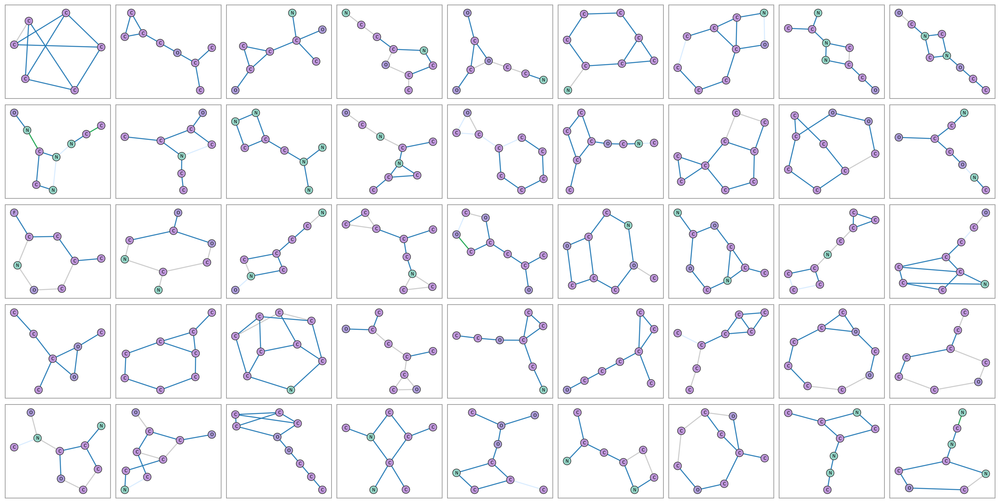

RDKit view: sampled molecules


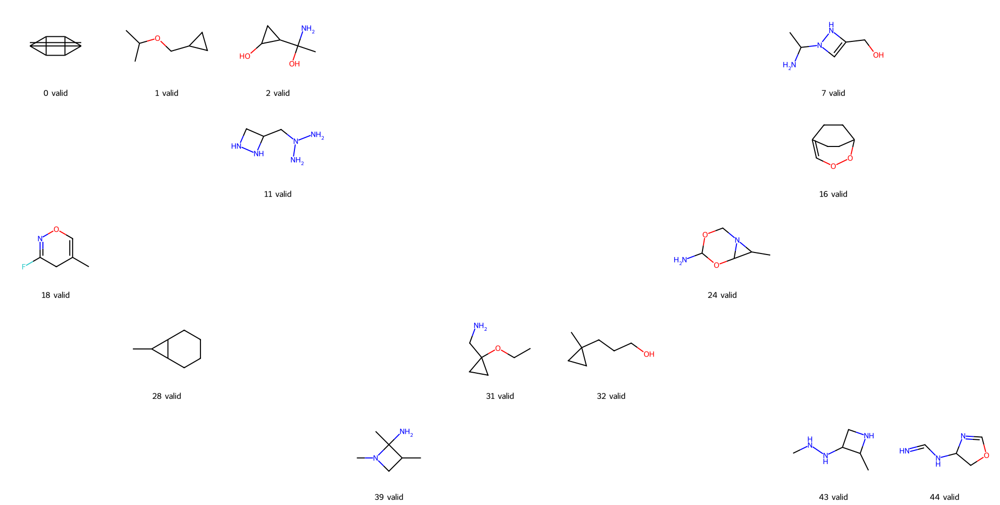

RDKit-valid in plotted subset: 14 / 45
Most common RDKit conversion/sanitization errors:
  3x non-ring atom 1 marked aromatic
  3x non-ring atom 2 marked aromatic
  2x Explicit valence for atom # 1 N, 4, is greater than permitted
  2x Explicit valence for atom # 1 O, 3, is greater than permitted
  1x Can't kekulize mol.  Unkekulized atoms: 0 7
  1x Explicit valence for atom # 7 O, 4, is greater than permitted
  1x Can't kekulize mol.  Unkekulized atoms: 6
  1x Explicit valence for atom # 0 N, 4, is greater than permitted
Displayed first 45 of 100 sampled molecules.


In [ ]:

decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.total_steps = 100

QM9_SAMPLE_N = 100
QM9_SAMPLE_DISPLAY_N = 45

n_rows = 5
n_cols = 9
n_samples = QM9_SAMPLE_N if globals().get("DATASET_MODE") == "qm9" else n_rows * n_cols

sampled_graphs = decompositional_encoder_decoder.sample(n_samples=n_samples)
print(f"Sampled {len(sampled_graphs)} graphs.")

if globals().get("DATASET_MODE") == "qm9":
    display_graphs = sampled_graphs[:QM9_SAMPLE_DISPLAY_N]
    plot_qm9_nx_then_rdkit(
        display_graphs,
        n_cols=n_cols,
        title="sampled molecules",
        figsize_per_graph=(2.2, 2.0),
        node_size=120,
        edge_width=1.5,
        font_size=6,
        rdkit_sub_img_size=(220, 200),
    )
    if len(sampled_graphs) > QM9_SAMPLE_DISPLAY_N:
        print(f"Displayed first {QM9_SAMPLE_DISPLAY_N} of {len(sampled_graphs)} sampled molecules.")
else:
    plot_networkx_graphs(
        sampled_graphs,
        n_cols=n_cols,
        figsize_per_graph=(2.2, 2.0),
        node_label_attr="label",
        edge_label_attr="label",
        node_size=120,
        edge_width=1.5,
        font_size=6,
        layout="kamada_kawai",
    )


Generated molecule validity / uniqueness / novelty summary


,n,valid_rdkit,validity,generated_unique_valid_smiles,generated_uniqueness_over_valid,generated_valid_duplicate_copies,generated_valid_train_copy_count,generated_unique_valid_train_copies,generated_train_copy_rate_over_valid,novel_unique_valid_smiles,novelty_over_unique_valid,novelty_over_valid,train_valid_smiles_total,train_unique_smiles,train_uniqueness,train_duplicate_copies
0,100,29,0.29,29,1.0,0,5,5,0.172414,24,0.827586,0.827586,49400,49338,0.998745,62


,index,valid_rdkit,connected,n_nodes,n_edges,smiles,novel_vs_train,error
0,0,True,True,6,9,C12=C3C4C1C2C34,True,None
1,1,True,True,8,8,CC(C)OCC1CC1,False,None
2,2,True,True,8,8,CC(N)(O)C1CC1O,True,None
3,3,False,True,9,9,None,False,Can't kekulize mol. Unkekulized atoms: 0 7
4,4,False,True,8,8,None,False,"Explicit valence for atom # 7 O, 4, is greater..."
5,5,False,True,8,9,None,False,Can't kekulize mol. Unkekulized atoms: 6
6,6,False,True,9,11,None,False,"Explicit valence for atom # 0 N, 4, is greater..."
7,7,True,True,9,9,CC(N)n1cc(CO)[nH]1,True,None
8,8,False,True,9,9,None,False,non-ring atom 1 marked aromatic
9,9,False,True,9,9,None,False,"Explicit valence for atom # 1 N, 4, is greater..."


Most common generated valid SMILES


,smiles,count
0,C12=C3C4C1C2C34,1
1,CC(C)OCC1CC1,1
2,CC(N)(O)C1CC1O,1
3,CC(N)n1cc(CO)[nH]1,1
4,NN(N)CC1CNN1,1
5,C1=C2CCC(CC2)OO1,1
6,CC1=CON=C(F)C1,1
7,CC1C2OC(N)OCN12,1
8,CC1C2CCCCC12,1
9,CCOC1(CN)CC1,1


Generated valid SMILES that are copies from the training set


,smiles,count
0,CC(C)OCC1CC1,1
1,CC1C2CCCCC12,1
2,CC1(CCCO)CC1,1
3,CCC(O)(CO)CO,1
4,C1CC2CC2(C2CO2)O1,1


Most common invalidity reasons


,error,count
0,non-ring atom 2 marked aromatic,6
1,"Explicit valence for atom # 5 O, 3, is greater...",4
2,"Explicit valence for atom # 2 O, 3, is greater...",4
3,"Explicit valence for atom # 1 O, 3, is greater...",3
4,non-ring atom 1 marked aromatic,3
5,non-ring atom 0 marked aromatic,2
6,"Explicit valence for atom # 1 N, 4, is greater...",2
7,"Explicit valence for atom # 6 N, 5, is greater...",2
8,"Explicit valence for atom # 6 C, 5, is greater...",2
9,"Explicit valence for atom # 2 N, 6, is greater...",2


RDKit plot of 29 unique valid sampled SMILES


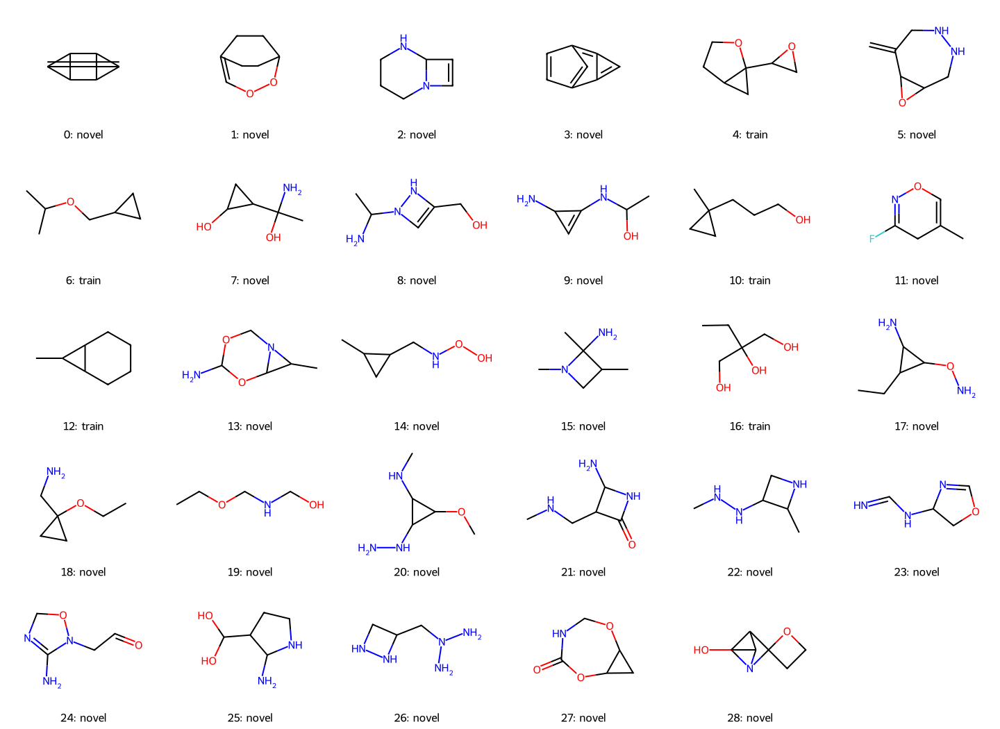

In [ ]:
# ===== QM9 molecular validity / uniqueness / novelty summary =====
if globals().get("DATASET_MODE") == "qm9":
    from collections import Counter
    import pandas as pd
    import networkx as nx
    from IPython.display import display
    from rdkit import Chem
    from rdkit.Chem import AllChem, Draw

    QM9_VALID_SAMPLE_DISPLAY_N = 36

    def _nx_molecule_to_rdkit_safe(G):
        return qm9_graph_to_rdkit_safe(G)

    def _canonical_train_smiles_list(graphs):
        smiles = []
        for graph in graphs:
            raw = graph.graph.get("smiles")
            if raw:
                mol = Chem.MolFromSmiles(str(raw))
                if mol is not None:
                    smiles.append(Chem.MolToSmiles(mol, canonical=True))
                    continue
            mol, error = _nx_molecule_to_rdkit_safe(graph)
            if error is None and mol is not None:
                smiles.append(Chem.MolToSmiles(mol, canonical=True))
        return smiles

    train_smiles = _canonical_train_smiles_list(train_graphs)
    train_smiles_set = set(train_smiles)
    molecule_eval_graphs = globals().get("sampled_graphs", [])
    rows = []
    valid_smiles = []
    valid_mols_by_smiles = {}
    for idx, G in enumerate(molecule_eval_graphs):
        mol, error = _nx_molecule_to_rdkit_safe(G)
        valid = error is None and mol is not None
        smi = Chem.MolToSmiles(mol, canonical=True) if valid else None
        if smi is not None:
            valid_smiles.append(smi)
            valid_mols_by_smiles.setdefault(smi, mol)
        rows.append({
            "index": idx,
            "valid_rdkit": bool(valid),
            "connected": nx.is_connected(G) if G.number_of_nodes() > 0 else False,
            "n_nodes": G.number_of_nodes(),
            "n_edges": G.number_of_edges(),
            "smiles": smi,
            "novel_vs_train": bool(smi is not None and smi not in train_smiles_set),
            "error": error,
        })

    molecular_sample_evaluation = pd.DataFrame(rows)
    valid_smiles_counter = Counter(valid_smiles)
    unique_valid_smiles = sorted(valid_smiles_counter)
    novel_valid_smiles = sorted(s for s in unique_valid_smiles if s not in train_smiles_set)
    generated_valid_copies_in_train = [s for s in valid_smiles if s in train_smiles_set]
    generated_valid_duplicate_count = sum(count - 1 for count in valid_smiles_counter.values() if count > 1)
    train_smiles_counter = Counter(train_smiles)
    n_total = len(molecular_sample_evaluation)
    n_valid = len(valid_smiles)
    molecular_sample_summary = pd.DataFrame([
        {
            "n": n_total,
            "valid_rdkit": n_valid,
            "validity": n_valid / n_total if n_total else 0.0,
            "generated_unique_valid_smiles": len(unique_valid_smiles),
            "generated_uniqueness_over_valid": len(unique_valid_smiles) / n_valid if n_valid else 0.0,
            "generated_valid_duplicate_copies": generated_valid_duplicate_count,
            "generated_valid_train_copy_count": len(generated_valid_copies_in_train),
            "generated_unique_valid_train_copies": len(set(generated_valid_copies_in_train)),
            "generated_train_copy_rate_over_valid": len(generated_valid_copies_in_train) / n_valid if n_valid else 0.0,
            "novel_unique_valid_smiles": len(novel_valid_smiles),
            "novelty_over_unique_valid": len(novel_valid_smiles) / len(unique_valid_smiles) if unique_valid_smiles else 0.0,
            "novelty_over_valid": sum(s not in train_smiles_set for s in valid_smiles) / n_valid if n_valid else 0.0,
            "train_valid_smiles_total": len(train_smiles),
            "train_unique_smiles": len(train_smiles_set),
            "train_uniqueness": len(train_smiles_set) / len(train_smiles) if train_smiles else 0.0,
            "train_duplicate_copies": sum(count - 1 for count in train_smiles_counter.values() if count > 1),
        }
    ])
    print("Generated molecule validity / uniqueness / novelty summary")
    display(molecular_sample_summary)
    display(molecular_sample_evaluation.head(30))

    if valid_smiles_counter:
        print("Most common generated valid SMILES")
        display(
            pd.DataFrame(valid_smiles_counter.most_common(20), columns=["smiles", "count"])
        )

    train_copy_counter = Counter(generated_valid_copies_in_train)
    if train_copy_counter:
        print("Generated valid SMILES that are copies from the training set")
        display(
            pd.DataFrame(train_copy_counter.most_common(20), columns=["smiles", "count"])
        )

    if len(molecular_sample_evaluation) and molecular_sample_evaluation["error"].notna().any():
        print("Most common invalidity reasons")
        display(
            molecular_sample_evaluation["error"]
            .dropna()
            .value_counts()
            .head(12)
            .rename_axis("error")
            .reset_index(name="count")
        )

    valid_to_plot = unique_valid_smiles[:QM9_VALID_SAMPLE_DISPLAY_N]
    if valid_to_plot:
        mols = []
        legends = []
        for idx, smi in enumerate(valid_to_plot):
            mol = valid_mols_by_smiles[smi]
            AllChem.Compute2DCoords(mol)
            mols.append(mol)
            legends.append(f"{idx}: {'novel' if smi not in train_smiles_set else 'train'}")
        print(f"RDKit plot of {len(valid_to_plot)} unique valid sampled SMILES")
        display(Draw.MolsToGridImage(
            mols,
            molsPerRow=6,
            subImgSize=(240, 210),
            legends=legends,
        ))
    else:
        print("No valid sampled SMILES to plot.")
else:
    print("Skipping molecular validity summary because DATASET_MODE != 'qm9'.")


In [ ]:
if "predicted_node_encodings_list" in globals():
    for i, enc in enumerate(predicted_node_encodings_list[:10]):
        deg = np.rint(enc[:, 1]).astype(int)
        print(i, "pred deg:", deg, "target edges:", deg.sum() / 2)
else:
    print(
        "Skipping predicted-node degree diagnostic because "
        "predicted_node_encodings_list is not defined. Run the previous "
        "quotient diagnostic cell first if you need this printout."
    )


0 pred deg: [2 2 3 2 4 2 3 2 2] target edges: 11.0
1 pred deg: [1 1 0 2 3 3 3 2 1] target edges: 8.0
2 pred deg: [1 0 3 2 1 2 2 3 0] target edges: 7.0
3 pred deg: [0 1 0 2 4 2 2 2 1] target edges: 7.0
4 pred deg: [2 2 2 1 1 2 3 3 0] target edges: 8.0
5 pred deg: [2 2 1 4 3 2 1 0 1] target edges: 8.0
6 pred deg: [1 2 1 2 2 3 2 3 0] target edges: 8.0
7 pred deg: [0 1 2 1 2 4 2 0 2] target edges: 7.0
8 pred deg: [4 2 0 2 2 3 1 1 1] target edges: 8.0
9 pred deg: [3 2 1 1 0 2 3 2 2] target edges: 8.0


In [ ]:
if globals().get("DATASET_MODE", "cycle_leg") != "cycle_leg":
    print("Skipping cycle-specific cell: # ===== Decode 100 NSPPK-14 conditions per cycle catego")
else:
    # ===== Decode 100 NSPPK-14 conditions per cycle category =====
    from collections import Counter

    import networkx as nx
    import numpy as np
    import pandas as pd
    from IPython.display import display

    CYCLE_SIZES = (3, 4, 5, 6, 7, 8)

    EVAL_CYCLE_SIZES = CYCLE_SIZES
    EVAL_GRAPHS_PER_CATEGORY = 100
    EXPECTED_TEST_GRAPHS = EVAL_GRAPHS_PER_CATEGORY * len(EVAL_CYCLE_SIZES)

    if len(test_graphs) != EXPECTED_TEST_GRAPHS:
        raise RuntimeError(
            f"Expected {EXPECTED_TEST_GRAPHS} balanced test graphs, "
            f"found {len(test_graphs)}."
        )

    EVAL_PLOT_COLUMNS = 10



    EVAL_CYCLE_LABELS = set(MOTIF_LABELS["target"])
    EVAL_LEG_LABELS = set(MOTIF_LABELS["connector"])


    def _canonical_eval_label(value):
        if isinstance(value, str):
            stripped = value.strip()
            if stripped == "":
                return value
            try:
                numeric = float(stripped)
            except ValueError:
                return value
            if numeric.is_integer() and int(numeric) in (EVAL_CYCLE_LABELS | EVAL_LEG_LABELS):
                return int(numeric)
            return value
        if isinstance(value, float) and value.is_integer():
            numeric = int(value)
            if numeric in (EVAL_CYCLE_LABELS | EVAL_LEG_LABELS):
                return numeric
        return value

    EVAL_CYCLE_BUCKETS = tuple(str(size) for size in EVAL_CYCLE_SIZES) + ("other",)

    def _cycle_category_indices(cycle_size):
        expected_target = f"cycle_{int(cycle_size)}"
        indices = [
            index
            for index, (graph, target) in enumerate(zip(test_graphs, test_targets))
            if target == expected_target
            and int(graph.graph.get("cycle_size", -1)) == int(cycle_size)
        ]
        if len(indices) != EVAL_GRAPHS_PER_CATEGORY:
            raise RuntimeError(
                f"Expected {EVAL_GRAPHS_PER_CATEGORY} test graphs for {expected_target}, "
                f"found {len(indices)}."
            )
        return indices


    def _unique_cycle_nodes(graph):
        """Return the unique cycle's nodes, or None for zero or multiple cycles."""
        if not isinstance(graph, nx.Graph) or graph.is_directed():
            return None
        try:
            cycles = nx.cycle_basis(graph)
        except (nx.NetworkXError, nx.NetworkXNotImplemented):
            return None
        if len(cycles) != 1:
            return None
        return set(cycles[0])


    def _single_cycle_nodes(graph, cycle_size):
        cycle_nodes = _unique_cycle_nodes(graph)
        if cycle_nodes is None or len(cycle_nodes) != int(cycle_size):
            return None
        return cycle_nodes


    def _has_exactly_one_requested_cycle(graph, cycle_size):
        return _single_cycle_nodes(graph, cycle_size) is not None


    def _cycle_labels_are_valid(graph, cycle_nodes):
        if cycle_nodes is None:
            return False
        for node, data in graph.nodes(data=True):
            label = _canonical_eval_label(data.get("label"))
            expected_labels = (
                EVAL_CYCLE_LABELS if node in cycle_nodes else EVAL_LEG_LABELS
            )
            if label not in expected_labels:
                return False
        return True


    def _has_requested_cycle_with_valid_labels(graph, cycle_size):
        cycle_nodes = _single_cycle_nodes(graph, cycle_size)
        return _cycle_labels_are_valid(graph, cycle_nodes)


    def _cycle_size_bucket(graph):
        cycle_nodes = _unique_cycle_nodes(graph)
        if cycle_nodes is None:
            return "no_unique_cycle"

        cycle_size = len(cycle_nodes)
        if cycle_size in EVAL_CYCLE_SIZES:
            return str(cycle_size)
        return "other"

    def _cycle_metric_row(method_name, category, cycle_size, decoded):
        cycle_matches = [
            _has_exactly_one_requested_cycle(graph, cycle_size)
            for graph in decoded
        ]
        labeled_cycle_matches = [
            _has_requested_cycle_with_valid_labels(graph, cycle_size)
            for graph in decoded
        ]
        cycle_size_counts = Counter(_cycle_size_bucket(graph) for graph in decoded)
        labeled_cycle_size_counts = Counter()
        for graph in decoded:
            cycle_nodes = _unique_cycle_nodes(graph)
            if cycle_nodes is not None and _cycle_labels_are_valid(graph, cycle_nodes):
                bucket = _cycle_size_bucket(graph)

                labeled_cycle_size_counts[bucket] += 1

        n_graphs = len(decoded)
        row = {
            "method": method_name,
            "category": category,
            "requested_cycle_size": int(cycle_size),
            "n": n_graphs,
            "exactly_one_requested_cycle": int(sum(cycle_matches)),
            "exactly_one_requested_cycle_with_valid_labels": int(
                sum(labeled_cycle_matches)
            ),
            "cycle_rate": float(np.mean(cycle_matches)),
            "cycle_with_valid_labels_rate": float(np.mean(labeled_cycle_matches)),
        }
        for bucket in EVAL_CYCLE_BUCKETS:
            row[f"one_cycle_size_{bucket}"] = int(cycle_size_counts[bucket])
            row[f"one_cycle_size_{bucket}_valid_labels"] = int(
                labeled_cycle_size_counts[bucket]
            )
        row["no_unique_cycle"] = int(cycle_size_counts["no_unique_cycle"])
        row["generated_node_counts"] = dict(
            Counter(graph.number_of_nodes() for graph in decoded)
        )
        return row


    cycle_category_conditions = {}
    cycle_category_decoded = {}
    cycle_evaluation_rows = []
    experiment_a_name = "A. true NSPPK-14 C -> frozen decoder"

    for cycle_size in EVAL_CYCLE_SIZES:
        category = f"cycle_{cycle_size}"
        indices = _cycle_category_indices(cycle_size)
        references = [test_graphs[index] for index in indices]
        conditions = decompositional_encoder_decoder.graph_encode(references)
        decoded = list(decompositional_encoder_decoder.decode(conditions))

        if len(decoded) != EVAL_GRAPHS_PER_CATEGORY:
            raise RuntimeError(
                f"Decoder returned {len(decoded)} graphs for {category}; "
                f"expected {EVAL_GRAPHS_PER_CATEGORY}."
            )

        cycle_category_conditions[category] = conditions
        cycle_category_decoded[category] = decoded
        row = _cycle_metric_row(
            experiment_a_name,
            category,
            cycle_size,
            decoded,
        )
        cycle_evaluation_rows.append(row)

        cycle_counts = " / ".join(
            f"{bucket}:{row[f'one_cycle_size_{bucket}']}"
            for bucket in EVAL_CYCLE_BUCKETS
        )
        label_counts = " / ".join(
            f"{bucket}:{row[f'one_cycle_size_{bucket}_valid_labels']}"
            for bucket in EVAL_CYCLE_BUCKETS
        )

        print(
            f"{category}: requested={cycle_size}; "
            f"cycle sizes = {cycle_counts}; "
            f"no unique cycle={row['no_unique_cycle']}."
        )
        print(f"Valid-label counts = {label_counts}.")
        plot_networkx_graphs(
            decoded,
            n_cols=EVAL_PLOT_COLUMNS,
            figsize_per_graph=(2.0, 1.8),
            node_label_attr="label",
            edge_label_attr="label",
            node_size=100,
            edge_width=1.3,
            font_size=5,
            layout="kamada_kawai",
        )

    cycle_evaluation_results = pd.DataFrame(cycle_evaluation_rows)
    display(cycle_evaluation_results)


Skipping cycle-specific cell: # ===== Decode 100 NSPPK-14 conditions per cycle catego


# Role Label Placement Diagnostic


In [ ]:
if globals().get("DATASET_MODE", "cycle_leg") != "cycle_leg":
    print("Skipping cycle-specific cell: # ===== Role label placement diagnostic =====")
else:
    # ===== Role label placement diagnostic =====
    from collections import Counter

    import numpy as np
    import pandas as pd
    from IPython.display import display

    required = (
        "cycle_category_decoded",
        "EVAL_CYCLE_SIZES",
        "EVAL_GRAPHS_PER_CATEGORY",
        "EVAL_CYCLE_LABELS",
        "EVAL_LEG_LABELS",
        "_unique_cycle_nodes",
        "_cycle_size_bucket",
    )
    missing = [name for name in required if name not in globals()]
    if missing:
        raise RuntimeError(
            "Run the quotient condition evaluation cell first. Missing: "
            + ", ".join(missing)
        )

    role_label_rows = []
    node_misplacement_rows = []
    for requested_size in EVAL_CYCLE_SIZES:
        category = f"cycle_{requested_size}"
        decoded_graphs = list(cycle_category_decoded.get(category, []))
        if len(decoded_graphs) != EVAL_GRAPHS_PER_CATEGORY:
            raise RuntimeError(
                f"Expected {EVAL_GRAPHS_PER_CATEGORY} decoded graphs for "
                f"{category}, found {len(decoded_graphs)}."
            )

        unique_cycle_graphs = 0
        requested_cycle_graphs = 0
        all_role_valid_graphs = 0
        all_role_valid_requested_graphs = 0
        cycle_nodes_total = 0
        cycle_nodes_valid = 0
        leg_nodes_total = 0
        leg_nodes_valid = 0
        decoded_bucket_counts = Counter()
        wrong_on_cycle = Counter()
        wrong_on_leg = Counter()

        for graph in decoded_graphs:
            decoded_bucket = _cycle_size_bucket(graph)
            decoded_bucket_counts[decoded_bucket] += 1
            cycle_nodes = _unique_cycle_nodes(graph)
            if cycle_nodes is None:
                continue

            unique_cycle_graphs += 1
            is_requested_cycle = len(cycle_nodes) == int(requested_size)
            if is_requested_cycle:
                requested_cycle_graphs += 1

            graph_role_valid = True
            for node, data in graph.nodes(data=True):
                label = _canonical_eval_label(data.get("label"))

                if node in cycle_nodes:
                    cycle_nodes_total += 1
                    if label in EVAL_CYCLE_LABELS:
                        cycle_nodes_valid += 1
                    else:
                        graph_role_valid = False
                        wrong_on_cycle[label] += 1
                        node_misplacement_rows.append(
                            {
                                "requested_cycle_size": int(requested_size),
                                "decoded_cycle_bucket": decoded_bucket,
                                "node_role": "cycle",
                                "bad_label": label,
                            }
                        )
                else:
                    leg_nodes_total += 1
                    if label in EVAL_LEG_LABELS:
                        leg_nodes_valid += 1
                    else:
                        graph_role_valid = False
                        wrong_on_leg[label] += 1
                        node_misplacement_rows.append(
                            {
                                "requested_cycle_size": int(requested_size),
                                "decoded_cycle_bucket": decoded_bucket,
                                "node_role": "leg",
                                "bad_label": label,
                            }
                        )

            if graph_role_valid:
                all_role_valid_graphs += 1
                if is_requested_cycle:
                    all_role_valid_requested_graphs += 1

        role_label_rows.append(
            {
                "requested_cycle_size": int(requested_size),
                "n": len(decoded_graphs),
                "unique_cycle_graphs": unique_cycle_graphs,
                "requested_cycle_graphs": requested_cycle_graphs,
                "all_role_labels_valid_graphs": all_role_valid_graphs,
                "requested_structure_and_role_labels_valid": all_role_valid_requested_graphs,
                "cycle_node_label_accuracy": (
                    cycle_nodes_valid / cycle_nodes_total
                    if cycle_nodes_total else np.nan
                ),
                "leg_node_label_accuracy": (
                    leg_nodes_valid / leg_nodes_total
                    if leg_nodes_total else np.nan
                ),
                "cycle_nodes_valid": cycle_nodes_valid,
                "cycle_nodes_total": cycle_nodes_total,
                "leg_nodes_valid": leg_nodes_valid,
                "leg_nodes_total": leg_nodes_total,
                "decoded_cycle_buckets": dict(decoded_bucket_counts),
                "wrong_labels_on_cycle_nodes": dict(wrong_on_cycle),
                "wrong_labels_on_leg_nodes": dict(wrong_on_leg),
            }
        )

    role_label_placement_results = pd.DataFrame(role_label_rows)
    print(
        "This checks placement, not just counts. Cycle nodes should use labels "
        f"{sorted(EVAL_CYCLE_LABELS)}; leg nodes should use labels "
        f"{sorted(EVAL_LEG_LABELS)}."
    )
    display(role_label_placement_results)

    if node_misplacement_rows:
        role_label_misplacements = pd.DataFrame(node_misplacement_rows)
        print("Bad labels by requested size / decoded bucket / structural role")
        display(
            role_label_misplacements.groupby(
                ["requested_cycle_size", "decoded_cycle_bucket", "node_role", "bad_label"],
                dropna=False,
            )
            .size()
            .rename("count")
            .reset_index()
            .sort_values(
                ["requested_cycle_size", "node_role", "decoded_cycle_bucket", "count"],
                ascending=[True, True, True, False],
            )
        )
    else:
        print("No role-label misplacements found among graphs with a unique cycle.")

    fig, ax = plt.subplots(figsize=(8.0, 4.2))
    x = np.arange(len(role_label_placement_results))
    width = 0.36
    ax.bar(
        x - width / 2,
        role_label_placement_results["cycle_node_label_accuracy"],
        width,
        label="cycle nodes have cycle labels",
        color="#d62828",
        alpha=0.82,
    )
    ax.bar(
        x + width / 2,
        role_label_placement_results["leg_node_label_accuracy"],
        width,
        label="leg nodes have leg labels",
        color="#1f77b4",
        alpha=0.82,
    )
    ax.set_xticks(x)
    ax.set_xticklabels(role_label_placement_results["requested_cycle_size"])
    ax.set_xlabel("requested cycle size")
    ax.set_ylabel("node-level role label accuracy")
    ax.set_ylim(0.0, 1.05)
    ax.set_title("Are labels placed on the correct structural role?")
    ax.grid(True, axis="y", linestyle=":", alpha=0.35)
    ax.legend(frameon=False)
    plt.tight_layout()
    plt.show()


Skipping cycle-specific cell: # ===== Role label placement diagnostic =====


# Cycle Condition Scatter Plot


# ===== QM9 1000 generated / 1000 condition-decoded / 1000 train comparison =====



Condition pool: 600 test + 49400 train = 50000 graphs; decoding 1000 conditions.
Generating 1000 free samples...
Sampling 1000 graphs
Predicting node matrices for 1000 graphs...
Predicting node matrices for 1000 graphs...
Condition-predicted node counts: {3: 1, 5: 5, 6: 13, 7: 76, 8: 361, 9: 544}
Condition-predicted degree histograms: {(0, 0, 1, 8, 0): 1, (0, 0, 2, 4, 0): 1, (0, 0, 2, 6, 0): 1, (0, 0, 3, 0, 0): 1, (0, 0, 3, 4, 0): 2, (0, 0, 3, 6, 0): 11, (0, 0, 4, 2, 0): 1, (0, 0, 4, 2, 1): 1, (0, 0, 4, 4, 0): 2, (0, 0, 4, 4, 1): 13, (0, 0, 5, 2, 0): 1, (0, 0, 5, 2, 1): 4, (0, 0, 5, 2, 2): 3, (0, 0, 5, 4, 0): 34, (0, 0, 6, 0, 1): 2, (0, 0, 6, 2, 0): 16, (0, 0, 6, 2, 1): 31, (0, 0, 7, 0, 0): 1, (0, 0, 7, 0, 1): 1, (0, 0, 7, 0, 2): 3, (0, 0, 7, 2, 0): 22, (0, 0, 8, 0, 1): 3, (0, 0, 9, 0, 0): 3, (0, 1, 1, 5, 0): 1, (0, 1, 1, 5, 1): 2, (0, 1, 1, 7, 0): 4, (0, 1, 2, 3, 0): 1, (0, 1, 2, 5, 0): 7, (0, 1, 2, 5, 1): 5, (0, 1, 3, 1, 0): 2, (0, 1, 3, 1, 1): 1, (0, 1, 3, 3, 0): 5, (0, 1, 3, 3, 1):

,source,n,valid_rdkit,validity,connected_rate,unique_valid_smiles,uniqueness_over_valid,duplicate_valid_copies,novelty_over_valid,mean_nodes,...,mean_degree,mean_density,mean_mol_weight_valid,mean_C,mean_N,mean_O,mean_F,mean_single_bonds,mean_double_bonds,mean_triple_bonds
0,generated,1000.0,337.0,0.337,1.0,336.0,0.997033,1.0,0.839763,8.422,...,2.141887,0.291146,117.957415,5.962,1.142,1.289,0.029,7.399,0.158,0.410
1,decoded_from_conditions,1000.0,334.0,0.334,1.0,332.0,0.994012,2.0,0.820359,8.464,...,2.156127,0.290804,118.537449,6.039,1.159,1.258,0.008,7.466,0.153,0.408
2,train_reference,1000.0,897.0,0.897,1.0,897.0,1.000000,0.0,0.011148,8.514,...,2.157782,0.288628,117.706872,6.065,1.118,1.321,0.010,6.751,0.743,0.265


Per-molecule rows


,source,index,valid_rdkit,connected,n_nodes,n_edges,density,mean_degree,max_degree,n_C,n_N,n_O,n_F,n_single,n_double,n_triple,smiles,novel_vs_train,mol_weight,error
0,generated,0,True,True,8,9,0.321429,2.250000,4,7,0,1,0,8,0,0,CC12CC=C(O)C1C2,True,110.156,None
1,generated,1,False,True,9,10,0.277778,2.222222,3,6,2,1,0,10,0,0,None,False,NaN,"Explicit valence for atom # 1 O, 3, is greater..."
2,generated,2,False,True,9,9,0.250000,2.000000,2,8,0,1,0,2,2,3,None,False,NaN,"Explicit valence for atom # 0 C, 6, is greater..."
3,generated,3,False,True,8,8,0.285714,2.000000,3,6,0,2,0,6,0,0,None,False,NaN,Can't kekulize mol. Unkekulized atoms: 0 4
4,generated,4,False,True,9,10,0.277778,2.222222,3,6,1,2,0,6,0,3,None,False,NaN,"Explicit valence for atom # 4 N, 9, is greater..."
5,generated,5,True,True,9,8,0.222222,1.777778,3,6,1,2,0,8,0,0,COCNCC(C)OC,True,133.191,None
6,generated,6,True,True,9,11,0.305556,2.444444,4,7,1,1,0,11,0,0,CC12CCC3OCN1C32,True,125.171,None
7,generated,7,False,True,8,8,0.285714,2.000000,3,4,2,1,1,3,1,1,None,False,NaN,Can't kekulize mol. Unkekulized atoms: 2
8,generated,8,True,True,7,7,0.333333,2.000000,3,6,0,1,0,7,0,0,COCC1CC1C,False,100.161,None
9,generated,9,False,True,8,7,0.250000,1.750000,3,6,1,1,0,6,0,0,None,False,NaN,non-ring atom 3 marked aromatic


Invalidity reasons by source


,source,error,count
163,decoded_from_conditions,non-ring atom 0 marked aromatic,36
74,decoded_from_conditions,"Explicit valence for atom # 0 C, 5, is greater...",19
104,decoded_from_conditions,"Explicit valence for atom # 2 O, 3, is greater...",18
165,decoded_from_conditions,non-ring atom 2 marked aromatic,18
116,decoded_from_conditions,"Explicit valence for atom # 3 O, 3, is greater...",17
145,decoded_from_conditions,"Explicit valence for atom # 6 O, 3, is greater...",17
164,decoded_from_conditions,non-ring atom 1 marked aromatic,17
81,decoded_from_conditions,"Explicit valence for atom # 0 O, 3, is greater...",15
166,decoded_from_conditions,non-ring atom 3 marked aromatic,15
63,decoded_from_conditions,Can't kekulize mol. Unkekulized atoms: 4,14


Most common valid SMILES by source


,source,smiles,count
0,generated,CCCC(C)CC,2
1,generated,CC12CC=C(O)C1C2,1
2,generated,COCNCC(C)OC,1
3,generated,CC12CCC3OCN1C32,1
4,generated,COCC1CC1C,1
5,generated,CC1C2CN3C1C23,1
6,generated,CCC1C(C)CC1C,1
7,generated,CNC1N2C=C3C(C2)N31,1
8,generated,CC(CO)OCN,1
9,generated,CC1CC1C1CC1,1


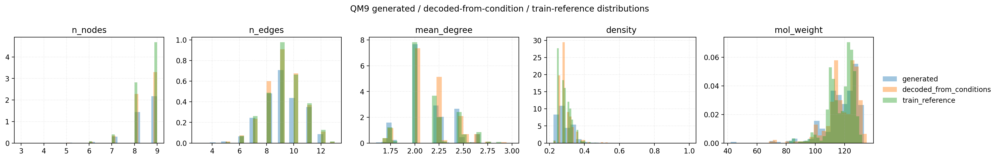

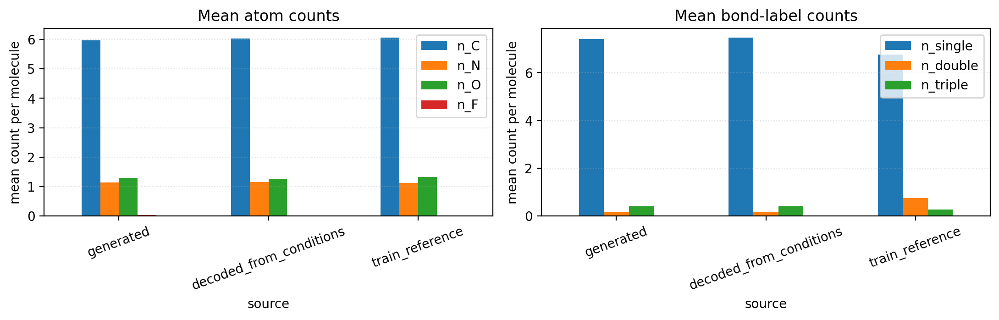

In [ ]:
# ===== QM9 1000 generated / 1000 condition-decoded / 1000 train comparison =====
import random
from collections import Counter

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
from IPython.display import display
from rdkit import Chem
from rdkit.Chem import Descriptors

QM9_COMPARE_N = 1000
QM9_COMPARE_SEED = 1234
QM9_COMPARE_DECODE_STEPS = 100

rng = random.Random(QM9_COMPARE_SEED)

def qm9_clean_label(value, *, missing=None):
    if value is None:
        return missing
    try:
        if isinstance(value, float) and np.isnan(value):
            return missing
    except Exception:
        pass
    text = str(value).strip()
    if text == "" or text.lower() in {"none", "nan", "null"}:
        return missing
    return text

def qm9_graph_to_rdkit_safe(G):
    if G is None:
        return None, "missing graph"
    if G.number_of_nodes() == 0:
        return None, "empty molecule graph"

    mol = Chem.RWMol()
    node_to_atom = {}

    for node, data in G.nodes(data=True):
        symbol = qm9_clean_label(
            data.get("label", data.get("atom", data.get("element"))),
            missing=None,
        )
        if symbol is None:
            return None, f"missing atom label at node {node!r}"
        try:
            node_to_atom[node] = mol.AddAtom(Chem.Atom(symbol))
        except Exception:
            return None, f"bad atom label {symbol!r} at node {node!r}"

    bond_type_by_label = {
        "1": Chem.BondType.SINGLE,
        "1.0": Chem.BondType.SINGLE,
        "SINGLE": Chem.BondType.SINGLE,
        "2": Chem.BondType.DOUBLE,
        "2.0": Chem.BondType.DOUBLE,
        "DOUBLE": Chem.BondType.DOUBLE,
        "3": Chem.BondType.TRIPLE,
        "3.0": Chem.BondType.TRIPLE,
        "TRIPLE": Chem.BondType.TRIPLE,
        "1.5": Chem.BondType.AROMATIC,
        "AROMATIC": Chem.BondType.AROMATIC,
    }

    for u, v, data in G.edges(data=True):
        raw = qm9_clean_label(data.get("label"), missing="1")
        key = str(raw).strip().upper()
        bond_type = bond_type_by_label.get(key)
        if bond_type is None:
            return None, f"bad bond label {raw!r} on edge {(u, v)!r}"
        try:
            mol.AddBond(node_to_atom[u], node_to_atom[v], bond_type)
        except Exception as exc:
            return None, str(exc)

    out = mol.GetMol()
    try:
        Chem.SanitizeMol(out)
    except Exception as exc:
        return out, str(exc)
    return out, None

def canonical_smiles_from_graph(G):
    mol, error = qm9_graph_to_rdkit_safe(G)
    if error is not None or mol is None:
        return None, error
    return Chem.MolToSmiles(mol, canonical=True), None

def train_smiles_set_from_graphs(graphs):
    smiles = []
    for G in graphs:
        raw = G.graph.get("smiles")
        if raw:
            mol = Chem.MolFromSmiles(str(raw))
            if mol is not None:
                smiles.append(Chem.MolToSmiles(mol, canonical=True))
                continue
        smi, error = canonical_smiles_from_graph(G)
        if smi is not None:
            smiles.append(smi)
    return set(smiles)

def graph_eval_row(source, idx, G, train_smiles_set):
    mol, error = qm9_graph_to_rdkit_safe(G)
    valid = error is None and mol is not None
    smiles = Chem.MolToSmiles(mol, canonical=True) if valid else None

    atom_hist = Counter(
        qm9_clean_label(data.get("label"), missing="__missing__")
        for _, data in G.nodes(data=True)
    )
    bond_hist = Counter(
        qm9_clean_label(data.get("label"), missing="1")
        for _, _, data in G.edges(data=True)
    )

    n_nodes = G.number_of_nodes()
    n_edges = G.number_of_edges()
    possible_edges = n_nodes * (n_nodes - 1) / 2

    return {
        "source": source,
        "index": idx,
        "valid_rdkit": bool(valid),
        "connected": bool(nx.is_connected(G)) if n_nodes > 0 else False,
        "n_nodes": n_nodes,
        "n_edges": n_edges,
        "density": n_edges / possible_edges if possible_edges else 0.0,
        "mean_degree": 2 * n_edges / n_nodes if n_nodes else 0.0,
        "max_degree": max(dict(G.degree()).values()) if n_nodes else 0,
        "n_C": atom_hist.get("C", 0),
        "n_N": atom_hist.get("N", 0),
        "n_O": atom_hist.get("O", 0),
        "n_F": atom_hist.get("F", 0),
        "n_single": bond_hist.get("1", 0) + bond_hist.get("1.0", 0),
        "n_double": bond_hist.get("2", 0) + bond_hist.get("2.0", 0),
        "n_triple": bond_hist.get("3", 0) + bond_hist.get("3.0", 0),
        "smiles": smiles,
        "novel_vs_train": bool(smiles is not None and smiles not in train_smiles_set),
        "mol_weight": float(Descriptors.MolWt(mol)) if valid else np.nan,
        "error": error,
    }

train_pool = list(train_graphs)
test_pool = list(test_graphs)
condition_pool = test_pool + train_pool

if len(train_pool) >= QM9_COMPARE_N:
    train_reference_graphs = rng.sample(train_pool, k=QM9_COMPARE_N)
else:
    train_reference_graphs = [rng.choice(train_pool) for _ in range(QM9_COMPARE_N)]
    print(f"Only {len(train_pool)} train graphs available; sampled train reference with replacement.")

if len(condition_pool) >= QM9_COMPARE_N:
    condition_reference_graphs = rng.sample(condition_pool, k=QM9_COMPARE_N)
else:
    condition_reference_graphs = [rng.choice(condition_pool) for _ in range(QM9_COMPARE_N)]
    print(f"Only {len(condition_pool)} condition graphs available; sampled conditions with replacement.")

print(
    f"Condition pool: {len(test_pool)} test + {len(train_pool)} train = "
    f"{len(condition_pool)} graphs; decoding {len(condition_reference_graphs)} conditions."
)

train_smiles_set = train_smiles_set_from_graphs(train_graphs)

print(f"Generating {QM9_COMPARE_N} free samples...")
generated_graphs_1000 = decompositional_encoder_decoder.sample(n_samples=QM9_COMPARE_N)

print(f"Decoding {len(condition_reference_graphs)} graphs from real QM9 graph-level conditions...")
gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
old_steps = getattr(gen, "total_steps", None)
gen.total_steps = QM9_COMPARE_DECODE_STEPS

condition_vectors = decompositional_encoder_decoder.graph_encode(condition_reference_graphs)
decoded_from_conditions_1000 = decompositional_encoder_decoder.decode(condition_vectors)

if old_steps is not None:
    gen.total_steps = old_steps

rows = []
for source, graphs in [
    ("generated", generated_graphs_1000),
    ("decoded_from_conditions", decoded_from_conditions_1000),
    ("train_reference", train_reference_graphs),
]:
    for idx, G in enumerate(graphs):
        rows.append(graph_eval_row(source, idx, G, train_smiles_set))

qm9_1000_comparison_rows = pd.DataFrame(rows)

def summarize_group(df):
    valid_smiles = df.loc[df["valid_rdkit"] & df["smiles"].notna(), "smiles"].tolist()
    valid_counter = Counter(valid_smiles)
    unique_valid = set(valid_smiles)

    return pd.Series({
        "n": len(df),
        "valid_rdkit": int(df["valid_rdkit"].sum()),
        "validity": float(df["valid_rdkit"].mean()) if len(df) else 0.0,
        "connected_rate": float(df["connected"].mean()) if len(df) else 0.0,
        "unique_valid_smiles": len(unique_valid),
        "uniqueness_over_valid": len(unique_valid) / len(valid_smiles) if valid_smiles else 0.0,
        "duplicate_valid_copies": sum(c - 1 for c in valid_counter.values() if c > 1),
        "novelty_over_valid": float(df.loc[df["valid_rdkit"], "novel_vs_train"].mean()) if valid_smiles else 0.0,
        "mean_nodes": df["n_nodes"].mean(),
        "mean_edges": df["n_edges"].mean(),
        "mean_degree": df["mean_degree"].mean(),
        "mean_density": df["density"].mean(),
        "mean_mol_weight_valid": df.loc[df["valid_rdkit"], "mol_weight"].mean(),
        "mean_C": df["n_C"].mean(),
        "mean_N": df["n_N"].mean(),
        "mean_O": df["n_O"].mean(),
        "mean_F": df["n_F"].mean(),
        "mean_single_bonds": df["n_single"].mean(),
        "mean_double_bonds": df["n_double"].mean(),
        "mean_triple_bonds": df["n_triple"].mean(),
    })

qm9_1000_comparison_summary = (
    qm9_1000_comparison_rows
    .groupby("source", sort=False)
    .apply(summarize_group)
    .reset_index()
)

print("QM9 1000-vs-1000 molecular / graph statistics summary")
display(qm9_1000_comparison_summary)

print("Per-molecule rows")
display(qm9_1000_comparison_rows.head(50))

if qm9_1000_comparison_rows["error"].notna().any():
    print("Invalidity reasons by source")
    invalidity = (
        qm9_1000_comparison_rows
        .dropna(subset=["error"])
        .groupby(["source", "error"])
        .size()
        .reset_index(name="count")
        .sort_values(["source", "count"], ascending=[True, False])
    )
    display(invalidity.groupby("source", group_keys=False).head(12))

print("Most common valid SMILES by source")
common_rows = []
for source, df in qm9_1000_comparison_rows.groupby("source", sort=False):
    for smi, count in Counter(df.loc[df["valid_rdkit"], "smiles"].dropna()).most_common(15):
        common_rows.append({"source": source, "smiles": smi, "count": count})
display(pd.DataFrame(common_rows))

plot_columns = ["n_nodes", "n_edges", "mean_degree", "density", "mol_weight"]
fig, axes = plt.subplots(1, len(plot_columns), figsize=(4.0 * len(plot_columns), 3.2))

for ax, column in zip(axes, plot_columns):
    for source, df in qm9_1000_comparison_rows.groupby("source", sort=False):
        ax.hist(df[column].dropna(), bins=24, alpha=0.42, label=source, density=True)
    ax.set_title(column)
    ax.grid(True, linestyle=":", alpha=0.35)

axes[-1].legend(loc="center left", bbox_to_anchor=(1.02, 0.5), frameon=False)
fig.suptitle("QM9 generated / decoded-from-condition / train-reference distributions")
plt.tight_layout()
plt.show()

atom_mean = qm9_1000_comparison_rows.groupby("source", sort=False)[["n_C", "n_N", "n_O", "n_F"]].mean()
bond_mean = qm9_1000_comparison_rows.groupby("source", sort=False)[["n_single", "n_double", "n_triple"]].mean()

fig, axes = plt.subplots(1, 2, figsize=(11, 3.6))

atom_mean.plot(kind="bar", ax=axes[0])
axes[0].set_title("Mean atom counts")
axes[0].set_ylabel("mean count per molecule")
axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(True, axis="y", linestyle=":", alpha=0.35)

bond_mean.plot(kind="bar", ax=axes[1])
axes[1].set_title("Mean bond-label counts")
axes[1].set_ylabel("mean count per molecule")
axes[1].tick_params(axis="x", rotation=20)
axes[1].grid(True, axis="y", linestyle=":", alpha=0.35)

plt.tight_layout()
plt.show()

,plot_id,original_condition_index
0,0,3
1,1,6
2,2,8
3,3,12
4,4,13
5,5,15
6,6,19
7,7,23
8,8,25
9,9,30


Decoded valid+novel rows available: 274. Plotting 60 matched condition/decode pairs.
Matching condition molecules - NetworkX


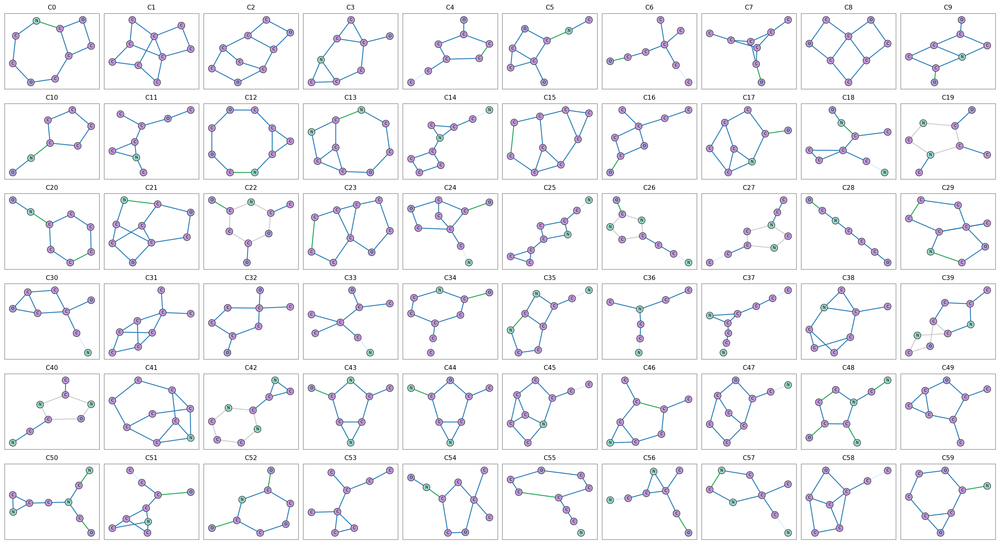

Matching condition molecules - RDKit


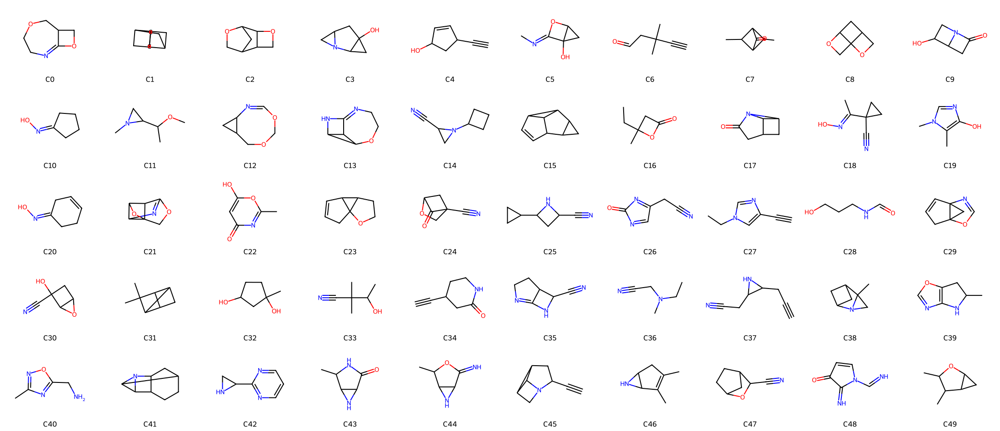

RDKit-valid: 60 / 60
Decoded valid+novel molecules from those same conditions - NetworkX


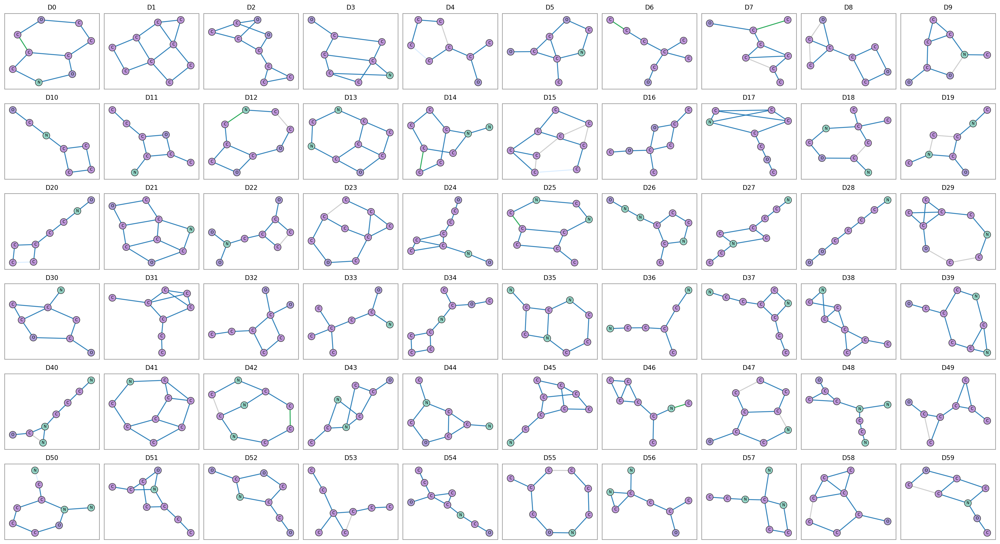

Decoded valid+novel molecules from those same conditions - RDKit


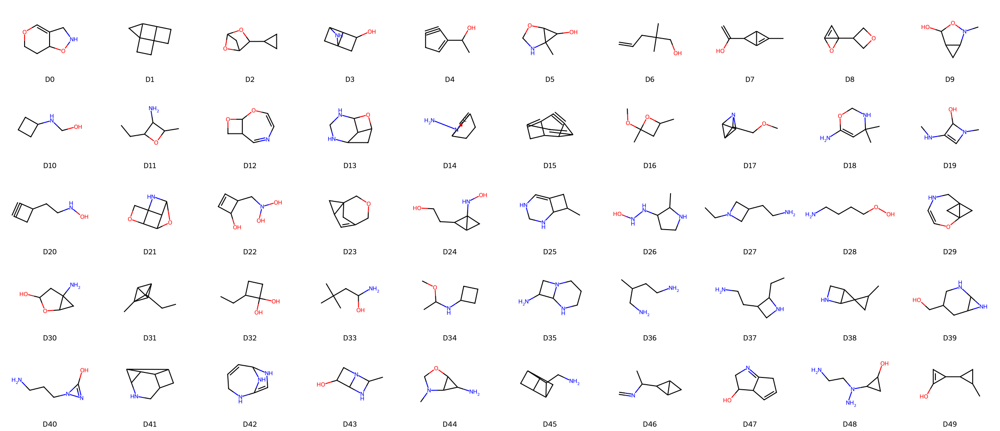

RDKit-valid: 60 / 60


In [ ]:
# ===== Same conditions where decoded molecule is valid + novel =====
from IPython.display import display
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

VALID_NOVEL_MATCH_DISPLAY_N = 60
VALID_NOVEL_MATCH_MOLS_PER_ROW = 10

required = (
    "condition_reference_graphs",
    "decoded_from_conditions_1000",
    "qm9_1000_comparison_rows",
)
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError("Run the QM9 1000 comparison cell first. Missing: " + ", ".join(missing))

decoded_valid_novel_rows = qm9_1000_comparison_rows[
    (qm9_1000_comparison_rows["source"] == "decoded_from_conditions")
    & (qm9_1000_comparison_rows["valid_rdkit"])
    & (qm9_1000_comparison_rows["novel_vs_train"])
    & (qm9_1000_comparison_rows["smiles"].notna())
].copy()

selected_indices = []
for idx in decoded_valid_novel_rows["index"].astype(int).tolist():
    if idx >= len(condition_reference_graphs) or idx >= len(decoded_from_conditions_1000):
        continue

    condition_mol, condition_error = qm9_graph_to_rdkit_safe(condition_reference_graphs[idx])
    decoded_mol, decoded_error = qm9_graph_to_rdkit_safe(decoded_from_conditions_1000[idx])

    # Condition must be RDKit-valid; decoded must be RDKit-valid + already novel by table.
    if condition_error is None and condition_mol is not None and decoded_error is None and decoded_mol is not None:
        selected_indices.append(idx)

    if len(selected_indices) >= VALID_NOVEL_MATCH_DISPLAY_N:
        break

condition_plot_graphs = []
decoded_plot_graphs = []

for plot_i, idx in enumerate(selected_indices):
    condition_graph = condition_reference_graphs[idx].copy()
    decoded_graph = decoded_from_conditions_1000[idx].copy()
    condition_graph.graph["plot_title"] = f"C{plot_i}"
    decoded_graph.graph["plot_title"] = f"D{plot_i}"

    condition_plot_graphs.append(condition_graph)
    decoded_plot_graphs.append(decoded_graph)
matched_index_table = pd.DataFrame({
    "plot_id": list(range(len(selected_indices))),
    "original_condition_index": selected_indices,
})
display(matched_index_table)

def _plot_rdkit_graph_grid(graphs, *, title, mols_per_row=10):
    mols = []
    legends = []
    errors = []

    for idx, graph in enumerate(graphs):
        mol, error = qm9_graph_to_rdkit_safe(graph)
        label = graph.graph.get("plot_title", str(idx))

        if error is None and mol is not None:
            try:
                AllChem.Compute2DCoords(mol)
            except Exception:
                pass
            mols.append(mol)
            legends.append(label)
        else:
            mols.append(Chem.MolFromSmiles(""))
            legends.append(f"{label} invalid")
            errors.append(error)

    print(title)
    if mols:
        display(Draw.MolsToGridImage(
            mols,
            molsPerRow=mols_per_row,
            subImgSize=(220, 190),
            legends=legends,
        ))
        print(f"RDKit-valid: {len(mols) - len(errors)} / {len(mols)}")
    else:
        print("No molecules to plot.")

print(
    f"Decoded valid+novel rows available: {len(decoded_valid_novel_rows)}. "
    f"Plotting {len(selected_indices)} matched condition/decode pairs."
)

print("Matching condition molecules - NetworkX")
plot_networkx_graphs(
    condition_plot_graphs,
    n_cols=VALID_NOVEL_MATCH_MOLS_PER_ROW,
    graph_title_attr="plot_title",
    figsize_per_graph=(2.2, 2.0),
    node_label_attr="label",
    edge_label_attr="label",
    node_size=120,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
)

_plot_rdkit_graph_grid(
    condition_plot_graphs,
    title="Matching condition molecules - RDKit",
    mols_per_row=VALID_NOVEL_MATCH_MOLS_PER_ROW,
)

print("Decoded valid+novel molecules from those same conditions - NetworkX")
plot_networkx_graphs(
    decoded_plot_graphs,
    n_cols=VALID_NOVEL_MATCH_MOLS_PER_ROW,
    graph_title_attr="plot_title",
    figsize_per_graph=(2.2, 2.0),
    node_label_attr="label",
    edge_label_attr="label",
    node_size=120,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
)

_plot_rdkit_graph_grid(
    decoded_plot_graphs,
    title="Decoded valid+novel molecules from those same conditions - RDKit",
    mols_per_row=VALID_NOVEL_MATCH_MOLS_PER_ROW,
)

In [ ]:
print("train_graphs:", len(train_graphs))
print("train_smiles_set:", len(train_smiles_set))
print("train_reference_graphs:", len(train_reference_graphs))

train_graphs: 49400
train_smiles_set: 49338
train_reference_graphs: 1000


Train copy-check set size: 49338
Reloaded QM9 condition source: 100000
Held-out condition pool not in train: 50598
Decoding 10000 held-out QM9 conditions...
Encoding 10000 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 480.80 seconds (8.01 minutes, 0.13 hours).
Decoding 10000 conditioning vectors
Predicting node matrices for 10000 graphs...
Predicting node matrices for 10000 graphs...
Condition-predicted node counts: {6: 2, 7: 10, 8: 2122, 9: 7866}
Condition-predicted degree histograms: {(0, 0, 3, 5, 1): 1, (0, 0, 4, 2, 0): 1, (0, 0, 4, 3, 2): 2, (0, 0, 4, 4, 1): 2, (0, 0, 5, 2, 2): 1, (0, 0, 5, 3, 1): 2, (0, 0, 5, 4, 0): 2, (0, 0, 6, 1, 1): 1, (0, 0, 6, 1, 2): 1, (0, 0, 6, 2, 1): 2, (0, 0, 7, 2, 0): 3, (0, 0, 8, 0, 1): 1, (0, 0, 9, 0, 0): 2, (0, 1, 0, 7, 1): 12, (0, 1, 1, 5, 1): 1, (0, 1, 1, 7, 0): 30, (0, 1, 2, 4, 2): 4, (0, 1, 2, 5, 1): 152, (0, 1, 2, 6, 0): 1, (0, 1, 3, 2, 2): 14, (0, 1, 3, 3, 1): 7, (0, 1, 3, 3, 2): 38, (0, 1, 3, 4, 1): 14, (0, 1

,source,n,valid_rdkit,validity,connected_rate,unique_valid_smiles,uniqueness_over_valid,valid_plus_unique_rate,valid_plus_unique_novel_smiles,valid_plus_unique_novel_rate,...,std_logp_valid,mean_tpsa_valid,mean_qed_valid,mean_C,mean_N,mean_O,mean_F,mean_single_bonds,mean_double_bonds,mean_triple_bonds
0,heldout_conditions,10000.0,9982.0,0.9982,1.0,9982.0,1.000000,0.9982,9982.0,0.9982,...,0.991733,35.007091,0.450722,6.7427,0.7867,1.4646,0.0000,8.5891,0.8172,0.3184
1,decoded_from_heldout_conditions,10000.0,3862.0,0.3862,1.0,3816.0,0.988089,0.3816,3622.0,0.3622,...,1.075255,32.802618,0.477390,6.5353,0.7861,1.4638,0.0000,8.4192,0.1358,0.3433
2,train_reference,10000.0,8994.0,0.8994,1.0,8990.0,0.999555,0.8990,111.0,0.0111,...,0.885800,34.421937,0.447395,6.0208,1.1551,1.2772,0.0105,6.6131,0.7174,0.2972


Per-molecule decoded rows preview


,source,index,valid_rdkit,connected,n_nodes,n_edges,density,mean_degree,max_degree,n_C,...,n_double,n_triple,smiles,copy_vs_train,novel_vs_train,mol_weight,logp,tpsa,qed,error
10000,decoded_from_heldout_conditions,0,True,True,9,10,0.277778,2.222222,4,6,...,0,0,CC1OCC12C(N)C2O,False,True,129.159,-0.9067,55.48,0.445098,None
10001,decoded_from_heldout_conditions,1,True,True,9,11,0.305556,2.444444,4,8,...,0,0,CCCC12CC1C1OC12,False,True,124.183,1.5738,12.53,0.508966,None
10002,decoded_from_heldout_conditions,2,True,True,9,10,0.277778,2.222222,3,8,...,0,0,CC1OC1C(C)C1CC1,False,True,126.199,1.8198,12.53,0.514037,None
10003,decoded_from_heldout_conditions,3,False,True,9,11,0.305556,2.444444,4,7,...,1,0,None,False,False,NaN,NaN,NaN,NaN,Can't kekulize mol. Unkekulized atoms: 6
10004,decoded_from_heldout_conditions,4,True,True,9,10,0.277778,2.222222,4,9,...,0,0,CC1CCC2(C=C2)C1C,False,True,122.211,2.6086,0.00,0.433139,None
10005,decoded_from_heldout_conditions,5,False,True,8,8,0.285714,2.000000,3,3,...,0,0,None,False,False,NaN,NaN,NaN,NaN,"Explicit valence for atom # 7 O, 3, is greater..."
10006,decoded_from_heldout_conditions,6,False,True,9,9,0.250000,2.000000,4,7,...,0,0,None,False,False,NaN,NaN,NaN,NaN,non-ring atom 3 marked aromatic
10007,decoded_from_heldout_conditions,7,False,True,9,10,0.277778,2.222222,3,6,...,0,1,None,False,False,NaN,NaN,NaN,NaN,"Explicit valence for atom # 0 N, 4, is greater..."
10008,decoded_from_heldout_conditions,8,True,True,9,11,0.305556,2.444444,4,6,...,0,0,OC12ONC1=CC21CC1,False,True,125.127,-0.1125,41.49,0.474233,None
10009,decoded_from_heldout_conditions,9,False,True,8,9,0.321429,2.250000,4,6,...,0,0,None,False,False,NaN,NaN,NaN,NaN,"Explicit valence for atom # 6 N, 6, is greater..."


Invalidity reasons by source


,source,error,count
306,decoded_from_heldout_conditions,non-ring atom 0 marked aromatic,219
199,decoded_from_heldout_conditions,"Explicit valence for atom # 1 O, 3, is greater...",192
307,decoded_from_heldout_conditions,non-ring atom 1 marked aromatic,177
180,decoded_from_heldout_conditions,"Explicit valence for atom # 0 O, 3, is greater...",162
245,decoded_from_heldout_conditions,"Explicit valence for atom # 4 O, 3, is greater...",162
216,decoded_from_heldout_conditions,"Explicit valence for atom # 2 O, 3, is greater...",149
232,decoded_from_heldout_conditions,"Explicit valence for atom # 3 O, 3, is greater...",148
169,decoded_from_heldout_conditions,"Explicit valence for atom # 0 C, 5, is greater...",144
309,decoded_from_heldout_conditions,non-ring atom 3 marked aromatic,137
308,decoded_from_heldout_conditions,non-ring atom 2 marked aromatic,131


Most common valid decoded SMILES


,smiles,count
0,CCC(O)CC1CC1C,3
1,CC1(C)CC2CC21C,2
2,OC1CCC2CC2CO1,2
3,CCC1CCC12CCO2,2
4,CCC12CC(C)C1C2,2
5,CCCOC1CCC1C,2
6,CCC(C)OC1CCC1,2
7,CC1CCCC(O)OC1,2
8,CCC1(C)CCC1C,2
9,CC1CC1(C#CO)CO,2


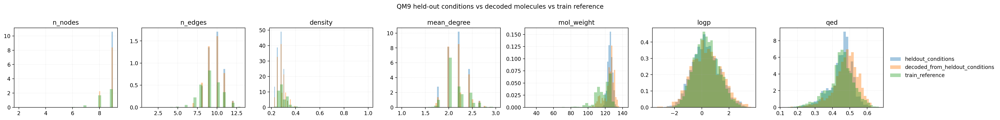

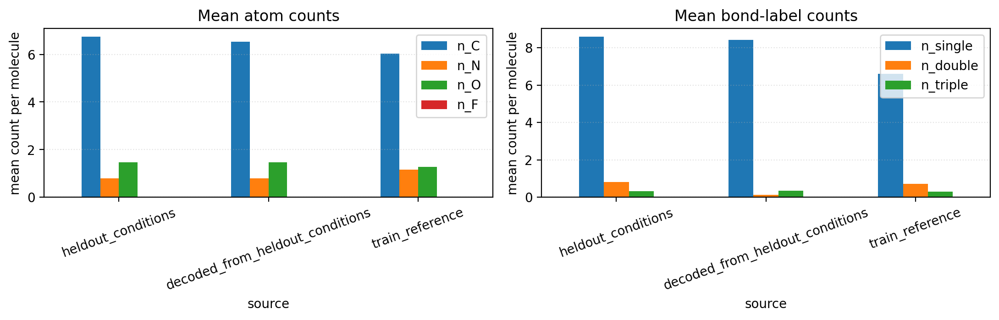

In [ ]:

# ===== QM9 10k held-out-condition generation: validity, uniqueness, copy-rate, density, logP =====
# Generates from QM9 molecules NOT seen in training, then evaluates generated molecules.
# Novelty/copy-rate is always measured against the full train_graphs SMILES set.
if globals().get("DATASET_MODE") == "qm9":
    import random
    from collections import Counter

    import matplotlib.pyplot as plt
    import networkx as nx
    import numpy as np
    import pandas as pd
    from IPython.display import display
    from rdkit import Chem
    from rdkit.Chem import Descriptors, QED

    QM9_HELDOUT_DECODE_N = 10_000
    QM9_HELDOUT_LOAD_MAX = 100_000  # set None to load the whole local file
    QM9_HELDOUT_SEED = 2026
    QM9_HELDOUT_DECODE_STEPS = 100
    QM9_TRAIN_REFERENCE_N = 10_000

    rng = random.Random(QM9_HELDOUT_SEED)

    def _canonical_smiles_for_graph(graph):
        raw = graph.graph.get("smiles")
        if raw:
            mol = Chem.MolFromSmiles(str(raw))
            if mol is not None:
                return Chem.MolToSmiles(mol, canonical=True)
        smi, error = qm9_canonical_smiles_from_graph(graph)
        return smi

    def _smiles_set_for_graphs(graphs):
        out = set()
        for graph in graphs:
            smi = _canonical_smiles_for_graph(graph)
            if smi is not None:
                out.add(smi)
        return out

    qm9_train_smiles_set_full = _smiles_set_for_graphs(train_graphs)
    print("Train copy-check set size:", len(qm9_train_smiles_set_full))

    # Prefer the full loaded QM9 pool if it exists; otherwise reload more from QM9_SOURCE_PATH.
    if "all_graphs" in globals() and len(all_graphs) >= QM9_HELDOUT_DECODE_N + len(train_graphs):
        qm9_full_condition_source = list(all_graphs)
        print("Using existing all_graphs:", len(qm9_full_condition_source))
    else:
        if "_load_molecules_from_path" not in globals():
            raise RuntimeError("Run the QM9 dataset construction cell first; it defines _load_molecules_from_path().")
        qm9_full_condition_source, _ = _load_molecules_from_path(
            QM9_SOURCE_PATH,
            max_graphs=QM9_HELDOUT_LOAD_MAX,
            smiles_column=QM9_SMILES_COLUMN,
            target_column=QM9_TARGET_COLUMN,
            keep_h=QM9_KEEP_H,
        )
        print("Reloaded QM9 condition source:", len(qm9_full_condition_source))

    heldout_condition_pool = []
    heldout_seen_smiles = set()
    for graph in qm9_full_condition_source:
        smi = _canonical_smiles_for_graph(graph)
        if smi is None:
            continue
        if smi in qm9_train_smiles_set_full:
            continue
        if smi in heldout_seen_smiles:
            continue
        heldout_condition_pool.append(graph)
        heldout_seen_smiles.add(smi)

    print("Held-out condition pool not in train:", len(heldout_condition_pool))
    if not heldout_condition_pool:
        raise RuntimeError("No held-out QM9 conditions found outside train_graphs.")

    if len(heldout_condition_pool) >= QM9_HELDOUT_DECODE_N:
        qm9_heldout_condition_graphs_10k = rng.sample(heldout_condition_pool, k=QM9_HELDOUT_DECODE_N)
    else:
        qm9_heldout_condition_graphs_10k = [rng.choice(heldout_condition_pool) for _ in range(QM9_HELDOUT_DECODE_N)]
        print(
            f"Only {len(heldout_condition_pool)} unique held-out conditions available; "
            "sampling conditions with replacement."
        )

    if len(train_graphs) >= QM9_TRAIN_REFERENCE_N:
        qm9_train_reference_graphs_10k = rng.sample(list(train_graphs), k=QM9_TRAIN_REFERENCE_N)
    else:
        qm9_train_reference_graphs_10k = [rng.choice(list(train_graphs)) for _ in range(QM9_TRAIN_REFERENCE_N)]

    print(f"Generating from {len(qm9_heldout_condition_graphs_10k)} held-out QM9 conditions...")
    _gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
    _old_steps = getattr(_gen, "total_steps", None)
    _gen.total_steps = int(QM9_HELDOUT_DECODE_STEPS)
    heldout_condition_vectors = decompositional_encoder_decoder.graph_encode(qm9_heldout_condition_graphs_10k)
    qm9_heldout_generated_graphs_10k = decompositional_encoder_decoder.decode(heldout_condition_vectors)
    if _old_steps is not None:
        _gen.total_steps = _old_steps

    def _graph_eval_row(source, idx, graph):
        mol, error = qm9_graph_to_rdkit_safe(graph)
        valid = error is None and mol is not None
        smiles = Chem.MolToSmiles(mol, canonical=True) if valid else None

        atom_hist = Counter(qm9_clean_label(data.get("label"), missing="__missing__") for _, data in graph.nodes(data=True))
        bond_hist = Counter(qm9_clean_label(data.get("label"), missing="1") for _, _, data in graph.edges(data=True))
        degree_values = list(dict(graph.degree()).values())
        n_nodes = graph.number_of_nodes()
        n_edges = graph.number_of_edges()
        possible_edges = n_nodes * (n_nodes - 1) / 2

        return {
            "source": source,
            "index": idx,
            "valid_rdkit": bool(valid),
            "connected": bool(nx.is_connected(graph)) if n_nodes > 0 else False,
            "n_nodes": n_nodes,
            "n_edges": n_edges,
            "density": n_edges / possible_edges if possible_edges else 0.0,
            "mean_degree": 2 * n_edges / n_nodes if n_nodes else 0.0,
            "max_degree": max(degree_values) if degree_values else 0,
            "n_C": atom_hist.get("C", 0),
            "n_N": atom_hist.get("N", 0),
            "n_O": atom_hist.get("O", 0),
            "n_F": atom_hist.get("F", 0),
            "n_single": bond_hist.get("1", 0) + bond_hist.get("1.0", 0) + bond_hist.get("SINGLE", 0),
            "n_double": bond_hist.get("2", 0) + bond_hist.get("2.0", 0) + bond_hist.get("DOUBLE", 0),
            "n_triple": bond_hist.get("3", 0) + bond_hist.get("3.0", 0) + bond_hist.get("TRIPLE", 0),
            "smiles": smiles,
            "copy_vs_train": bool(smiles is not None and smiles in qm9_train_smiles_set_full),
            "novel_vs_train": bool(smiles is not None and smiles not in qm9_train_smiles_set_full),
            "mol_weight": float(Descriptors.MolWt(mol)) if valid else np.nan,
            "logp": float(Descriptors.MolLogP(mol)) if valid else np.nan,
            "tpsa": float(Descriptors.TPSA(mol)) if valid else np.nan,
            "qed": float(QED.qed(mol)) if valid else np.nan,
            "error": error,
        }

    rows = []
    for source, graphs in [
        ("heldout_conditions", qm9_heldout_condition_graphs_10k),
        ("generated_from_heldout_conditions", qm9_heldout_generated_graphs_10k),
        ("train_reference", qm9_train_reference_graphs_10k),
    ]:
        rows.extend(_graph_eval_row(source, idx, graph) for idx, graph in enumerate(graphs))

    qm9_heldout_10k_rows = pd.DataFrame(rows)

    def _summarize(df):
        valid_df = df[df["valid_rdkit"]].copy()
        valid_smiles = valid_df["smiles"].dropna().tolist()
        valid_counter = Counter(valid_smiles)
        unique_valid = set(valid_smiles)
        unique_valid_novel = {s for s in unique_valid if s not in qm9_train_smiles_set_full}
        valid_unique_novel_rows = [s for s in valid_smiles if s in unique_valid_novel]

        n = len(df)
        n_valid = len(valid_smiles)
        n_unique_valid = len(unique_valid)
        n_copies = sum(s in qm9_train_smiles_set_full for s in valid_smiles)
        n_novel = sum(s not in qm9_train_smiles_set_full for s in valid_smiles)

        return pd.Series({
            "n": n,
            "valid_rdkit": n_valid,
            "validity": n_valid / n if n else 0.0,
            "connected_rate": float(df["connected"].mean()) if n else 0.0,
            "unique_valid_smiles": n_unique_valid,
            "uniqueness_over_valid": n_unique_valid / n_valid if n_valid else 0.0,
            "valid_plus_unique_rate": n_unique_valid / n if n else 0.0,
            "valid_plus_unique_novel_smiles": len(unique_valid_novel),
            "valid_plus_unique_novel_rate": len(unique_valid_novel) / n if n else 0.0,
            "copy_count_vs_train": n_copies,
            "copy_rate_vs_train_over_valid": n_copies / n_valid if n_valid else 0.0,
            "novel_count_vs_train": n_novel,
            "novelty_over_valid": n_novel / n_valid if n_valid else 0.0,
            "duplicate_valid_copies": sum(count - 1 for count in valid_counter.values() if count > 1),
            "mean_nodes": df["n_nodes"].mean(),
            "mean_edges": df["n_edges"].mean(),
            "mean_degree": df["mean_degree"].mean(),
            "mean_density": df["density"].mean(),
            "mean_mol_weight_valid": valid_df["mol_weight"].mean(),
            "mean_logp_valid": valid_df["logp"].mean(),
            "std_logp_valid": valid_df["logp"].std(),
            "mean_tpsa_valid": valid_df["tpsa"].mean(),
            "mean_qed_valid": valid_df["qed"].mean(),
            "mean_C": df["n_C"].mean(),
            "mean_N": df["n_N"].mean(),
            "mean_O": df["n_O"].mean(),
            "mean_F": df["n_F"].mean(),
            "mean_single_bonds": df["n_single"].mean(),
            "mean_double_bonds": df["n_double"].mean(),
            "mean_triple_bonds": df["n_triple"].mean(),
        })

    qm9_heldout_10k_summary = (
        qm9_heldout_10k_rows
        .groupby("source", sort=False)
        .apply(_summarize)
        .reset_index()
    )

    print("QM9 10k held-out-condition generation summary")
    display(qm9_heldout_10k_summary)

    print("Per-molecule generated rows preview")
    display(qm9_heldout_10k_rows[qm9_heldout_10k_rows["source"] == "generated_from_heldout_conditions"].head(50))

    if qm9_heldout_10k_rows["error"].notna().any():
        print("Invalidity reasons by source")
        invalidity = (
            qm9_heldout_10k_rows
            .dropna(subset=["error"])
            .groupby(["source", "error"])
            .size()
            .reset_index(name="count")
            .sort_values(["source", "count"], ascending=[True, False])
        )
        display(invalidity.groupby("source", group_keys=False).head(15))

    print("Most common valid generated SMILES")
    decoded_df = qm9_heldout_10k_rows[qm9_heldout_10k_rows["source"] == "generated_from_heldout_conditions"]
    display(pd.DataFrame(
        Counter(generated_df.loc[generated_df["valid_rdkit"], "smiles"].dropna()).most_common(25),
        columns=["smiles", "count"],
    ))

    plot_columns = ["n_nodes", "n_edges", "density", "mean_degree", "mol_weight", "logp", "qed"]
    fig, axes = plt.subplots(1, len(plot_columns), figsize=(3.8 * len(plot_columns), 3.2))
    for ax, column in zip(axes, plot_columns):
        for source, df in qm9_heldout_10k_rows.groupby("source", sort=False):
            values = df[column].dropna()
            if len(values):
                ax.hist(values, bins=32, alpha=0.40, density=True, label=source)
        ax.set_title(column)
        ax.grid(True, linestyle=":", alpha=0.35)
    axes[-1].legend(loc="center left", bbox_to_anchor=(1.02, 0.5), frameon=False)
    fig.suptitle("QM9 held-out conditions vs generated molecules vs train reference")
    plt.tight_layout()
    plt.show()

    atom_mean = qm9_heldout_10k_rows.groupby("source", sort=False)[["n_C", "n_N", "n_O", "n_F"]].mean()
    bond_mean = qm9_heldout_10k_rows.groupby("source", sort=False)[["n_single", "n_double", "n_triple"]].mean()

    fig, axes = plt.subplots(1, 2, figsize=(11, 3.6))
    atom_mean.plot(kind="bar", ax=axes[0])
    axes[0].set_title("Mean atom counts")
    axes[0].set_ylabel("mean count per molecule")
    axes[0].tick_params(axis="x", rotation=20)
    axes[0].grid(True, axis="y", linestyle=":", alpha=0.35)

    bond_mean.plot(kind="bar", ax=axes[1])
    axes[1].set_title("Mean bond-label counts")
    axes[1].set_ylabel("mean count per molecule")
    axes[1].tick_params(axis="x", rotation=20)
    axes[1].grid(True, axis="y", linestyle=":", alpha=0.35)
    plt.tight_layout()
    plt.show()
else:
    print("Skipping QM9 10k held-out-condition evaluation because DATASET_MODE != 'qm9'.")


In [ ]:
# ===== Shared 100 QM9 conditions: decode with Denoise using the exact DiGress C =====
# Requires the denoise generator to have been trained with the same frozen NSPPK-SVD condition vectors.
import torch
from pathlib import Path
from IPython.display import display

SHARED_QM9_100_PARENT_PATH = Path(
    "/home/links/cs843/Denoise-generator/data/qm9_condition_artifacts/qm9_shared_100_conditions.pt"
)
SHARED_QM9_100_DIGRESS_PATH = Path(
    "/home/links/cs843/Denoise-generator/DiGress/qm9_condition_artifacts/qm9_shared_100_conditions.pt"
)
SHARED_QM9_100_CONDITION_PATH = (
    SHARED_QM9_100_PARENT_PATH
    if SHARED_QM9_100_PARENT_PATH.exists()
    else SHARED_QM9_100_DIGRESS_PATH
)
if not SHARED_QM9_100_CONDITION_PATH.exists():
    raise RuntimeError(
        f"Missing {SHARED_QM9_100_CONDITION_PATH}. Run the shared-100 export cell in "
        "DiGress/qm9_condition_digress_experiment.ipynb first."
    )
if "decompositional_encoder_decoder" not in globals():
    raise RuntimeError("Fit/load decompositional_encoder_decoder first.")

shared_payload = torch.load(SHARED_QM9_100_CONDITION_PATH, map_location="cpu")
qm9_shared_condition_graphs_100 = list(shared_payload["condition_graphs_nx"])
qm9_shared_condition_y_100 = shared_payload["condition_y"].detach().cpu().numpy().astype(np.float32)

print("Shared condition_y:", qm9_shared_condition_y_100.shape)
print("Contract:", shared_payload.get("metadata", {}).get("shared_condition_contract"))

shared_gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
expected_condition_dim = getattr(getattr(shared_gen, "y_scaler", None), "n_features_in_", None)
if expected_condition_dim is not None and int(expected_condition_dim) != qm9_shared_condition_y_100.shape[1]:
    raise RuntimeError(
        "Denoise generator was trained with condition dim "
        f"{expected_condition_dim}, but shared frozen C has dim "
        f"{qm9_shared_condition_y_100.shape[1]}. Rerun the vectorizer/config/fit cells "
        "with GRAPH_VECTORIZER_MODE='frozen_nsppk_svd'."
    )

qm9_shared_denoise_generated_graphs_100 = decompositional_encoder_decoder.decode(qm9_shared_condition_y_100)

print("Decoded shared conditions with Denoise:", len(qm9_shared_denoise_generated_graphs_100))

if "plot_networkx_graphs" in globals():
    for i, graph in enumerate(qm9_shared_condition_graphs_100[:30]):
        graph.graph["plot_title"] = f"C{i}"
    for i, graph in enumerate(qm9_shared_denoise_generated_graphs_100[:30]):
        graph.graph["plot_title"] = f"D{i}"
    print("Shared conditions - NetworkX")
    plot_networkx_graphs(qm9_shared_condition_graphs_100[:30], n_cols=10, graph_title_attr="plot_title")
    print("Denoise generated from same shared C - NetworkX")
    plot_networkx_graphs(qm9_shared_denoise_generated_graphs_100[:30], n_cols=10, graph_title_attr="plot_title")

if "plot_rdkit_graph_grid" in globals():
    plot_rdkit_graph_grid(qm9_shared_condition_graphs_100[:30], title="Shared condition molecules - RDKit", mols_per_row=10)
    plot_rdkit_graph_grid(qm9_shared_denoise_generated_graphs_100[:30], title="Denoise generated from same shared C - RDKit", mols_per_row=10)


# Build the same row/summary objects as the 10k evaluation, but for the shared-100 check.
if "graph_eval_row" in globals() and "train_smiles_set" in globals():
    _shared_rows = []
    for _source, _graphs in [
        ("heldout_conditions", qm9_shared_condition_graphs_100),
        ("generated_from_heldout_conditions", qm9_shared_denoise_generated_graphs_100),
    ]:
        _shared_rows.extend(
            graph_eval_row(_source, _idx, _graph, train_smiles_set)
            for _idx, _graph in enumerate(_graphs)
        )
    qm9_shared_100_rows = pd.DataFrame(_shared_rows)

    def _shared_summary(df):
        valid_df = df[df["valid_rdkit"]].copy()
        valid_smiles = valid_df["smiles"].dropna().tolist()
        unique_valid = set(valid_smiles)
        n = len(df)
        n_valid = len(valid_smiles)
        return pd.Series({
            "n": n,
            "valid_rdkit": n_valid,
            "validity": n_valid / n if n else 0.0,
            "connected_rate": float(df["connected"].mean()) if n else 0.0,
            "unique_valid_smiles": len(unique_valid),
            "uniqueness_over_valid": len(unique_valid) / n_valid if n_valid else 0.0,
            "copy_count_vs_train": sum(s in train_smiles_set for s in valid_smiles),
            "copy_rate_vs_train_over_valid": sum(s in train_smiles_set for s in valid_smiles) / n_valid if n_valid else 0.0,
            "novel_count_vs_train": sum(s not in train_smiles_set for s in valid_smiles),
            "novelty_over_valid": sum(s not in train_smiles_set for s in valid_smiles) / n_valid if n_valid else 0.0,
            "mean_nodes": float(df["n_nodes"].mean()) if n else np.nan,
            "mean_edges": float(df["n_edges"].mean()) if n else np.nan,
            "mean_density": float(df["density"].mean()) if n else np.nan,
            "mean_mol_weight_valid": float(valid_df["mol_weight"].mean()) if n_valid and "mol_weight" in valid_df else np.nan,
        })

    qm9_shared_100_summary = qm9_shared_100_rows.groupby("source", sort=False).apply(_shared_summary).reset_index()
    print("Shared-100 Denoise condition/generated summary")
    display(qm9_shared_100_summary)
else:
    print("Skipped shared-100 summary: run the QM9 1000/10k comparison helper cell first so graph_eval_row and train_smiles_set exist.")


In [ ]:
# ===== QM9 10k scalar-property MMD: molecular weight, logP, QED, TPSA =====
# Uses qm9_heldout_10k_rows from the 10k held-out-condition evaluation cell.
# Reports RBF-kernel MMD^2 between generated molecules and references.
import numpy as np
import pandas as pd
from IPython.display import display

required = ("qm9_heldout_10k_rows",)
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError(
        "Run the QM9 10k held-out-condition evaluation cell first. Missing: "
        + ", ".join(missing)
    )

# Rename old source labels in-memory only. No retraining/regeneration needed.
qm9_heldout_10k_rows = qm9_heldout_10k_rows.copy()
qm9_heldout_10k_rows["source"] = qm9_heldout_10k_rows["source"].replace({
    "decoded_from_heldout_conditions": "generated_from_heldout_conditions",
})

MMD_PROPERTIES = [
    "mol_weight",
    "logp",
    "qed",
    "tpsa",
    "density",
    "n_nodes",
    "n_edges",
    "mean_degree",
]

MMD_MAX_SAMPLES_PER_GROUP = 5000
MMD_RANDOM_SEED = 2026

rng = np.random.default_rng(MMD_RANDOM_SEED)

def _values_for_mmd(df, prop, *, valid_only=True, max_samples=MMD_MAX_SAMPLES_PER_GROUP):
    sub = df.copy()

    # Molecular descriptors only exist for RDKit-valid molecules.
    if valid_only and prop in {"mol_weight", "logp", "qed", "tpsa"}:
        sub = sub[sub["valid_rdkit"]]

    values = sub[prop].dropna().astype(float).to_numpy()

    if len(values) > max_samples:
        values = rng.choice(values, size=max_samples, replace=False)

    return values

def _median_bandwidth(x, y):
    z = np.concatenate([x, y]).astype(float)

    if len(z) < 2:
        return 1.0

    if len(z) > 2000:
        z = rng.choice(z, size=2000, replace=False)

    diffs = np.abs(z[:, None] - z[None, :])
    diffs = diffs[np.triu_indices_from(diffs, k=1)]
    diffs = diffs[diffs > 0]

    if len(diffs) == 0:
        return 1.0

    return float(np.median(diffs))

def scalar_rbf_mmd2(x, y, bandwidth=None):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    if len(x) == 0 or len(y) == 0:
        return np.nan, np.nan

    if bandwidth is None:
        bandwidth = _median_bandwidth(x.ravel(), y.ravel())

    bandwidth = max(float(bandwidth), 1e-8)
    gamma = 1.0 / (2.0 * bandwidth * bandwidth)

    k_xx = np.exp(-gamma * (x - x.T) ** 2)
    k_yy = np.exp(-gamma * (y - y.T) ** 2)
    k_xy = np.exp(-gamma * (x - y.T) ** 2)

    # Biased MMD^2 estimator: stable and non-negative up to tiny numerical noise.
    mmd2 = float(k_xx.mean() + k_yy.mean() - 2.0 * k_xy.mean())
    return max(mmd2, 0.0), bandwidth

present_sources = set(qm9_heldout_10k_rows["source"])

required_sources = {
    "generated_from_heldout_conditions",
    "heldout_conditions",
    "train_reference",
}
missing_sources = required_sources - present_sources
if missing_sources:
    raise RuntimeError(
        "Missing source rows: "
        + ", ".join(sorted(missing_sources))
        + ". Available sources: "
        + ", ".join(sorted(map(str, present_sources)))
    )

comparison_pairs = [
    ("generated_from_heldout_conditions", "train_reference"),
    ("generated_from_heldout_conditions", "heldout_conditions"),
    ("heldout_conditions", "train_reference"),
]

mmd_rows = []

for left_source, right_source in comparison_pairs:
    left_df = qm9_heldout_10k_rows[
        qm9_heldout_10k_rows["source"] == left_source
    ]
    right_df = qm9_heldout_10k_rows[
        qm9_heldout_10k_rows["source"] == right_source
    ]

    for prop in MMD_PROPERTIES:
        if prop not in qm9_heldout_10k_rows.columns:
            continue

        x = _values_for_mmd(left_df, prop)
        y = _values_for_mmd(right_df, prop)

        mmd2, bandwidth = scalar_rbf_mmd2(x, y)

        mmd_rows.append({
            "left": left_source,
            "right": right_source,
            "property": prop,
            "mmd2_rbf": mmd2,
            "mmd_rbf": float(np.sqrt(mmd2)) if np.isfinite(mmd2) else np.nan,
            "bandwidth": bandwidth,
            "left_n": len(x),
            "right_n": len(y),
            "left_mean": float(np.mean(x)) if len(x) else np.nan,
            "right_mean": float(np.mean(y)) if len(y) else np.nan,
            "left_std": float(np.std(x)) if len(x) else np.nan,
            "right_std": float(np.std(y)) if len(y) else np.nan,
        })

qm9_heldout_10k_mmd = pd.DataFrame(mmd_rows)

print("QM9 10k scalar-property RBF-MMD. Smaller is closer distribution match.")
display(qm9_heldout_10k_mmd)

if len(qm9_heldout_10k_mmd):
    print("MMD^2 pivot table")
    display(qm9_heldout_10k_mmd.pivot_table(
        index=["left", "right"],
        columns="property",
        values="mmd2_rbf",
    ))

QM9 10k scalar-property RBF-MMD. Smaller is closer distribution match.


,left,right,property,mmd2_rbf,mmd_rbf,bandwidth,left_n,right_n,left_mean,right_mean,left_std,right_std
0,generated_from_heldout_conditions,train_reference,mol_weight,0.185991,0.431266,7.039000,3862,5000,124.645145,117.134031,6.239767,9.245175
1,generated_from_heldout_conditions,train_reference,logp,0.008315,0.091189,0.936000,3862,5000,0.377474,0.344807,1.075116,0.888806
2,generated_from_heldout_conditions,train_reference,qed,0.044397,0.210706,0.068078,3862,5000,0.477390,0.447302,0.070887,0.076278
3,generated_from_heldout_conditions,train_reference,tpsa,0.000969,0.031133,19.480000,3862,5000,32.802618,34.439162,19.628280,19.995020
4,generated_from_heldout_conditions,train_reference,density,0.006775,0.082313,0.035714,5000,5000,0.282332,0.291140,0.032396,0.040595
5,generated_from_heldout_conditions,train_reference,n_nodes,0.049609,0.222730,1.000000,5000,5000,8.787000,8.449600,0.414766,0.717398
6,generated_from_heldout_conditions,train_reference,n_edges,0.028899,0.169998,2.000000,5000,5000,9.622800,9.138600,1.080426,1.429892
7,generated_from_heldout_conditions,train_reference,mean_degree,0.014500,0.120414,0.250000,5000,5000,2.194248,2.152110,0.221294,0.238766
8,generated_from_heldout_conditions,heldout_conditions,mol_weight,0.086924,0.294828,3.944000,3862,5000,124.645145,125.410788,6.239767,2.942812
9,generated_from_heldout_conditions,heldout_conditions,logp,0.002809,0.052997,1.001380,3862,5000,0.377474,0.290174,1.075116,0.992936


MMD^2 pivot table


property                                               density      logp  \
left                              right                                    
generated_from_heldout_conditions heldout_conditions  0.016611  0.002809   
                                  train_reference     0.006775  0.008315   
heldout_conditions                train_reference     0.045334  0.002574   

property                                              mean_degree  mol_weight  \
left                              right                                         
generated_from_heldout_conditions heldout_conditions     0.002567    0.086924   
                                  train_reference        0.014500    0.185991   
heldout_conditions                train_reference        0.006748    0.295196   

property                                               n_edges   n_nodes  \
left                              right                                    
generated_from_heldout_conditions heldout_conditions  0.001649  0.034379   
                                  train_reference     0.028899  0.049609   
heldout_conditions                train_reference     0.063297  0.150500   

property                                                   qed      tpsa  
left                              right                                   
generated_from_heldout_conditions heldout_conditions  0.039318  0.002330  
                                  train_reference     0.044397  0.000969  
heldout_conditions                train_reference     0.007111  0.000193

In [ ]:
# ===== Generated valid/novel/copy counts against multiple reference sets =====
from rdkit import Chem
import pandas as pd
from IPython.display import display

required = ("qm9_heldout_10k_rows",)
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError(
        "Run the QM9 10k held-out-condition evaluation cell first. Missing: "
        + ", ".join(missing)
    )

rows = qm9_heldout_10k_rows.copy()
rows["source"] = rows["source"].replace({
    "decoded_from_heldout_conditions": "generated_from_heldout_conditions",
})

gen_rows = rows[rows["source"] == "generated_from_heldout_conditions"].copy()
valid_rows = gen_rows[gen_rows["valid_rdkit"] & gen_rows["smiles"].notna()].copy()

valid_smiles = valid_rows["smiles"].astype(str).tolist()
valid_unique_smiles = set(valid_smiles)

def _canonical_smiles_for_reference_graph(graph):
    raw = graph.graph.get("smiles")
    if raw:
        mol = Chem.MolFromSmiles(str(raw))
        if mol is not None:
            return Chem.MolToSmiles(mol, canonical=True)

    mol, error = qm9_graph_to_rdkit_safe(graph)
    if error is None and mol is not None:
        return Chem.MolToSmiles(mol, canonical=True)

    return None

def _smiles_set_for_reference_graphs(graphs):
    out = set()
    for graph in graphs:
        smi = _canonical_smiles_for_reference_graph(graph)
        if smi is not None:
            out.add(smi)
    return out

reference_sets = {}

if "train_graphs" in globals():
    reference_sets["full_train_graphs"] = _smiles_set_for_reference_graphs(train_graphs)

if "train_whole_graphs" in globals():
    reference_sets["train_whole_graphs"] = _smiles_set_for_reference_graphs(train_whole_graphs)

if "train1_graphs" in globals():
    reference_sets["train1_graphs"] = _smiles_set_for_reference_graphs(train1_graphs)

if "train2_graphs" in globals():
    reference_sets["train2_graphs"] = _smiles_set_for_reference_graphs(train2_graphs)

if "qm9_train_reference_graphs_10k" in globals():
    reference_sets["train_reference_10k"] = _smiles_set_for_reference_graphs(qm9_train_reference_graphs_10k)
elif "train_reference_graphs" in globals():
    reference_sets["train_reference_1k"] = _smiles_set_for_reference_graphs(train_reference_graphs)

if "qm9_heldout_condition_graphs_10k" in globals():
    reference_sets["heldout_condition_graphs_10k"] = _smiles_set_for_reference_graphs(qm9_heldout_condition_graphs_10k)

summary_rows = []

for ref_name, ref_smiles in reference_sets.items():
    copied_valid = [s for s in valid_smiles if s in ref_smiles]
    novel_valid = [s for s in valid_smiles if s not in ref_smiles]

    copied_unique = valid_unique_smiles & ref_smiles
    novel_unique = valid_unique_smiles - ref_smiles

    summary_rows.append({
        "reference_set": ref_name,
        "reference_unique_smiles": len(ref_smiles),
        "generated_attempts": len(gen_rows),
        "valid_rdkit": len(valid_smiles),
        "validity": len(valid_smiles) / len(gen_rows) if len(gen_rows) else 0.0,
        "valid_unique_smiles": len(valid_unique_smiles),
        "uniqueness_over_valid": len(valid_unique_smiles) / len(valid_smiles) if valid_smiles else 0.0,
        "copy_count_over_valid": len(copied_valid),
        "copy_rate_over_valid": len(copied_valid) / len(valid_smiles) if valid_smiles else 0.0,
        "novel_count_over_valid": len(novel_valid),
        "novelty_over_valid": len(novel_valid) / len(valid_smiles) if valid_smiles else 0.0,
        "unique_copied_smiles": len(copied_unique),
        "unique_novel_smiles": len(novel_unique),
        "valid_unique_novel_rate_over_attempts": len(novel_unique) / len(gen_rows) if len(gen_rows) else 0.0,
        "valid_unique_novel_rate_over_valid": len(novel_unique) / len(valid_smiles) if valid_smiles else 0.0,
    })

generated_novelty_against_references = pd.DataFrame(summary_rows)

print("Generated molecules: novelty/copy counts against each reference set")
display(generated_novelty_against_references)

print("Headline:")
for _, row in generated_novelty_against_references.iterrows():
    print(
        f"{row['reference_set']}: "
        f"valid={int(row['valid_rdkit'])}, "
        f"novel_valid={int(row['novel_count_over_valid'])}, "
        f"unique_novel={int(row['unique_novel_smiles'])}, "
        f"copy_rate={row['copy_rate_over_valid']:.4f}, "
        f"novelty={row['novelty_over_valid']:.4f}"
    )

Generated molecules: novelty/copy counts against each reference set


,reference_set,reference_unique_smiles,generated_attempts,valid_rdkit,validity,valid_unique_smiles,uniqueness_over_valid,copy_count_over_valid,copy_rate_over_valid,novel_count_over_valid,novelty_over_valid,unique_copied_smiles,unique_novel_smiles,valid_unique_novel_rate_over_attempts,valid_unique_novel_rate_over_valid
0,full_train_graphs,49338,10000,3862,0.3862,3816,0.988089,205,0.053081,3657,0.946919,194,3622,0.3622,0.937856
1,train_whole_graphs,49338,10000,3862,0.3862,3816,0.988089,205,0.053081,3657,0.946919,194,3622,0.3622,0.937856
2,train1_graphs,24692,10000,3862,0.3862,3816,0.988089,102,0.026411,3760,0.973589,98,3718,0.3718,0.962714
3,train2_graphs,24678,10000,3862,0.3862,3816,0.988089,103,0.026670,3759,0.973330,96,3720,0.3720,0.963231
4,train_reference_10k,9998,10000,3862,0.3862,3816,0.988089,49,0.012688,3813,0.987312,46,3770,0.3770,0.976178
5,heldout_condition_graphs_10k,10000,10000,3862,0.3862,3816,0.988089,59,0.015277,3803,0.984723,59,3757,0.3757,0.972812


Headline:
full_train_graphs: valid=3862, novel_valid=3657, unique_novel=3622, copy_rate=0.0531, novelty=0.9469
train_whole_graphs: valid=3862, novel_valid=3657, unique_novel=3622, copy_rate=0.0531, novelty=0.9469
train1_graphs: valid=3862, novel_valid=3760, unique_novel=3718, copy_rate=0.0264, novelty=0.9736
train2_graphs: valid=3862, novel_valid=3759, unique_novel=3720, copy_rate=0.0267, novelty=0.9733
train_reference_10k: valid=3862, novel_valid=3813, unique_novel=3770, copy_rate=0.0127, novelty=0.9873
heldout_condition_graphs_10k: valid=3862, novel_valid=3803, unique_novel=3757, copy_rate=0.0153, novelty=0.9847


In [ ]:
# ===== Feature correlation: held-out/shared condition vs Denoise generated molecule =====
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

FEATURE_CORR_COLUMNS = [
    "n_nodes", "n_edges", "density", "mean_degree",
    "mol_weight", "logp", "qed", "tpsa",
    "n_C", "n_N", "n_O", "n_F",
    "n_single", "n_double", "n_triple",
]

def _paired_feature_frame(rows, *, condition_source, generated_source, feature_columns):
    cond = rows[rows["source"] == condition_source].copy()
    gen = rows[rows["source"] == generated_source].copy()
    paired = cond[["index"] + [c for c in feature_columns if c in cond.columns]].merge(
        gen[["index"] + [c for c in feature_columns if c in gen.columns]],
        on="index",
        suffixes=("_condition", "_generated"),
        how="inner",
    )
    return paired

def _plot_feature_correlations(paired, *, title_prefix, feature_columns, max_cols=4):
    corr_rows = []
    available = []
    for feature in feature_columns:
        x_col = f"{feature}_condition"
        y_col = f"{feature}_generated"
        if x_col not in paired.columns or y_col not in paired.columns:
            continue
        xy = paired[[x_col, y_col]].replace([np.inf, -np.inf], np.nan).dropna()
        pearson = float(np.corrcoef(xy[x_col].astype(float), xy[y_col].astype(float))[0, 1]) if len(xy) >= 2 else np.nan
        corr_rows.append({"feature": feature, "n_pairs": len(xy), "pearson_r": pearson})
        if len(xy) > 0:
            available.append((feature, xy))

    corr_df = pd.DataFrame(corr_rows)
    display(corr_df)

    if not available:
        print("No paired features available to plot.")
        return corr_df

    n_cols = min(max_cols, len(available))
    n_rows = int(np.ceil(len(available) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.0 * n_cols, 3.3 * n_rows))
    axes = np.asarray(axes).reshape(-1)

    for ax, (feature, xy) in zip(axes, available):
        x_col = f"{feature}_condition"
        y_col = f"{feature}_generated"
        ax.scatter(xy[x_col], xy[y_col], s=16, alpha=0.55, edgecolors="none")
        x = xy[x_col].astype(float).to_numpy()
        y = xy[y_col].astype(float).to_numpy()
        lo = np.nanmin([x.min(), y.min()]) if len(x) else np.nan
        hi = np.nanmax([x.max(), y.max()]) if len(x) else np.nan
        if np.isfinite(lo) and np.isfinite(hi) and lo != hi:
            ax.plot([lo, hi], [lo, hi], linestyle="--", linewidth=1.0, color="black", alpha=0.55)
        row = corr_df[corr_df["feature"] == feature].iloc[0]
        ax.set_title(f"{feature}  r={row['pearson_r']:.2f}" if np.isfinite(row["pearson_r"]) else feature)
        ax.set_xlabel("condition")
        ax.set_ylabel("generated")
        ax.grid(True, linestyle=":", alpha=0.35)

    for ax in axes[len(available):]:
        ax.axis("off")

    fig.suptitle(title_prefix, y=1.01)
    plt.tight_layout()
    plt.show()
    return corr_df

if "qm9_heldout_10k_rows" in globals():
    rows = qm9_heldout_10k_rows.copy()
    rows["source"] = rows["source"].replace({"decoded_from_heldout_conditions": "generated_from_heldout_conditions"})
    denoise_feature_pairs = _paired_feature_frame(
        rows,
        condition_source="heldout_conditions",
        generated_source="generated_from_heldout_conditions",
        feature_columns=FEATURE_CORR_COLUMNS,
    )
else:
    raise RuntimeError("Run the QM9 held-out generation/evaluation cell first to create qm9_heldout_10k_rows.")

print("Matched condition/generated pairs:", len(denoise_feature_pairs))
denoise_qm9_feature_correlation = _plot_feature_correlations(
    denoise_feature_pairs,
    title_prefix="Denoise QM9: generated feature vs conditioning molecule feature",
    feature_columns=FEATURE_CORR_COLUMNS,
)


Ready to plot 10k generated-from-held-out results.


,plot_id,original_10k_index
0,0,0
1,1,1
2,2,2
3,3,4
4,4,8
5,5,15
6,6,17
7,7,19
8,8,21
9,9,22


Generated valid+novel rows available: 3657. Plotting 60 matched condition/generated pairs.
Held-out condition molecules - NetworkX


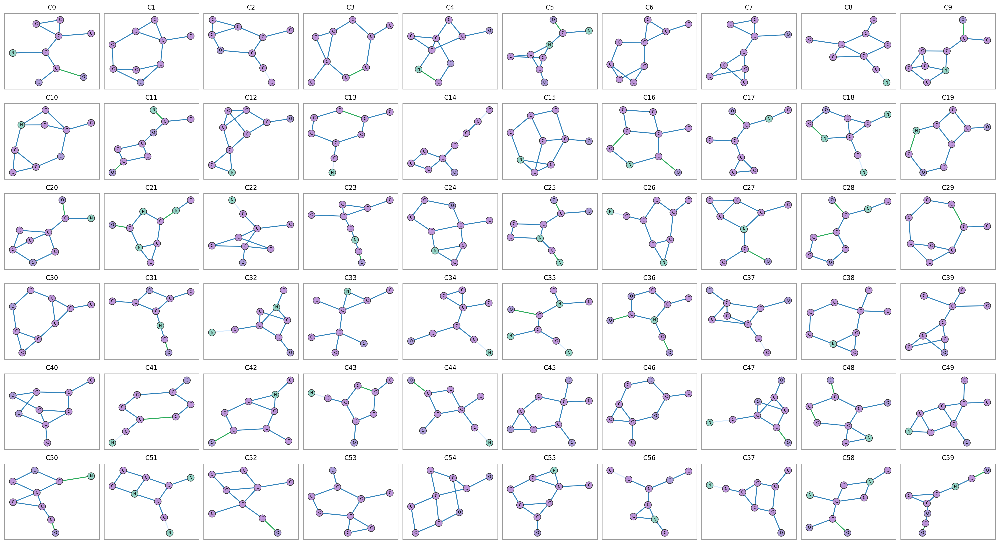

Held-out condition molecules - RDKit


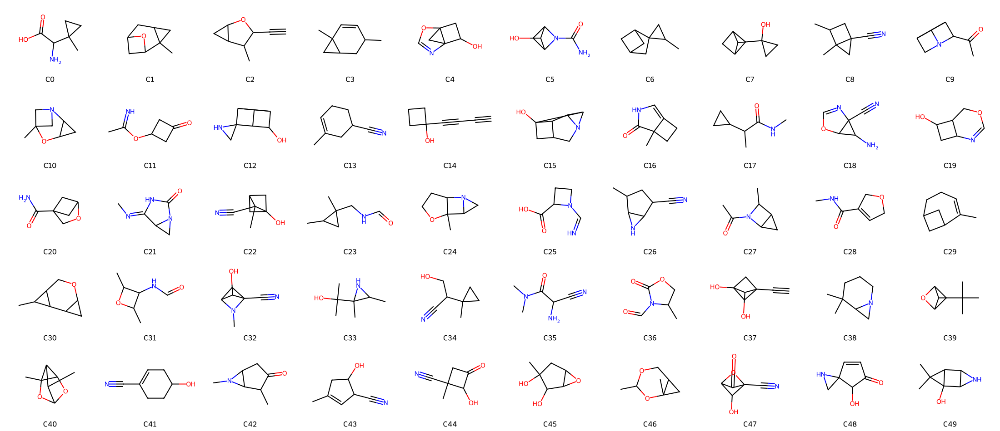

RDKit-valid: 60 / 60
Generated valid+novel molecules from those same conditions - NetworkX


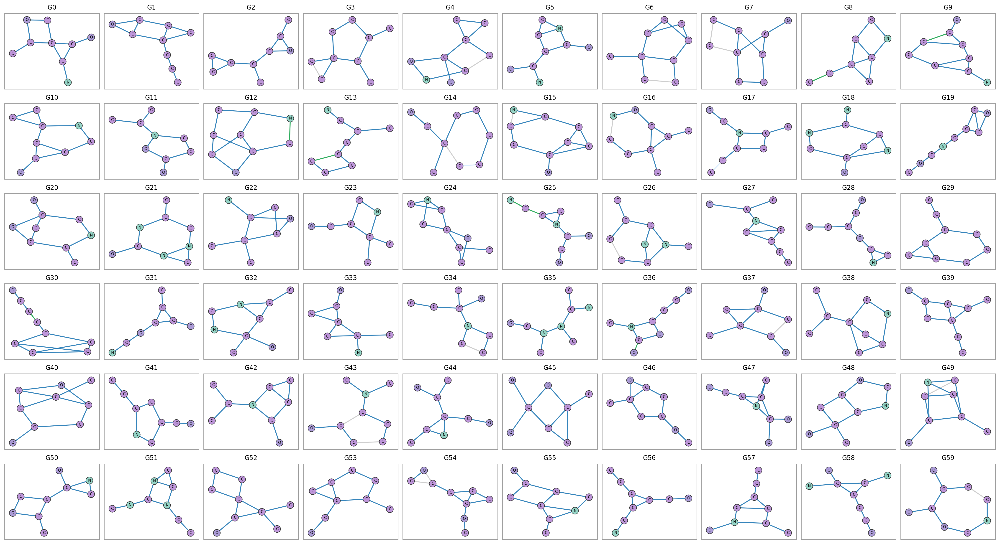

Generated valid+novel molecules from those same conditions - RDKit


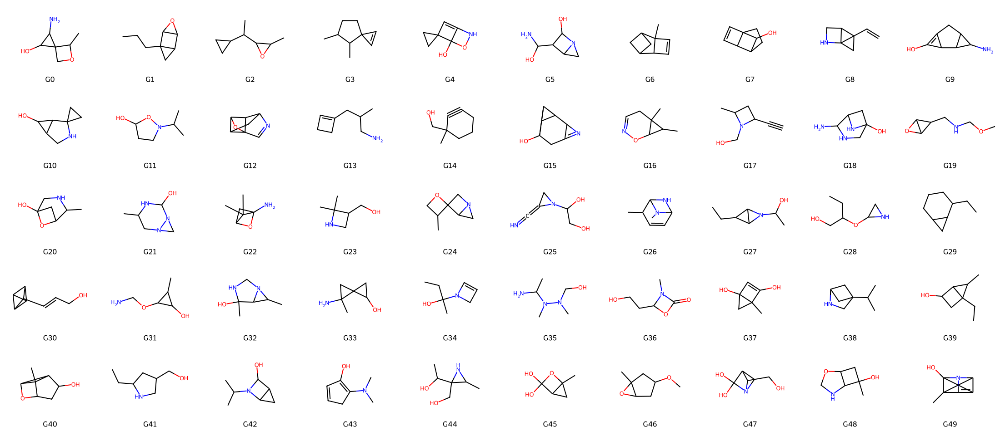

RDKit-valid: 60 / 60


In [ ]:
# ===== Alias old 10k decoded names to generated names =====
# Supports both old remote runs (`qm9_heldout_decoded_graphs_10k`) and new notebook runs
# (`qm9_heldout_generated_graphs_10k`).
required = ("qm9_heldout_10k_rows",)
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError("Run the 10k held-out cell first. Missing: " + ", ".join(missing))

if "qm9_heldout_generated_graphs_10k" not in globals():
    if "qm9_heldout_decoded_graphs_10k" in globals():
        qm9_heldout_generated_graphs_10k = qm9_heldout_decoded_graphs_10k
    else:
        raise RuntimeError(
            "Run the 10k held-out cell first. Missing generated graph list: "
            "qm9_heldout_generated_graphs_10k or qm9_heldout_decoded_graphs_10k."
        )

qm9_heldout_10k_rows = qm9_heldout_10k_rows.copy()
qm9_heldout_10k_rows["source"] = qm9_heldout_10k_rows["source"].replace({
    "decoded_from_heldout_conditions": "generated_from_heldout_conditions",
})

if "qm9_heldout_10k_summary" in globals():
    qm9_heldout_10k_summary = qm9_heldout_10k_summary.copy()
    qm9_heldout_10k_summary["source"] = qm9_heldout_10k_summary["source"].replace({
        "decoded_from_heldout_conditions": "generated_from_heldout_conditions",
    })

print("Ready to plot 10k generated-from-held-out results.")
# ===== Plot 10k held-out: condition vs generated valid+novel pairs =====
import pandas as pd
from IPython.display import display
from rdkit import Chem
from rdkit.Chem import AllChem, Draw

VALID_NOVEL_MATCH_DISPLAY_N = 60
VALID_NOVEL_MATCH_MOLS_PER_ROW = 10

required = (
    "qm9_heldout_condition_graphs_10k",
    "qm9_heldout_generated_graphs_10k",
    "qm9_heldout_10k_rows",
)
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError(
        "Run the 10k held-out cell and alias cell first. Missing: "
        + ", ".join(missing)
    )

rows = qm9_heldout_10k_rows.copy()
rows["source"] = rows["source"].replace({
    "decoded_from_heldout_conditions": "generated_from_heldout_conditions",
})

generated_valid_novel_rows = rows[
    (rows["source"] == "generated_from_heldout_conditions")
    & (rows["valid_rdkit"])
    & (rows["novel_vs_train"])
    & (rows["smiles"].notna())
].copy()

selected_indices = []
for idx in generated_valid_novel_rows["index"].astype(int).tolist():
    if idx >= len(qm9_heldout_condition_graphs_10k):
        continue
    if idx >= len(qm9_heldout_generated_graphs_10k):
        continue

    condition_mol, condition_error = qm9_graph_to_rdkit_safe(
        qm9_heldout_condition_graphs_10k[idx]
    )
    generated_mol, generated_error = qm9_graph_to_rdkit_safe(
        qm9_heldout_generated_graphs_10k[idx]
    )

    if (
        condition_error is None
        and condition_mol is not None
        and generated_error is None
        and generated_mol is not None
    ):
        selected_indices.append(idx)

    if len(selected_indices) >= VALID_NOVEL_MATCH_DISPLAY_N:
        break

condition_plot_graphs = []
generated_plot_graphs = []

for plot_i, idx in enumerate(selected_indices):
    condition_graph = qm9_heldout_condition_graphs_10k[idx].copy()
    generated_graph = qm9_heldout_generated_graphs_10k[idx].copy()

    condition_graph.graph["plot_title"] = f"C{plot_i}"
    generated_graph.graph["plot_title"] = f"G{plot_i}"

    condition_plot_graphs.append(condition_graph)
    generated_plot_graphs.append(generated_graph)

matched_index_table = pd.DataFrame({
    "plot_id": list(range(len(selected_indices))),
    "original_10k_index": selected_indices,
})
display(matched_index_table)

def _plot_rdkit_graph_grid(graphs, *, title, mols_per_row=10):
    mols = []
    legends = []
    errors = []

    for idx, graph in enumerate(graphs):
        mol, error = qm9_graph_to_rdkit_safe(graph)
        label = graph.graph.get("plot_title", str(idx))

        if error is None and mol is not None:
            try:
                AllChem.Compute2DCoords(mol)
            except Exception:
                pass
            mols.append(mol)
            legends.append(label)
        else:
            mols.append(Chem.MolFromSmiles(""))
            legends.append(f"{label} invalid")
            errors.append(error)

    print(title)
    if mols:
        display(Draw.MolsToGridImage(
            mols,
            molsPerRow=mols_per_row,
            subImgSize=(220, 190),
            legends=legends,
        ))
        print(f"RDKit-valid: {len(mols) - len(errors)} / {len(mols)}")
    else:
        print("No molecules to plot.")

print(
    f"Generated valid+novel rows available: {len(generated_valid_novel_rows)}. "
    f"Plotting {len(selected_indices)} matched condition/generated pairs."
)

print("Held-out condition molecules - NetworkX")
plot_networkx_graphs(
    condition_plot_graphs,
    n_cols=VALID_NOVEL_MATCH_MOLS_PER_ROW,
    graph_title_attr="plot_title",
    figsize_per_graph=(2.2, 2.0),
    node_label_attr="label",
    edge_label_attr="label",
    node_size=120,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
)

_plot_rdkit_graph_grid(
    condition_plot_graphs,
    title="Held-out condition molecules - RDKit",
    mols_per_row=VALID_NOVEL_MATCH_MOLS_PER_ROW,
)

print("Generated valid+novel molecules from those same conditions - NetworkX")
plot_networkx_graphs(
    generated_plot_graphs,
    n_cols=VALID_NOVEL_MATCH_MOLS_PER_ROW,
    graph_title_attr="plot_title",
    figsize_per_graph=(2.2, 2.0),
    node_label_attr="label",
    edge_label_attr="label",
    node_size=120,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
)

_plot_rdkit_graph_grid(
    generated_plot_graphs,
    title="Generated valid+novel molecules from those same conditions - RDKit",
    mols_per_row=VALID_NOVEL_MATCH_MOLS_PER_ROW,
)
